<a href="https://colab.research.google.com/github/Gus-oss/COVID-19/blob/main/MachineLearning_Covid19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Machine Learning: Análisis y técnicas de machine learning de los datos sobre influenza, COVID-19 y otros virus respiratorios.

## Paquetes por instalar

In [ ]:
!pip install pandas scikit-learn gower

In [ ]:
! pip install tensorflow

In [ ]:
!pip install imbalanced-learn

In [ ]:
!pip install kmodes

In [ ]:
! pip install prince

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.0/179.0 kB 11.1 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Librerias y creación de carpeta de imagenes.

In [ ]:
#Descargar la base de datos de drive
from google.colab import drive
from google.colab import files #descargar archivos

#Importamos las librerias que utilizaremos a lo largo del documento
import pandas as pd
import numpy as np
import statistics as stats   #utilizado en la parte estadistica descriptiva
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
import os #Se utilizo para guardar las imagenes (carpeta) y para guardar las imagenes en la carpeta
import plotly.graph_objects as go #esta libreria es para hacer graficos dinamicos
from statsmodels.graphics.gofplots import qqplot #se utilizo para hacer la grafica cuartil cuartil

# Librerias para Machine Learning
from sklearn.feature_selection import f_regression #para la seleccion de caracteristicas
from sklearn.preprocessing import MinMaxScaler #para tener todas las variables entre 0 y 1
from sklearn.feature_selection import VarianceThreshold #para la prueba de varianza
from sklearn.feature_selection import mutual_info_regression #para la prueba de seleccion mutua
from sklearn.linear_model import LinearRegression #regresion lineal simple
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS #Hace toda la combinatoria
#de las variables que tenemos en un conjunto de datos
from mlxtend.feature_selection import SequentialFeatureSelector as SFS #para la parte de sequential selector
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN #para agrupación
import gower #para dbscan con la metrica de gower
from sklearn.neighbors import NearestNeighbors# para la grafica del codo
from sklearn.metrics import silhouette_score #grafica del codo
from sklearn.manifold import TSNE #vizualizacion de cluster
from sklearn.decomposition import PCA #vizualizacion de cluster
from sklearn.preprocessing import MinMaxScaler #normalizacion de los datos
from sklearn.preprocessing import OneHotEncoder

#TensorFlow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.impute import SimpleImputer #imputar
import joblib #guardar mapeos
from sklearn.impute import SimpleImputer #imputar valores NaN
import tensorflow as tf #para el algoritmo (1-2)
from tensorflow.keras.utils import to_categorical #(2-2)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import confusion_matrix, classification_report #matriz de confusion para red neuronal
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

# Carpeta única para guardar las imágenes
# Carpeta única para guardar las imágenes
IMAGES_PATH = "Galeria"  # Nombre de la carpeta (puedes cambiarlo)
os.makedirs(IMAGES_PATH, exist_ok=True) # Crea la carpeta si no existe

def save_fig(fig_id, tight_layout=True, fig_extension="pdf", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Imagen guardada como ", fig_id, "en la carpeta", IMAGES_PATH) #Mensaje mas informativo
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

#Recomendación del Dr. Alberto Benavidez es generar imagenes en PDF para la creacion de articulos.
#A demas de antes de llamar la función, escribir plt.tight_layout() para quitar espacios
#inecesarios en las imagenes, este plt.tight_layout() ya se encuentra en la funcion pra guardar imagenes

In [ ]:
drive.mount('/content/drive') #coneccion con drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Obtencion de datos.

Totmamos la base de datos de la actualización del 4 de novimebre del 2025

In [ ]:
df_covid = pd.read_csv('/content/drive/MyDrive/Covid19_4-11-2025/COVID19MEXICO.csv')
#correr esta celda cuando el codigo de extraccion de datos automatico no funcione (que raro que siempre me pase en viernes)

/tmp/ipython-input-2809409969.py:1: DtypeWarning: Columns (40) have mixed types. Specify dtype option on import or set low_memory=False.
  df_covid = pd.read_csv('/content/drive/MyDrive/Covid19_4-11-2025/COVID19MEXICO.csv')


## Limpieza de la base de datos.

En este apartado nos encargaremos de checar valores nulos, formato de fechas, filas duplicadas y verificaremos errores al momento de capturar datos.

### Vizualisación de la base de datos

In [ ]:
df_covid #visualizamos la base de datos

,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,TIPO_PACIENTE,...,RESULTADO_PCR,RESULTADO_PCR_COINFECCION,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL_COVID,CLASIFICACION_FINAL_FLU,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
0,2025-11-04,167f1a,1,12,1,2,1,1,3,1,...,997,997,2,97,6,6,99,México,97,97
1,2025-11-04,g5963e1,1,12,9,1,9,9,13,1,...,5,5,2,97,7,7,99,México,97,97
2,2025-11-04,gbbb80b,1,4,20,2,20,20,413,1,...,997,997,2,97,6,6,99,México,97,97
3,2025-11-04,ga47252,1,12,9,1,9,9,13,1,...,5,5,2,97,7,7,99,México,97,97
4,2025-11-04,gd8311d,1,8,9,1,9,9,12,1,...,997,997,2,97,6,6,99,México,97,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131912,2025-11-04,g765ea2,1,3,21,1,21,21,73,2,...,999,999,2,97,6,6,99,México,97,2
131913,2025-11-04,g72e830,1,12,29,1,29,29,21,2,...,999,999,2,97,6,6,99,México,97,2
131914,2025-11-04,gd7d663,1,3,21,1,20,21,114,1,...,997,997,2,97,6,6,99,México,97,97
131915,2025-11-04,g68c89b,1,4,31,1,31,31,50,1,...,997,997,2,97,6,6,99,México,97,97


### Valores nulos

In [ ]:
# Revisión de valores faltantes (NaN)
# Verificamos cuántos valores faltantes hay por columna
valores_nulos = df_covid.isnull().sum()
print("Valores faltantes por columna:\n", valores_nulos)

Valores faltantes por columna:
 FECHA_ACTUALIZACION          0
ID_REGISTRO                  0
ORIGEN                       0
SECTOR                       0
ENTIDAD_UM                   0
SEXO                         0
ENTIDAD_NAC                  0
ENTIDAD_RES                  0
MUNICIPIO_RES                0
TIPO_PACIENTE                0
FECHA_INGRESO                0
FECHA_SINTOMAS               0
FECHA_DEF                    0
INTUBADO                     0
NEUMONIA                     0
EDAD                         0
NACIONALIDAD                 0
EMBARAZO                     0
HABLA_LENGUA_INDIG           0
INDIGENA                     0
DIABETES                     0
EPOC                         0
ASMA                         0
INMUSUPR                     0
HIPERTENSION                 0
OTRA_COM                     0
CARDIOVASCULAR               0
OBESIDAD                     0
RENAL_CRONICA                0
TABAQUISMO                   0
OTRO_CASO                    0
TOMA_MU

Podemos encontrar que en el conjunto de datos no hay datos faltantes.

### Fortmato Fechas

In [ ]:
# Revisión de tipos de datos
# Convertimos las columnas de fecha a formato datetime para análisis temporal
df_covid['FECHA_INGRESO']  = pd.to_datetime(
    df_covid['FECHA_INGRESO'],
    format="%Y-%m-%d",
    errors="coerce"
)

df_covid['FECHA_SINTOMAS'] = pd.to_datetime(
    df_covid['FECHA_SINTOMAS'],
    format="%Y-%m-%d",
    errors="coerce"
)

df_covid['FECHA_DEF']      = pd.to_datetime(
    df_covid['FECHA_DEF'],
    format="%Y-%m-%d",
    errors="coerce"
)

In [ ]:
df_covid["FECHA_INGRESO"].unique() #NO CUENTA CON VALORES NaT

<DatetimeArray>
['2025-04-21 00:00:00', '2025-01-02 00:00:00', '2025-01-01 00:00:00',
 '2025-10-10 00:00:00', '2025-04-09 00:00:00', '2025-06-15 00:00:00',
 '2025-08-28 00:00:00', '2025-01-24 00:00:00', '2025-11-02 00:00:00',
 '2025-05-01 00:00:00',
 ...
 '2025-10-23 00:00:00', '2025-10-24 00:00:00', '2025-10-25 00:00:00',
 '2025-10-26 00:00:00', '2025-10-27 00:00:00', '2025-10-31 00:00:00',
 '2025-10-28 00:00:00', '2025-10-30 00:00:00', '2025-11-01 00:00:00',
 '2025-11-03 00:00:00']
Length: 307, dtype: datetime64[ns]

In [ ]:
df_covid["FECHA_SINTOMAS"].unique() #No cuenta con valores NaT

<DatetimeArray>
['2025-04-20 00:00:00', '2025-01-01 00:00:00', '2025-01-02 00:00:00',
 '2025-10-10 00:00:00', '2025-04-09 00:00:00', '2025-06-12 00:00:00',
 '2025-08-28 00:00:00', '2025-01-24 00:00:00', '2025-11-01 00:00:00',
 '2025-04-30 00:00:00',
 ...
 '2025-10-23 00:00:00', '2025-10-24 00:00:00', '2025-10-25 00:00:00',
 '2025-10-26 00:00:00', '2025-10-27 00:00:00', '2025-10-29 00:00:00',
 '2025-10-30 00:00:00', '2025-10-31 00:00:00', '2025-11-02 00:00:00',
 '2025-11-03 00:00:00']
Length: 307, dtype: datetime64[ns]

In [ ]:
df_covid["FECHA_DEF"].unique()

<DatetimeArray>
[                'NaT', '2025-01-31 00:00:00', '2025-01-10 00:00:00',
 '2025-01-03 00:00:00', '2025-01-16 00:00:00', '2025-02-02 00:00:00',
 '2025-01-02 00:00:00', '2025-01-04 00:00:00', '2025-01-06 00:00:00',
 '2025-01-22 00:00:00',
 ...
 '2025-10-29 00:00:00', '2025-10-23 00:00:00', '2025-10-17 00:00:00',
 '2025-10-27 00:00:00', '2025-10-21 00:00:00', '2025-11-02 00:00:00',
 '2025-10-31 00:00:00', '2025-10-26 00:00:00', '2025-10-30 00:00:00',
 '2025-11-01 00:00:00']
Length: 306, dtype: datetime64[ns]

Al cambiar las fechas a datatime con el formato yyyy-mm-dd apreciamos que en la columna *FECHA_DEF* se encuentran valores NaT( conjunto original de datos se tenia como 9999-99-99, pero al hacer la conversion a datatime se colodaron NaT)  los cuales significan Not a Time, lo que quiere decir que no se tiene registro de fecha de defunción. Esto puede significar :


*   el paciente fallecio y no se registro la fecha de defunción
*   o el paciente no fallecio y se recupero

Se investiga cuantos NaT se tienen registrados en el conjunto de datos.

In [ ]:
# Contar los valores NaT en una columna específica
nat_count_fecha_def = df_covid['FECHA_DEF'].isna().sum()
print(f"Valores NaT en la columna FECHA_DEF: {nat_count_fecha_def}")

Valores NaT en la columna FECHA_DEF: 127002


In [ ]:
# Obtener el número de filas
num_filas = df_covid.shape[0]
print(f"El DataFrame tiene {num_filas} filas.")

El DataFrame tiene 131917 filas.


Como el numero de NaT que hay en la columna FECHA_DEF es muy cercano al numero de filas que tiene el dataframe df_covid se opto por no eliminar las filas que tengan NaT y se conservaran.

### Duplicados

In [ ]:
num_filas_original = df_covid.shape[0]
num_filas_unicas = df_covid.drop_duplicates().shape[0]
print(f"Total filas originales: {num_filas_original}")
print(f"Total filas únicas: {num_filas_unicas}")
#En caso de encontrar filas duplicadas se tendria que utilizar df_covid = df_covid.drop_duplicates()

Total filas originales: 131917
Total filas únicas: 131917


No se encontraron filas duplicadas en el conjunto de datos.

**texto en negrita**### Edad

In [ ]:
df_covid['EDAD'].unique()

array([  8,  54,  26,  36,  57,   2,  86,  23,  75,  18,  24,  47,  65,
        51,  69,  62,  10,  67,  30,  64,  29,  32,  40,   1,  19,   6,
        63,  39,  31,  25,  70,  33,  71,  37,  44,  28,  87,  49,   3,
        14,  56,  77,  27,  68,   4,  42,  72,  82,  17,  52,  73,  22,
         9,  88,  16,  53,  46,   7,  55,  76,  59,  61,  34, 102,  79,
        21,  48,  38,  41,  74,  85,  58,  60,  83,  80,  35,  45,  43,
        89,  94,  84,  66,  12,  50,  96,   5,  11,  13,  90,   0,  20,
        81,  95,  78,  15,  92,  91,  93,  98,  97,  99, 101, 103, 110,
       100, 105, 104, 106, 107, 108, 111, 121])

Verificamos que las edades estan correctas y que no hay errores de typing al momento de realizar la captura de las edades.

### Copias del dataframe

In [ ]:
df_covid_modelos = df_covid.copy()

## Estadistica Descriptiva.

En esta sección realizaremos:

- Comprobar si en el conjunto de datos son parametricos o no parametricos.
- Calcular estadisticos descriptivos básicos.
- Matriz de correlaciones.
- Realizar pruebas de hipótesis a partir de las conclusiones obtenidas en la matriz de correlación.
- Realizar graficos estadisticos.

### Estadisticos.

Realizamos un analisis de los estadisticos de media, moda y mediana a la variable EDAD del conjunto de datos.

In [ ]:
edades = df_covid['EDAD'].tolist()

print("Promedio:", stats.mean(edades))
print("Mediana :", stats.median(edades))
print("Moda(s) :", stats.multimode(edades))

Promedio: 36.13486510457333
Mediana : 34
Moda(s) : [1]


La mayoría de los casos de COVID-19 en este conjunto de datos corresponden a adultos jóvenes (aproximadamente 37 años, mediana 35 años). Sin embargo, la moda de 1 año sugiere un pico artificial o un sesgo: podría reflejar una alta proporción de casos en menores de 1 año.

Ahora realizamos un diagrama de cajas con vigotes para esta misma variable

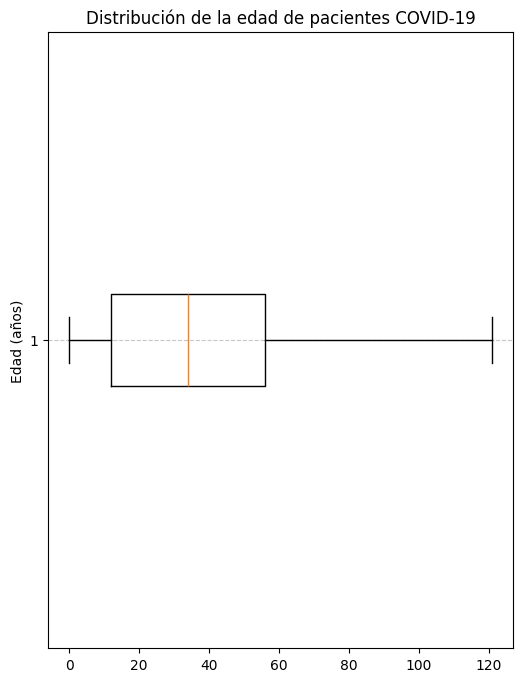

Imagen guardada como  boxplot_edad en la carpeta Galeria


<Figure size 640x480 with 0 Axes>

In [ ]:
# Elimina valores nulos si existen
edades = df_covid['EDAD']

plt.figure(figsize=(6, 8))
plt.boxplot(edades, vert=False)
plt.title('Distribución de la edad de pacientes COVID-19')
plt.ylabel('Edad (años)')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # líneas de referencia
plt.show()


save_fig("boxplot_edad", fig_extension="pdf")

Imagen guardada como  violinplot_edad en la carpeta Galeria


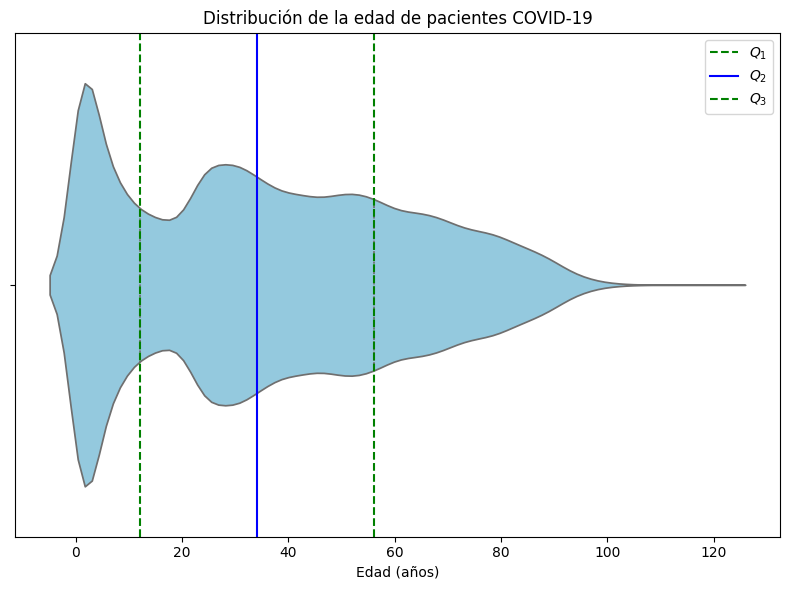

In [ ]:
plt.figure(figsize=(8,6))
sns.violinplot(x=df_covid['EDAD'], color="skyblue", inner="quartile")
plt.axvline(
    x = stats.quantiles(df_covid['EDAD'], n=4)[0],
    label = '$Q_1$',
    linestyle = '--',
    color = 'green'
)
plt.axvline(
    x = stats.quantiles(df_covid['EDAD'], n=4)[1],
    label = '$Q_2$',
    linestyle = '-',
    color = 'blue'
)
plt.axvline(
    x = stats.quantiles(df_covid['EDAD'], n=4)[2],
    label = '$Q_3$',
    linestyle = '--',
    color = 'green'
)
plt.legend()
plt.title("Distribución de la edad de pacientes COVID-19")
plt.xlabel("Edad (años)")

# Guardar la figura
save_fig("violinplot_edad", fig_extension="pdf")

plt.show()

Grafica Cuartil-cuartil de las edades del conjunto de datos del covid-19

Imagen guardada como  QQPlot_Edad en la carpeta Galeria


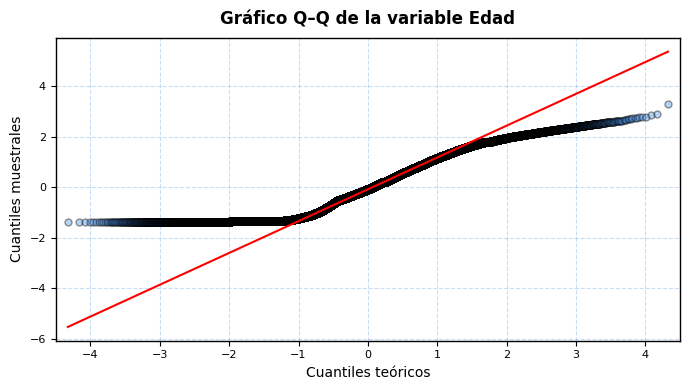

In [ ]:
# Gráfico Q-Q para la variable Edad
# ==============================================================================

import statsmodels.api as sm
import matplotlib.pyplot as plt

# Figura
fig, ax = plt.subplots(figsize=(7, 4), facecolor='white')

# Crear el Q-Q plot
qq = sm.qqplot(
    df_covid["EDAD"].dropna(),
    fit=True,
    line='q',
    alpha=0.4,
    lw=2,
    ax=ax,
    marker='o',
    markerfacecolor="#4A90E2",
    markeredgecolor="black",
    markersize=5
)

# Estilo científico
ax.set_facecolor('white')
ax.set_title('Gráfico Q–Q de la variable Edad', fontsize=12, fontweight="bold", pad=10)
ax.set_xlabel('Cuantiles teóricos', fontsize=10)
ax.set_ylabel('Cuantiles muestrales', fontsize=10)
ax.tick_params(labelsize=8)
ax.grid(alpha=0.3, linestyle='--', color='#4A90E2')

# Límites visibles (bordes negros)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1)

# Guardar en alta resolución
save_fig("QQPlot_Edad", fig_extension="pdf", resolution=300)
plt.tight_layout()
plt.show()

De acuerdo a la grafica, se sospecha que la muestra respecto a las edades no es parametrica.

realizamos su histograma

Imagen guardada como  Histograma_Edad_Frecuencia en la carpeta Galeria


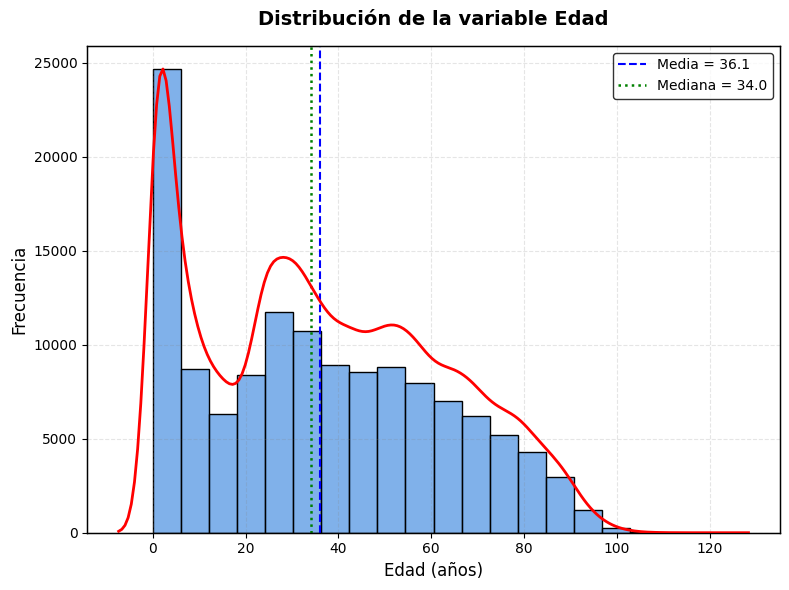

In [ ]:
# Cálculo de media y mediana
media = np.mean(df_covid["EDAD"])
mediana = np.median(df_covid["EDAD"])

# Figura con fondo blanco y bordes visibles
plt.figure(figsize=(8,6), facecolor="white")
ax = sns.histplot(
    df_covid["EDAD"],
    bins=20,
    color="#4A90E2",
    stat="count",
    edgecolor="black",
    alpha=0.7
)

# Curva KDE escalada visualmente
ax2 = ax.twinx()  # Eje secundario para la curva KDE
sns.kdeplot(df_covid["EDAD"], color="red", linewidth=2, ax=ax2)
ax2.set_ylabel("")      # Quitar etiqueta del eje derecho
ax2.set_yticks([])      # Quitar ticks del eje derecho
ax2.set_ylim(0, None)   # Ajuste automático de límites

# Líneas de referencia
ax.axvline(media, color="blue", linestyle="--", linewidth=1.5, label=f"Media = {media:.1f}")
ax.axvline(mediana, color="green", linestyle=":", linewidth=1.8, label=f"Mediana = {mediana:.1f}")

# Estilo científico con fondo blanco y ejes visibles
ax.set_facecolor("white")  # Fondo del área de dibujo blanco
ax.set_title("Distribución de la variable Edad", fontsize=14, fontweight="bold", pad=15)
ax.set_xlabel("Edad (años)", fontsize=12)
ax.set_ylabel("Frecuencia", fontsize=12)
ax.legend(fontsize=10, frameon=True, edgecolor="black")
ax.grid(alpha=0.2, linestyle="--", color="gray")

# Mostrar los límites del marco (mantener bordes visibles)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color("black")
    spine.set_linewidth(1.0)

# Guardar figura en alta resolución con fondo blanco
plt.tight_layout()
save_fig("Histograma_Edad_Frecuencia", fig_extension="pdf", resolution=300)
plt.show()

In [ ]:
from scipy import stats
#prueba de hormalidad de la variable edad
edad = df_covid["EDAD"].dropna()

shapiro_stat, shapiro_p = stats.shapiro(edad)
print(f"Shapiro-Wilk:       Estadístico = {shapiro_stat:.4f},  p-valor = {shapiro_p:.4e}")

Shapiro-Wilk:       Estadístico = 0.9508,  p-valor = 4.2596e-99


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 131917.
  res = hypotest_fun_out(*samples, **kwds)


Las edades de los pacientes no siguen una distribucion normal.

### Correlaciones

In [ ]:
df_covid.columns

Index(['FECHA_ACTUALIZACION', 'ID_REGISTRO', 'ORIGEN', 'SECTOR', 'ENTIDAD_UM',
       'SEXO', 'ENTIDAD_NAC', 'ENTIDAD_RES', 'MUNICIPIO_RES', 'TIPO_PACIENTE',
       'FECHA_INGRESO', 'FECHA_SINTOMAS', 'FECHA_DEF', 'INTUBADO', 'NEUMONIA',
       'EDAD', 'NACIONALIDAD', 'EMBARAZO', 'HABLA_LENGUA_INDIG', 'INDIGENA',
       'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION', 'OTRA_COM',
       'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO',
       'OTRO_CASO', 'TOMA_MUESTRA_LAB', 'RESULTADO_PCR',
       'RESULTADO_PCR_COINFECCION', 'TOMA_MUESTRA_ANTIGENO',
       'RESULTADO_ANTIGENO', 'CLASIFICACION_FINAL_COVID',
       'CLASIFICACION_FINAL_FLU', 'MIGRANTE', 'PAIS_NACIONALIDAD',
       'PAIS_ORIGEN', 'UCI'],
      dtype='object')

PREPARACIÓN DE DATOS

Recodificando comorbilidades:
  1 (Sí) → 1
  2 (No) → 0
  98 (No se sabe) → NaN

Recodificando CLASIFICACION_FINAL_COVID:
  1,2,3 (COVID Positivo) → 1
  7 (COVID Negativo) → 0

Datos originales: 131917 registros
Datos limpios: 79989 registros
Registros eliminados: 51928

CÁLCULO DE CORRELACIONES

Calculando matriz de correlación de Pearson (todas las variables binarias)...
✓ Matriz de correlación calculada

GENERANDO VISUALIZACIÓN
Imagen guardada como Matriz_Correlacion_Pearson_COVID19_Binarias en la carpeta Galeria


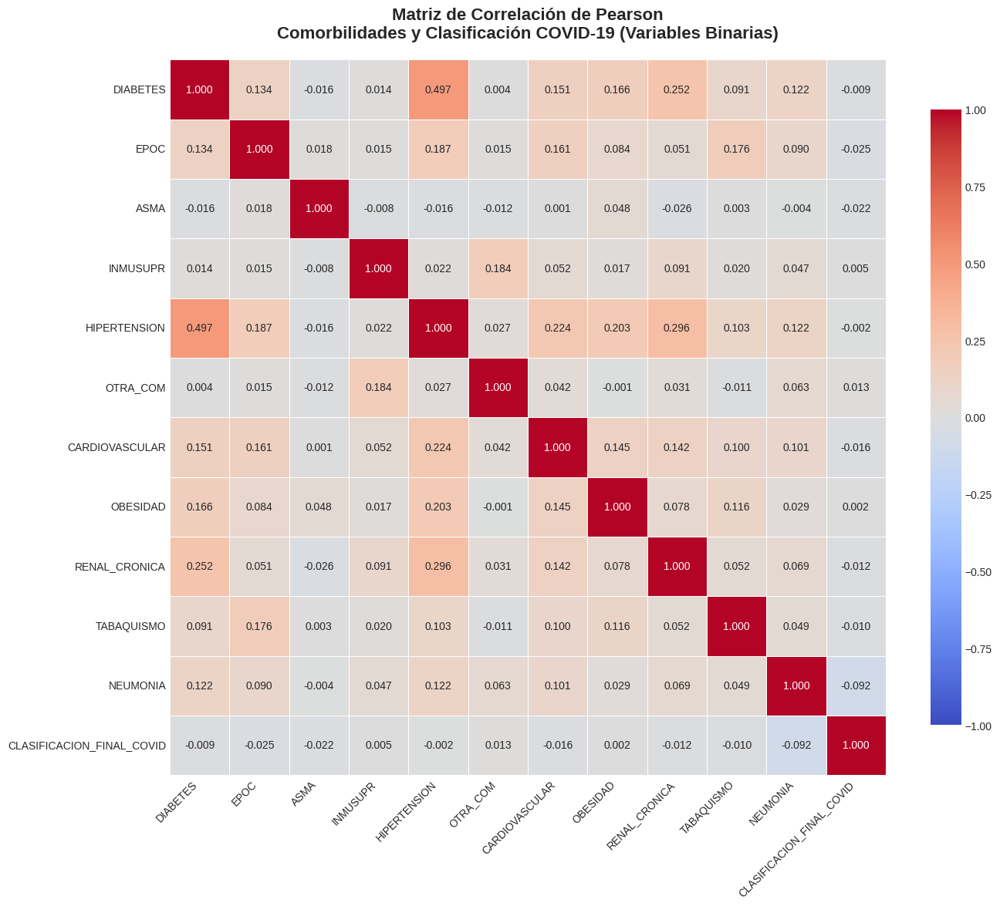


CORRELACIONES CON CLASIFICACIÓN COVID-19

Correlaciones de Pearson con COVID-19:
OTRA_COM          0.012813
INMUSUPR          0.004923
OBESIDAD          0.001717
HIPERTENSION     -0.001510
DIABETES         -0.009151
TABAQUISMO       -0.009909
RENAL_CRONICA    -0.011777
CARDIOVASCULAR   -0.016172
ASMA             -0.022009
EPOC             -0.024819
NEUMONIA         -0.091626
Imagen guardada como Correlaciones_Comorbilidades_COVID19 en la carpeta Galeria


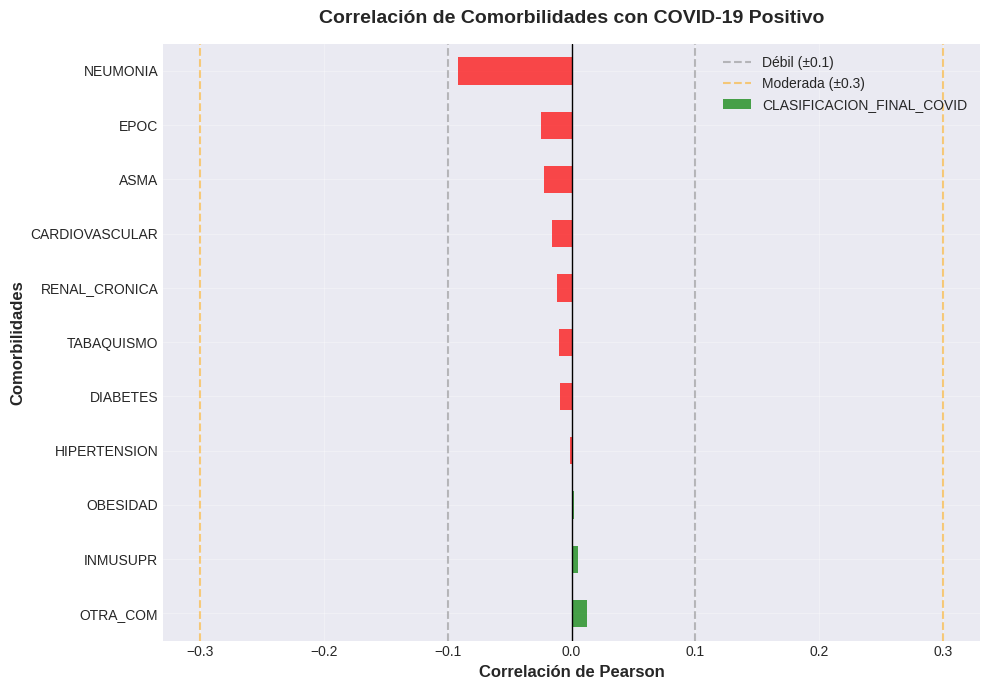


CORRELACIONES MÁS FUERTES (|r| > 0.15)
  Variable 1     Variable 2  Correlación  |Correlación|
    DIABETES   HIPERTENSION     0.496709       0.496709
HIPERTENSION  RENAL_CRONICA     0.295538       0.295538
    DIABETES  RENAL_CRONICA     0.252082       0.252082
HIPERTENSION CARDIOVASCULAR     0.223683       0.223683
HIPERTENSION       OBESIDAD     0.203395       0.203395
        EPOC   HIPERTENSION     0.187278       0.187278
    INMUSUPR       OTRA_COM     0.184005       0.184005
        EPOC     TABAQUISMO     0.175761       0.175761
    DIABETES       OBESIDAD     0.166239       0.166239
        EPOC CARDIOVASCULAR     0.160768       0.160768
    DIABETES CARDIOVASCULAR     0.150683       0.150683

RESUMEN ESTADÍSTICO

Total de pacientes analizados: 79,989
Pacientes COVID Positivo: 6,925 (8.66%)
Pacientes COVID Negativo: 73,064 (91.34%)

Prevalencia de comorbilidades:
  DIABETES: 16.21%
  EPOC: 4.69%
  ASMA: 4.94%
  INMUSUPR: 4.74%
  HIPERTENSION: 19.46%
  OTRA_COM: 7.28%
  CARDIO

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# ============================================================
# CONFIGURACIÓN DE GUARDADO DE IMÁGENES
# ============================================================
IMAGES_PATH = "Galeria"
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="pdf", resolution=300):
    """Guarda la figura en la carpeta especificada"""
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print(f"Imagen guardada como {fig_id} en la carpeta {IMAGES_PATH}")
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

# ============================================================
# PASO 1: PREPARACIÓN DE DATOS
# ============================================================

# Lista de variables de interés
variables_interes = [
    'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION',
    'OTRA_COM', 'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA',
    'TABAQUISMO', 'NEUMONIA', 'CLASIFICACION_FINAL_COVID'
]

# Variables binarias (comorbilidades)
variables_comorbilidades = [
    'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION',
    'OTRA_COM', 'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA',
    'TABAQUISMO', 'NEUMONIA'
]

# Crear dataframe temporal para correlaciones
print("="*70)
print("PREPARACIÓN DE DATOS")
print("="*70)
cor = df_covid[variables_interes].copy()
cor = cor[cor["CLASIFICACION_FINAL_COVID"].isin([1, 2, 3, 7])]
#Se realizo la filtracion por que 4,5,6 no aplican para la muestra

# RECODIFICACIÓN DE VARIABLES BINARIAS (COMORBILIDADES)
print("\nRecodificando comorbilidades:")
print("  1 (Sí) → 1")
print("  2 (No) → 0")
print("  98 (No se sabe) → NaN")

for var in variables_comorbilidades:
    cor[var] = cor[var].replace(98, np.nan)
    cor[var] = cor[var].replace(2, 0)

# RECODIFICACIÓN DE CLASIFICACION_FINAL_COVID
print("\nRecodificando CLASIFICACION_FINAL_COVID:")
print("  1,2,3 (COVID Positivo) → 1")
print("  7 (COVID Negativo) → 0")

cor['CLASIFICACION_FINAL_COVID'] = cor['CLASIFICACION_FINAL_COVID'].apply(
    lambda x: 1 if x in [1,2,3] else 0
)

# Eliminar filas con valores faltantes
cor = cor.dropna()

# Asegurar que todas las variables sean binarias (0 o 1)
for var in variables_interes:
    cor[var] = cor[var].astype(int)
    assert cor[var].isin([0, 1]).all(), f"La variable {var} contiene valores diferentes a 0 y 1"

print(f"\nDatos originales: {len(df_covid)} registros")
print(f"Datos limpios: {len(cor)} registros")
print(f"Registros eliminados: {len(df_covid) - len(cor)}")

# ============================================================
# PASO 2: CALCULAR MATRIZ DE CORRELACIÓN (PEARSON)
# ============================================================
print("\n" + "="*70)
print("CÁLCULO DE CORRELACIONES")
print("="*70)
print("\nCalculando matriz de correlación de Pearson (todas las variables binarias)...")

# Calcular correlación de Pearson
matriz_correlacion = cor[variables_interes].corr(method='pearson')

print("✓ Matriz de correlación calculada")

# ============================================================
# PASO 3: VISUALIZACIÓN
# ============================================================
print("\n" + "="*70)
print("GENERANDO VISUALIZACIÓN")
print("="*70)

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(matriz_correlacion,
            annot=True,
            fmt='.3f',
            cmap='coolwarm',
            square=True,
            linewidths=0.5,
            cbar_kws={"shrink": 0.8},
            center=0,
            vmin=-1,
            vmax=1,
            ax=ax)

ax.set_title("Matriz de Correlación de Pearson\nComorbilidades y Clasificación COVID-19 (Variables Binarias)",
             fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('')
ax.set_ylabel('')

# Rotar etiquetas para mejor legibilidad
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

save_fig('Matriz_Correlacion_Pearson_COVID19_Binarias', tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

# ============================================================
# PASO 4: ANÁLISIS DE CORRELACIONES CON COVID-19
# ============================================================
print("\n" + "="*70)
print("CORRELACIONES CON CLASIFICACIÓN COVID-19")
print("="*70)

# Extraer correlaciones con COVID-19
covid_correlations = matriz_correlacion['CLASIFICACION_FINAL_COVID'].drop('CLASIFICACION_FINAL_COVID').sort_values(ascending=False)

print("\nCorrelaciones de Pearson con COVID-19:")
print(covid_correlations.to_string())

# Visualización de correlaciones con COVID
fig2, ax2 = plt.subplots(figsize=(10, 7))
colors = ['green' if x > 0 else 'red' for x in covid_correlations.values]
covid_correlations.plot(kind='barh', ax=ax2, color=colors, alpha=0.7)

ax2.set_xlabel("Correlación de Pearson", fontsize=12, fontweight='bold')
ax2.set_ylabel("Comorbilidades", fontsize=12, fontweight='bold')
ax2.set_title("Correlación de Comorbilidades con COVID-19 Positivo",
             fontsize=14, fontweight='bold', pad=15)

# Líneas de referencia
ax2.axvline(x=0, color='black', linestyle='-', linewidth=1)
ax2.axvline(x=0.1, color='gray', linestyle='--', alpha=0.5, label='Débil (±0.1)')
ax2.axvline(x=-0.1, color='gray', linestyle='--', alpha=0.5)
ax2.axvline(x=0.3, color='orange', linestyle='--', alpha=0.5, label='Moderada (±0.3)')
ax2.axvline(x=-0.3, color='orange', linestyle='--', alpha=0.5)

ax2.legend(loc='best')
ax2.grid(True, alpha=0.3)

save_fig('Correlaciones_Comorbilidades_COVID19', tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

# ============================================================
# PASO 5: ANÁLISIS DE CORRELACIONES MÁS FUERTES
# ============================================================
print("\n" + "="*70)
print("CORRELACIONES MÁS FUERTES (|r| > 0.15)")
print("="*70)

def encontrar_correlaciones_fuertes(matriz, umbral=0.15):
    """Encuentra las correlaciones más fuertes en la matriz"""
    correlaciones = []

    for i in range(len(matriz)):
        for j in range(i+1, len(matriz.columns)):
            var1 = matriz.index[i]
            var2 = matriz.columns[j]
            valor = matriz.iloc[i, j]
            valor_abs = abs(valor)

            if valor_abs >= umbral:
                correlaciones.append({
                    'Variable 1': var1,
                    'Variable 2': var2,
                    'Correlación': valor,
                    '|Correlación|': valor_abs
                })

    return pd.DataFrame(correlaciones).sort_values('|Correlación|', ascending=False)

correlaciones_fuertes = encontrar_correlaciones_fuertes(matriz_correlacion, umbral=0.15)

if len(correlaciones_fuertes) > 0:
    print(correlaciones_fuertes.to_string(index=False))
else:
    print("No se encontraron correlaciones superiores a 0.15")

# ============================================================
# PASO 6: RESUMEN ESTADÍSTICO
# ============================================================
print("\n" + "="*70)
print("RESUMEN ESTADÍSTICO")
print("="*70)

print(f"\nTotal de pacientes analizados: {len(cor):,}")
print(f"Pacientes COVID Positivo: {cor['CLASIFICACION_FINAL_COVID'].sum():,} ({cor['CLASIFICACION_FINAL_COVID'].mean()*100:.2f}%)")
print(f"Pacientes COVID Negativo: {(1-cor['CLASIFICACION_FINAL_COVID']).sum():,} ({(1-cor['CLASIFICACION_FINAL_COVID'].mean())*100:.2f}%)")

print("\nPrevalencia de comorbilidades:")
for var in variables_comorbilidades:
    prevalencia = cor[var].mean() * 100
    print(f"  {var}: {prevalencia:.2f}%")

print("\n" + "="*70)
print("ANÁLISIS COMPLETADO")
print("="*70)
print("\nInterpretación de Correlación de Pearson:")
print("  |r| < 0.10: Asociación muy débil")
print("  0.10 ≤ |r| < 0.30: Asociación débil")
print("  0.30 ≤ |r| < 0.50: Asociación moderada")
print("  |r| ≥ 0.50: Asociación fuerte")
print("\nNota: Para variables binarias, el coeficiente de Pearson es equivalente")
print("      al coeficiente phi (φ) y es apropiado para este tipo de datos.")

### Distribuciones de casos positivos por entidad

In [ ]:
df_covid["ENTIDAD_RES"].unique()

array([ 1,  9, 20, 21,  8, 32, 10,  7,  2, 17, 13, 30, 19, 31, 22, 25, 24,
       14, 15, 28, 29, 11, 23, 16, 26,  3, 18,  5, 27,  4, 12,  6])

Imagen guardada como Casos_etnidad en la carpeta Galeria


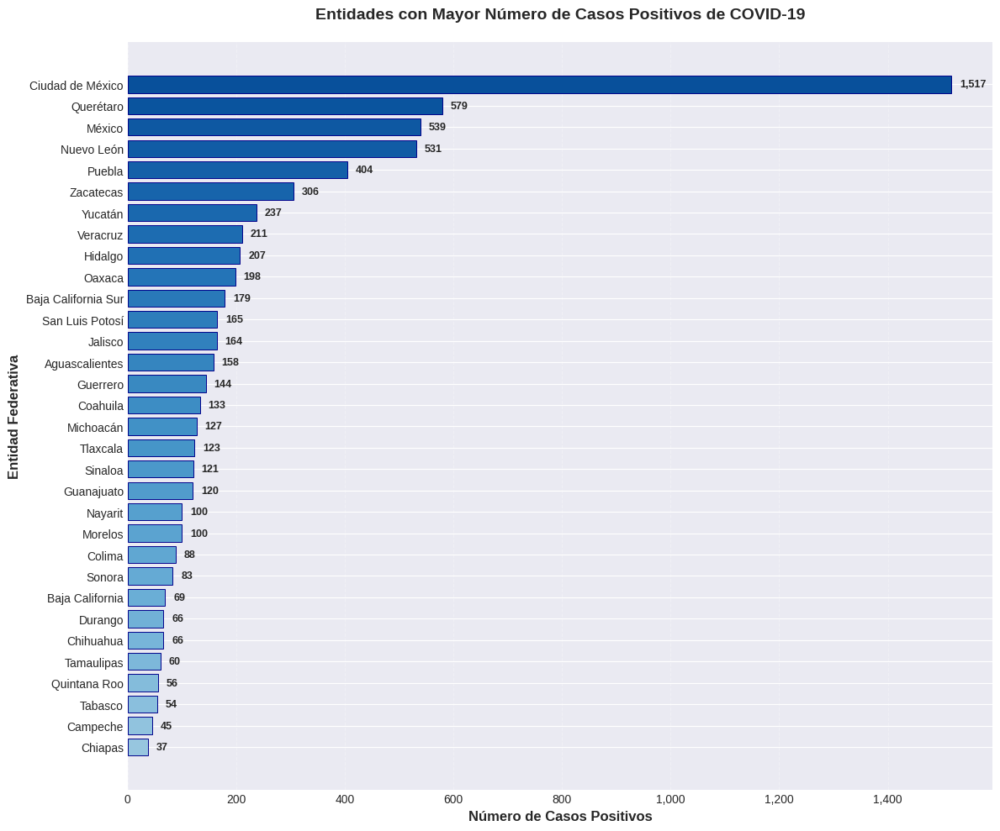


TOP 10 ENTIDADES CON MÁS CASOS POSITIVOS DE COVID-19
 1. Ciudad de México         :      1,517 casos
 2. Querétaro                :        579 casos
 3. México                   :        539 casos
 4. Nuevo León               :        531 casos
 5. Puebla                   :        404 casos
 6. Zacatecas                :        306 casos
 7. Yucatán                  :        237 casos
 8. Veracruz                 :        211 casos
 9. Hidalgo                  :        207 casos
10. Oaxaca                   :        198 casos


In [ ]:
# Diccionario de mapeo de claves a nombres de entidades
entidades_dict = {
    1: 'Aguascalientes',
    2: 'Baja California',
    3: 'Baja California Sur',
    4: 'Campeche',
    5: 'Coahuila',
    6: 'Colima',
    7: 'Chiapas',
    8: 'Chihuahua',
    9: 'Ciudad de México',
    10: 'Durango',
    11: 'Guanajuato',
    12: 'Guerrero',
    13: 'Hidalgo',
    14: 'Jalisco',
    15: 'México',
    16: 'Michoacán',
    17: 'Morelos',
    18: 'Nayarit',
    19: 'Nuevo León',
    20: 'Oaxaca',
    21: 'Puebla',
    22: 'Querétaro',
    23: 'Quintana Roo',
    24: 'San Luis Potosí',
    25: 'Sinaloa',
    26: 'Sonora',
    27: 'Tabasco',
    28: 'Tamaulipas',
    29: 'Tlaxcala',
    30: 'Veracruz',
    31: 'Yucatán',
    32: 'Zacatecas'
}

# Filtrar solo casos positivos de COVID (valores 1, 2, 3)
df_positivos = df_covid[df_covid['CLASIFICACION_FINAL_COVID'].isin([1, 2, 3])]

# Contar casos por entidad
casos_por_entidad = df_positivos['ENTIDAD_RES'].value_counts().sort_values(ascending=True)

# Mapear los códigos a nombres de entidades
casos_por_entidad.index = casos_por_entidad.index.map(entidades_dict)

# Crear la gráfica horizontal
plt.figure(figsize=(12, 10))
colores = plt.cm.Blues(range(100, 256, int(156/len(casos_por_entidad))))
barras = plt.barh(range(len(casos_por_entidad)), casos_por_entidad.values, color=colores, edgecolor='darkblue', linewidth=0.7)

# Personalización de la gráfica
plt.xlabel('Número de Casos Positivos', fontsize=12, fontweight='bold')
plt.ylabel('Entidad Federativa', fontsize=12, fontweight='bold')
plt.title('Entidades con Mayor Número de Casos Positivos de COVID-19', fontsize=14, fontweight='bold', pad=20)
plt.yticks(range(len(casos_por_entidad)), casos_por_entidad.index, fontsize=10)

# Agregar valores al final de las barras
for i, (barra, valor) in enumerate(zip(barras, casos_por_entidad.values)):
    plt.text(barra.get_width() + max(casos_por_entidad.values)*0.01, barra.get_y() + barra.get_height()/2,
             f'{int(valor):,}', ha='left', va='center', fontsize=9, fontweight='bold')

# Formato del eje X con separadores de miles
ax = plt.gca()
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))

plt.grid(axis='x', alpha=0.3, linestyle='--')
plt.tight_layout()
save_fig("Casos_etnidad", tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

# Mostrar top 10 entidades con más casos
print("\n" + "="*60)
print("TOP 10 ENTIDADES CON MÁS CASOS POSITIVOS DE COVID-19")
print("="*60)
for i, (entidad, casos) in enumerate(casos_por_entidad.sort_values(ascending=False).head(10).items(), 1):
    print(f"{i:2d}. {entidad:25s}: {casos:>10,} casos")
print("="*60)

### Linea del tiempo sintomas

Imagen guardada como Ingresos_def_sin en la carpeta Galeria


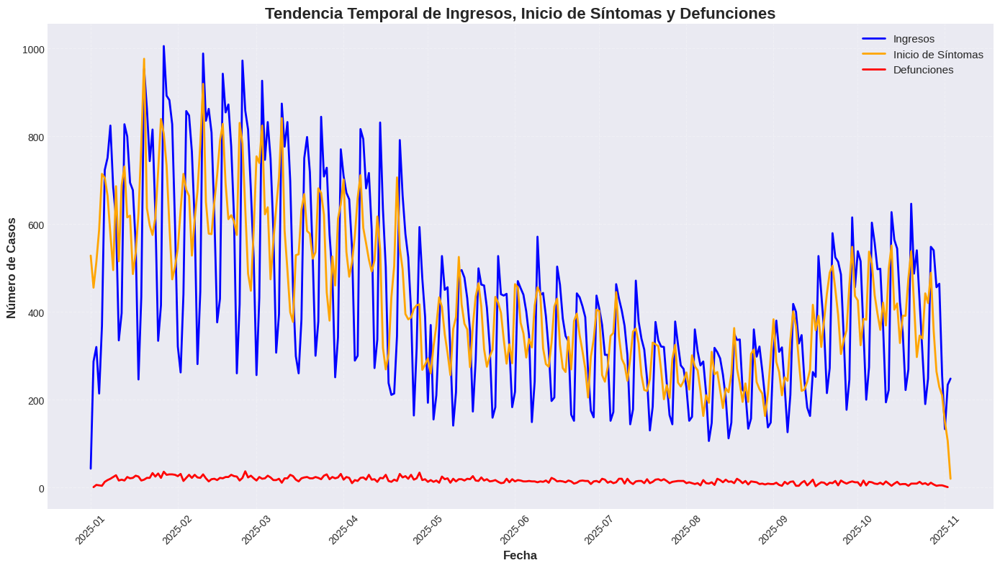

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Agrupamos los datos por fecha y contamos el número de ocurrencias
ingresos_por_dia = df_covid['FECHA_INGRESO'].value_counts().sort_index()
sintomas_por_dia = df_covid['FECHA_SINTOMAS'].value_counts().sort_index()
defunciones_por_dia = df_covid['FECHA_DEF'].value_counts().sort_index()

# Gráfico estático con Matplotlib
plt.figure(figsize=(14, 8))

# Ingresos
plt.plot(ingresos_por_dia.index, ingresos_por_dia.values, label='Ingresos', color='blue', linewidth=2)

# Inicio de síntomas
plt.plot(sintomas_por_dia.index, sintomas_por_dia.values, label='Inicio de Síntomas', color='orange', linewidth=2)

# Defunciones
plt.plot(defunciones_por_dia.index, defunciones_por_dia.values, label='Defunciones', color='red', linewidth=2)

# Ajustes finales del gráfico
plt.title('Tendencia Temporal de Ingresos, Inicio de Síntomas y Defunciones', fontsize=16, fontweight='bold')
plt.xlabel('Fecha', fontsize=12, fontweight='bold')
plt.ylabel('Número de Casos', fontsize=12, fontweight='bold')
plt.legend(fontsize=11, loc='best')
plt.grid(True, alpha=0.3, linestyle='--')
plt.xticks(rotation=45)

plt.tight_layout()

# Guardar la figura
save_fig("Ingresos_def_sin", tight_layout=True, fig_extension="pdf", resolution=300)

# Mostrar la gráfica estática
plt.show()

### Distribucion por sexo

Distribución de casos por género:
SEXO
Mujer     73454
Hombre    58463
Name: count, dtype: int64

Total de casos: 131,917
Imagen guardada como genero en la carpeta Galeria


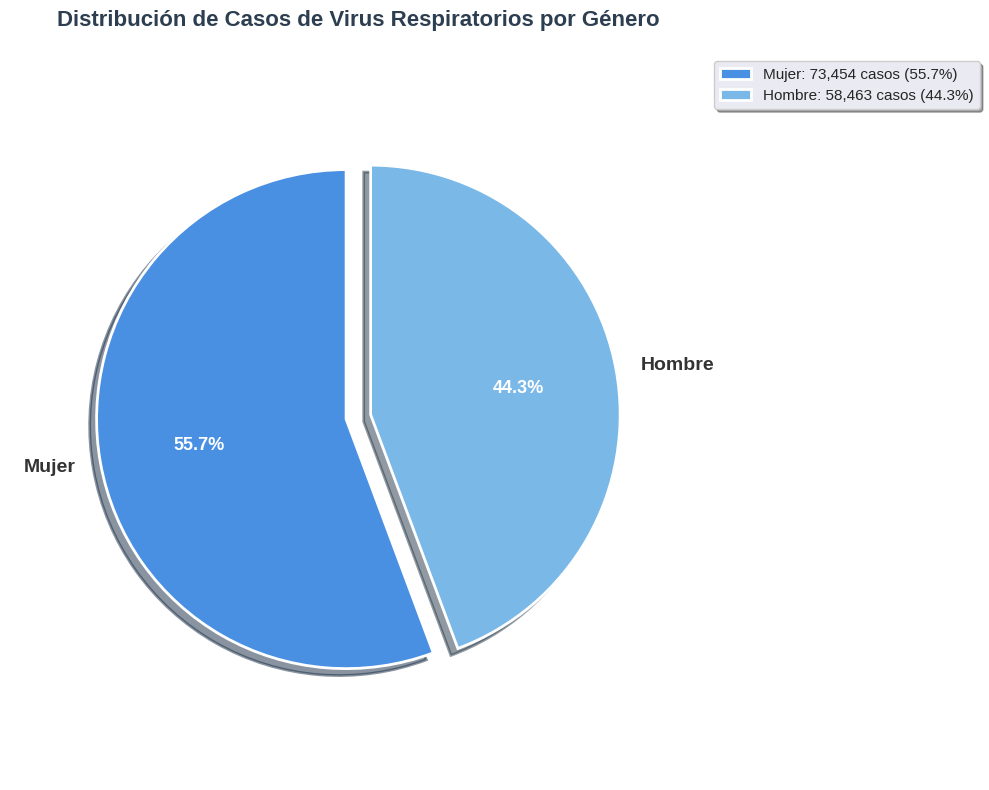

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Contamos el número de casos por género
casos_por_genero = df_covid['SEXO'].value_counts()

# Creamos etiquetas más descriptivas
etiquetas_genero = {1: 'Mujer', 2: 'Hombre'}
casos_por_genero.index = casos_por_genero.index.map(etiquetas_genero)

# Imprimimos la distribución de casos por género
print("Distribución de casos por género:")
print(casos_por_genero)
print(f"\nTotal de casos: {casos_por_genero.sum():,}")

# Configuración de colores profesionales (tonos azules para tu paper)
colores = ['#4A90E2', '#7AB8E8']  # Azul medio y azul claro
colores_borde = ['#2E5C8A', '#4A7BA7']  # Bordes más oscuros

# Visualizamos la distribución de casos por género
fig, ax = plt.subplots(figsize=(10, 8))

wedges, texts, autotexts = ax.pie(
    casos_por_genero,
    labels=casos_por_genero.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=colores,
    explode=(0.05, 0.05),  # Separa ligeramente las secciones
    shadow=True,
    wedgeprops={
        'edgecolor': 'white',
        'linewidth': 2,
        'antialiased': True
    }
)

# Personalización del texto
for text in texts:
    text.set_fontsize(14)
    text.set_fontweight('bold')
    text.set_color('#333333')

for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(13)
    autotext.set_fontweight('bold')

# Añadir leyenda con información adicional
leyenda_labels = [f'{genero}: {casos:,} casos ({casos/casos_por_genero.sum()*100:.1f}%)'
                  for genero, casos in casos_por_genero.items()]
ax.legend(leyenda_labels, loc='upper left', bbox_to_anchor=(1, 1), fontsize=11, frameon=True, shadow=True)

# Título más profesional
plt.title('Distribución de Casos de Virus Respiratorios por Género',
          fontsize=16, fontweight='bold', pad=20, color='#2C3E50')

plt.axis('equal')

# Guardamos la figura
save_fig("genero", tight_layout=True, fig_extension="pdf", resolution=300)

plt.tight_layout()
plt.show()

Imagen guardada como Casos_por_estado_y_genero en la carpeta Galeria


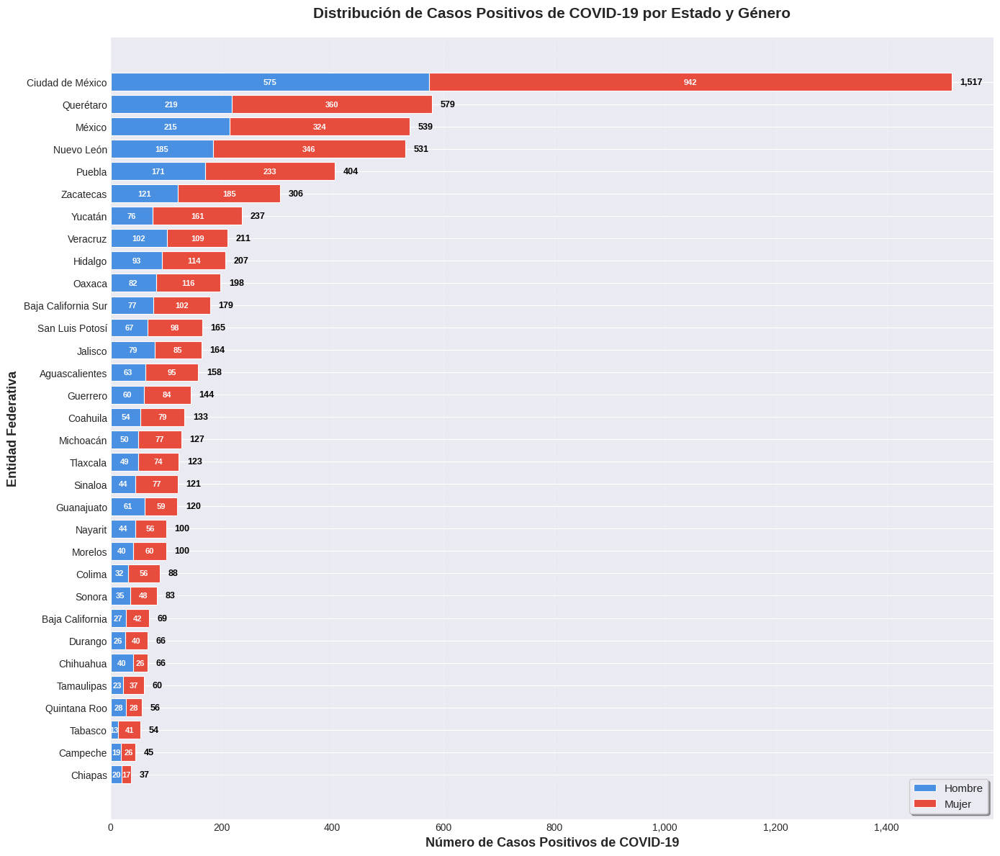


TOP 10 ESTADOS CON MÁS CASOS - DISTRIBUCIÓN POR GÉNERO
Estado                         Hombres      Mujeres        Total  % Hombres
--------------------------------------------------------------------------------
Ciudad de México                   575          942        1,517      37.9%
Querétaro                          219          360          579      37.8%
México                             215          324          539      39.9%
Nuevo León                         185          346          531      34.8%
Puebla                             171          233          404      42.3%
Zacatecas                          121          185          306      39.5%
Yucatán                             76          161          237      32.1%
Veracruz                           102          109          211      48.3%
Hidalgo                             93          114          207      44.9%
Oaxaca                              82          116          198      41.4%

ANÁLISIS DE EDAD POR ESTAD

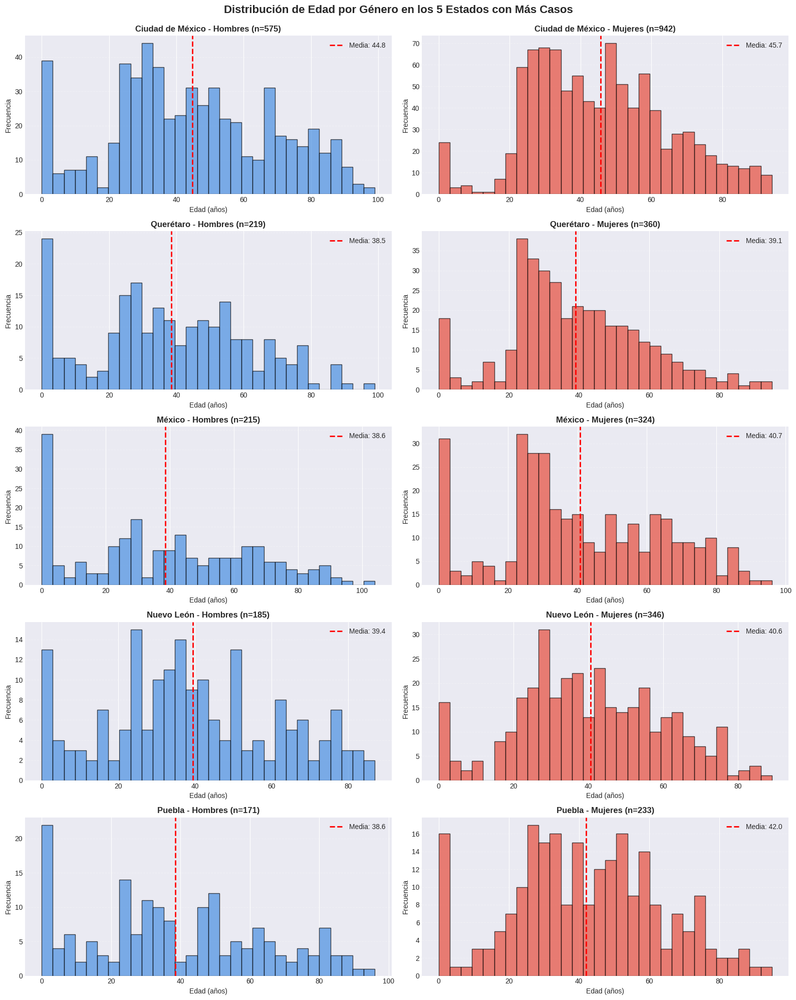

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# PARTE 1: CASOS POR ESTADO SEPARADOS POR GÉNERO (BARRAS APILADAS)
# ============================================================================

# Diccionario de mapeo de claves a nombres de entidades
entidades_dict = {
    1: 'Aguascalientes', 2: 'Baja California', 3: 'Baja California Sur',
    4: 'Campeche', 5: 'Coahuila', 6: 'Colima', 7: 'Chiapas',
    8: 'Chihuahua', 9: 'Ciudad de México', 10: 'Durango',
    11: 'Guanajuato', 12: 'Guerrero', 13: 'Hidalgo', 14: 'Jalisco',
    15: 'México', 16: 'Michoacán', 17: 'Morelos', 18: 'Nayarit',
    19: 'Nuevo León', 20: 'Oaxaca', 21: 'Puebla', 22: 'Querétaro',
    23: 'Quintana Roo', 24: 'San Luis Potosí', 25: 'Sinaloa',
    26: 'Sonora', 27: 'Tabasco', 28: 'Tamaulipas', 29: 'Tlaxcala',
    30: 'Veracruz', 31: 'Yucatán', 32: 'Zacatecas'
}

# Filtrar solo casos positivos de COVID (valores 1, 2, 3)
df_positivos = df_covid[df_covid['CLASIFICACION_FINAL_COVID'].isin([1, 2, 3])].copy()

# Mapear género a etiquetas descriptivas
df_positivos['GENERO'] = df_positivos['SEXO'].map({1: 'Mujer', 2: 'Hombre'})

# Mapear entidades a nombres
df_positivos['ENTIDAD_NOMBRE'] = df_positivos['ENTIDAD_RES'].map(entidades_dict)

# Crear tabla de contingencia: Entidad vs Género
tabla_entidad_genero = pd.crosstab(df_positivos['ENTIDAD_NOMBRE'], df_positivos['GENERO'])

# Calcular el total por entidad y ordenar
tabla_entidad_genero['Total'] = tabla_entidad_genero.sum(axis=1)
tabla_entidad_genero = tabla_entidad_genero.sort_values('Total', ascending=True)
tabla_entidad_genero = tabla_entidad_genero.drop('Total', axis=1)

# Crear gráfica de barras apiladas horizontales
fig, ax = plt.subplots(figsize=(14, 12))

# Colores para cada género
colores_genero = {'Hombre': '#4A90E2', 'Mujer': '#E74C3C'}

# Posiciones de las barras
y_pos = np.arange(len(tabla_entidad_genero))

# Crear barras apiladas
left = np.zeros(len(tabla_entidad_genero))
for genero in ['Hombre', 'Mujer']:
    if genero in tabla_entidad_genero.columns:
        valores = tabla_entidad_genero[genero].values
        barras = ax.barh(y_pos, valores, left=left,
                        label=genero, color=colores_genero[genero],
                        edgecolor='white', linewidth=0.8)

        # Agregar etiquetas en el centro de cada segmento
        for i, (barra, valor) in enumerate(zip(barras, valores)):
            if valor > 0:  # Solo mostrar si hay casos
                ax.text(left[i] + valor/2, barra.get_y() + barra.get_height()/2,
                       f'{int(valor):,}', ha='center', va='center',
                       fontsize=8, fontweight='bold', color='white')

        left += valores

# Agregar total al final de cada barra
totales = tabla_entidad_genero.sum(axis=1).values
for i, total in enumerate(totales):
    ax.text(total + max(totales)*0.01, i,
           f'{int(total):,}', ha='left', va='center',
           fontsize=9, fontweight='bold', color='black')

# Personalización
ax.set_xlabel('Número de Casos Positivos de COVID-19', fontsize=13, fontweight='bold')
ax.set_ylabel('Entidad Federativa', fontsize=13, fontweight='bold')
ax.set_title('Distribución de Casos Positivos de COVID-19 por Estado y Género',
            fontsize=15, fontweight='bold', pad=20)
ax.set_yticks(y_pos)
ax.set_yticklabels(tabla_entidad_genero.index, fontsize=10)
ax.legend(loc='lower right', fontsize=11, frameon=True, shadow=True)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{int(x):,}'))
ax.grid(axis='x', alpha=0.3, linestyle='--')

plt.tight_layout()
save_fig("Casos_por_estado_y_genero", tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

# Estadísticas por estado y género
print("\n" + "="*80)
print("TOP 10 ESTADOS CON MÁS CASOS - DISTRIBUCIÓN POR GÉNERO")
print("="*80)
print(f"{'Estado':<25} {'Hombres':>12} {'Mujeres':>12} {'Total':>12} {'% Hombres':>10}")
print("-"*80)

top_10 = tabla_entidad_genero.iloc[-10:][::-1]  # Top 10 invertido
for estado in top_10.index:
    hombres = int(top_10.loc[estado, 'Hombre']) if 'Hombre' in top_10.columns else 0
    mujeres = int(top_10.loc[estado, 'Mujer']) if 'Mujer' in top_10.columns else 0
    total = hombres + mujeres
    pct_hombres = (hombres/total*100) if total > 0 else 0
    print(f"{estado:<25} {hombres:>12,} {mujeres:>12,} {total:>12,} {pct_hombres:>9.1f}%")
print("="*80)

# ============================================================================
# PARTE 2: FRECUENCIA DE EDAD POR ESTADO Y GÉNERO
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS DE EDAD POR ESTADO Y GÉNERO")
print("="*80)

# Estadísticas descriptivas de edad por estado y género
edad_stats = df_positivos.groupby(['ENTIDAD_NOMBRE', 'GENERO'])['EDAD'].describe()
edad_stats = edad_stats.round(2)

print("\nEstadísticas de Edad por Estado y Género (Top 10 estados):")
print("-"*80)

# Mostrar solo top 10 estados
top_10_estados = tabla_entidad_genero.sum(axis=1).nlargest(10).index

for estado in top_10_estados:
    print(f"\n{estado}:")
    print("-"*60)
    for genero in ['Hombre', 'Mujer']:
        if (estado, genero) in edad_stats.index:
            stats = edad_stats.loc[(estado, genero)]
            print(f"  {genero}:")
            print(f"    Media: {stats['mean']:.1f} años | Mediana: {stats['50%']:.1f} años")
            print(f"    Min: {stats['min']:.0f} | Max: {stats['max']:.0f} | Desv. Est.: {stats['std']:.1f}")
            print(f"    Q1: {stats['25%']:.1f} | Q3: {stats['75%']:.1f} | Casos: {int(stats['count'])}")

print("\n" + "="*80)

# ============================================================================
# PARTE 3: VISUALIZACIÓN DE DISTRIBUCIÓN DE EDAD POR GÉNERO (TOP 5 ESTADOS)
# ============================================================================

top_5_estados = tabla_entidad_genero.sum(axis=1).nlargest(5).index

fig, axes = plt.subplots(5, 2, figsize=(16, 20))
fig.suptitle('Distribución de Edad por Género en los 5 Estados con Más Casos',
            fontsize=16, fontweight='bold', y=0.995)

for idx, estado in enumerate(top_5_estados):
    # Datos para el estado actual
    datos_estado = df_positivos[df_positivos['ENTIDAD_NOMBRE'] == estado]

    # Histograma para Hombres
    datos_hombres = datos_estado[datos_estado['GENERO'] == 'Hombre']['EDAD'].dropna()
    axes[idx, 0].hist(datos_hombres, bins=30, color='#4A90E2', edgecolor='black', alpha=0.7)
    axes[idx, 0].set_title(f'{estado} - Hombres (n={len(datos_hombres):,})',
                          fontsize=12, fontweight='bold')
    axes[idx, 0].set_xlabel('Edad (años)', fontsize=10)
    axes[idx, 0].set_ylabel('Frecuencia', fontsize=10)
    axes[idx, 0].grid(axis='y', alpha=0.3, linestyle='--')
    axes[idx, 0].axvline(datos_hombres.mean(), color='red', linestyle='--',
                        linewidth=2, label=f'Media: {datos_hombres.mean():.1f}')
    axes[idx, 0].legend()

    # Histograma para Mujeres
    datos_mujeres = datos_estado[datos_estado['GENERO'] == 'Mujer']['EDAD'].dropna()
    axes[idx, 1].hist(datos_mujeres, bins=30, color='#E74C3C', edgecolor='black', alpha=0.7)
    axes[idx, 1].set_title(f'{estado} - Mujeres (n={len(datos_mujeres):,})',
                          fontsize=12, fontweight='bold')
    axes[idx, 1].set_xlabel('Edad (años)', fontsize=10)
    axes[idx, 1].set_ylabel('Frecuencia', fontsize=10)
    axes[idx, 1].grid(axis='y', alpha=0.3, linestyle='--')
    axes[idx, 1].axvline(datos_mujeres.mean(), color='red', linestyle='--',
                        linewidth=2, label=f'Media: {datos_mujeres.mean():.1f}')
    axes[idx, 1].legend()

plt.tight_layout()
save_fig("Distribucion_edad_por_estado_genero", tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

### Pruebas de hipotesis

#### Fecha de inicio de sintomas es dependiente del mes

- $H_{0}:$ El mes de inicio de síntomas no está relacionado con la clasificación final del caso.
- $H_{1}:$ El mes de inicio de síntomas sí está relacionado con la clasificación final del caso


TABLA DE CONTINGENCIA: MES DE SÍNTOMAS vs CLASIFICACIÓN COVID-19
ES_POSITIVO   No Positivo  Positivo   Total
MES_SINTOMAS                               
1                   19392       194   19586
2                   18043       360   18403
3                   17463       809   18272
4                   12997      1538   14535
5                    9725      1334   11059
6                    9301      1075   10376
7                    8440       529    8969
8                    7101       416    7517
9                   10079       490   10569
10                  12114       242   12356
11                    275         0     275
Total              124930      6987  131917

RESULTADOS DE LA PRUEBA CHI-CUADRADO DE INDEPENDENCIA
Estadístico Chi² calculado: 3816.3245
Grados de libertad: 10
Valor p: 0.0000000000
Nivel de significancia (α): 0.05

INTERPRETACIÓN DE RESULTADOS
✓ DECISIÓN: Se RECHAZA H₀

  CONCLUSIÓN:
  Existe evidencia estadísticamente significativa (p < 0.05) de que
  el mes

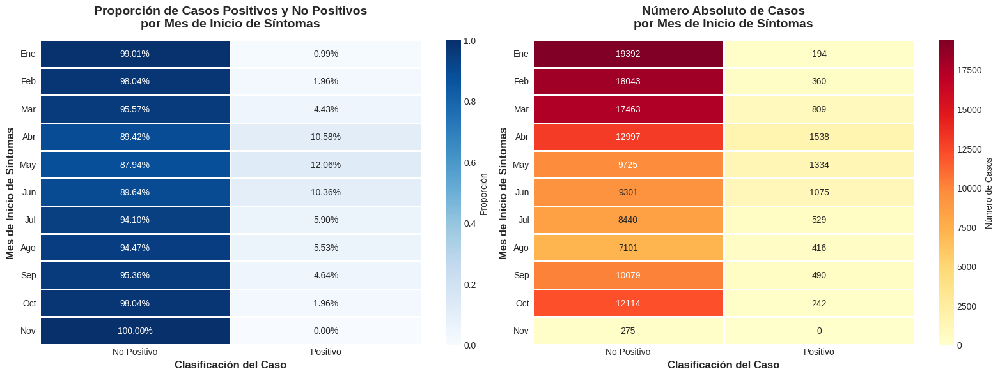

Imagen guardada como Casos_por_mes_barras.png en la carpeta Galeria


<Figure size 1400x700 with 0 Axes>

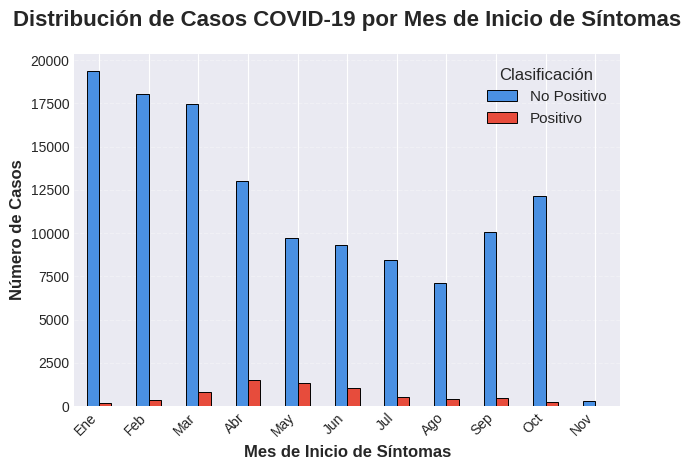


ESTADÍSTICAS DESCRIPTIVAS POR MES
ES_POSITIVO   No Positivo  Positivo  Total  % Positivos
MES_SINTOMAS                                           
1                   19392       194  19586         0.99
2                   18043       360  18403         1.96
3                   17463       809  18272         4.43
4                   12997      1538  14535        10.58
5                    9725      1334  11059        12.06
6                    9301      1075  10376        10.36
7                    8440       529   8969         5.90
8                    7101       416   7517         5.53
9                   10079       490  10569         4.64
10                  12114       242  12356         1.96
11                    275         0    275         0.00


In [ ]:
import scipy.stats as stats

# Extraer el mes de la fecha de síntomas
df_covid['MES_SINTOMAS'] = df_covid['FECHA_SINTOMAS'].dt.month

# Crear variable binaria: positivo (1,2,3) o no positivo (4-7)
df_covid['ES_POSITIVO'] = df_covid['CLASIFICACION_FINAL_COVID'].apply(
    lambda x: 'Positivo' if x in [1, 2, 3] else 'No Positivo'
)

# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(
    df_covid['MES_SINTOMAS'],
    df_covid['ES_POSITIVO'],
    margins=True,  # Agregar totales
    margins_name='Total'
)

print("\n" + "="*70)
print("TABLA DE CONTINGENCIA: MES DE SÍNTOMAS vs CLASIFICACIÓN COVID-19")
print("="*70)
print(tabla_contingencia)
print("="*70)

# Tabla sin márgenes para la prueba estadística
tabla_sin_margenes = pd.crosstab(df_covid['MES_SINTOMAS'], df_covid['ES_POSITIVO'])

# Aplicar prueba Chi-cuadrado
chi2, p_valor, grados_libertad, esperados = stats.chi2_contingency(tabla_sin_margenes)

# Resultados de la prueba
print("\n" + "="*70)
print("RESULTADOS DE LA PRUEBA CHI-CUADRADO DE INDEPENDENCIA")
print("="*70)
print(f"Estadístico Chi² calculado: {chi2:.4f}")
print(f"Grados de libertad: {grados_libertad}")
print(f"Valor p: {p_valor:.10f}")
print(f"Nivel de significancia (α): 0.05")
print("="*70)

# Interpretación estadística
print("\n" + "="*70)
print("INTERPRETACIÓN DE RESULTADOS")
print("="*70)
if p_valor < 0.05:
    print("✓ DECISIÓN: Se RECHAZA H₀")
    print("\n  CONCLUSIÓN:")
    print("  Existe evidencia estadísticamente significativa (p < 0.05) de que")
    print("  el mes de inicio de síntomas ESTÁ RELACIONADO con el resultado")
    print("  positivo a COVID-19.")
    print("\n  IMPLICACIÓN:")
    print("  La proporción de casos positivos varía significativamente según")
    print("  el mes en que inician los síntomas.")
else:
    print("✗ DECISIÓN: NO se rechaza H₀")
    print("\n  CONCLUSIÓN:")
    print("  No existe evidencia estadísticamente significativa (p ≥ 0.05) de")
    print("  relación entre el mes de inicio de síntomas y el resultado COVID-19.")
    print("\n  IMPLICACIÓN:")
    print("  La proporción de casos positivos es similar en todos los meses.")
print("="*70)

# ============================================================================
# VISUALIZACIONES
# ============================================================================

# 1. Mapa de calor con proporciones
tabla_prop = tabla_sin_margenes.div(tabla_sin_margenes.sum(axis=1), axis=0)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico 1: Proporciones
sns.heatmap(tabla_prop, annot=True, cmap="Blues", fmt=".2%",
            linewidths=1, linecolor='white', cbar_kws={'label': 'Proporción'},
            ax=axes[0], vmin=0, vmax=1)
axes[0].set_title('Proporción de Casos Positivos y No Positivos\npor Mes de Inicio de Síntomas',
                  fontsize=14, fontweight='bold', pad=15)
axes[0].set_xlabel('Clasificación del Caso', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Mes de Inicio de Síntomas', fontsize=12, fontweight='bold')

# Etiquetas de meses
meses_nombres = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
                 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']
axes[0].set_yticklabels([meses_nombres[i-1] for i in tabla_prop.index], rotation=0)

# Gráfico 2: Valores absolutos
sns.heatmap(tabla_sin_margenes, annot=True, fmt='d', cmap="YlOrRd",
            linewidths=1, linecolor='white', cbar_kws={'label': 'Número de Casos'},
            ax=axes[1])
axes[1].set_title('Número Absoluto de Casos\npor Mes de Inicio de Síntomas',
                  fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Clasificación del Caso', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Mes de Inicio de Síntomas', fontsize=12, fontweight='bold')
axes[1].set_yticklabels([meses_nombres[i-1] for i in tabla_sin_margenes.index], rotation=0)

plt.tight_layout()
save_fig("Prueba_Chi2_Mes_vs_COVID.png", tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

# 2. Gráfico de barras agrupadas
plt.figure(figsize=(14, 7))
tabla_sin_margenes.plot(kind='bar', color=['#4A90E2', '#E74C3C'],
                        edgecolor='black', linewidth=0.7)
plt.title('Distribución de Casos COVID-19 por Mes de Inicio de Síntomas',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Mes de Inicio de Síntomas', fontsize=12, fontweight='bold')
plt.ylabel('Número de Casos', fontsize=12, fontweight='bold')
plt.xticks(range(len(tabla_sin_margenes.index)),
           [meses_nombres[i-1] for i in tabla_sin_margenes.index],
           rotation=45, ha='right')
plt.legend(title='Clasificación', fontsize=11, title_fontsize=12)
plt.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()
save_fig("Casos_por_mes_barras.png", tight_layout=True, fig_extension="pdf", resolution=300)
plt.show()

# 3. Estadísticas descriptivas por mes
print("\n" + "="*70)
print("ESTADÍSTICAS DESCRIPTIVAS POR MES")
print("="*70)
estadisticas_mes = df_covid.groupby('MES_SINTOMAS')['ES_POSITIVO'].value_counts().unstack(fill_value=0)
estadisticas_mes['Total'] = estadisticas_mes.sum(axis=1)
estadisticas_mes['% Positivos'] = (estadisticas_mes['Positivo'] / estadisticas_mes['Total'] * 100).round(2)
print(estadisticas_mes)
print("="*70)

#### Dependencia de genero con clasificacioon final del caso

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency

# --- 1. Clasificación de positivo/no positivo ---
df_covid['ES_POSITIVO'] = df_covid['CLASIFICACION_FINAL_COVID'].apply(lambda x: 'Positivo' if x in [1, 2, 3] else 'No Positivo')

# --- 2. Reemplazar valores de sexo por etiquetas ---
df_covid['SEXO'] = df_covid['SEXO'].replace({1: 'Hombre', 2: 'Mujer'})

# --- 3. Crear tabla de contingencia ---
tabla_contingencia = pd.crosstab(df_covid['SEXO'], df_covid['ES_POSITIVO'], margins=True)
print("Tabla de contingencia:")
print(tabla_contingencia)

# --- 4. Prueba de independencia Chi-cuadrado ---
tabla_chi = pd.crosstab(df_covid['SEXO'], df_covid['ES_POSITIVO'])
chi2, p, dof, expected = chi2_contingency(tabla_chi)

print("\nResultados de la prueba Chi-cuadrado:")
print(f"Estadístico χ² = {chi2:.4f}")
print(f"Grados de libertad = {dof}")
print(f"Valor p = {p:.6f}")

# --- 5. Mostrar frecuencias esperadas (opcional) ---
expected_df = pd.DataFrame(expected,
                           index=tabla_chi.index,
                           columns=tabla_chi.columns)

print("\nFrecuencias esperadas bajo H₀:")
print(expected_df)

# --- 6. Interpretación automática ---
alpha = 0.05
if p < alpha:
    print("\nConclusión: Se rechaza H₀. Existe dependencia entre el género y el resultado de COVID-19.")
else:
    print("\nConclusión: No se puede rechazar H₀. No hay evidencia de relación entre el género y el resultado de COVID-19.")

Tabla de contingencia:
ES_POSITIVO  No Positivo  Positivo     All
SEXO                                      
Hombre             69257      4197   73454
Mujer              55673      2790   58463
All               124930      6987  131917

Resultados de la prueba Chi-cuadrado:
Estadístico χ² = 57.3444
Grados de libertad = 1
Valor p = 0.000000

Frecuencias esperadas bajo H₀:
ES_POSITIVO   No Positivo     Positivo
SEXO                                  
Hombre       69563.499928  3890.500072
Mujer        55366.500072  3096.499928

Conclusión: Se rechaza H₀. Existe dependencia entre el género y el resultado de COVID-19.


## Selección de Caracteristicas

En este apartado realizaremos:

- Aplicar algún método de filtro a tus datos mediante el uso de SelectKBest
- Aplicar los modelos de selección de características cuidando los supuestos de cada modelo
- Busca una o varias métricas para seleccionar características en literatura relacionada del problema.
- Con base en tu investigación, determina las características más relevantes de tu conjunto de datos.

### Separacion de las columnas.

Nos interesara saber si un paciente da positivo a SARS-CoV-2, por ese motivo, elegimos la variable dependiente



```
y = df_covid_modelos[["CLASIFICACION_FINAL_COVID"]]
```

Mientras que las demas variables del conjunto de datos seran nuestras variables independientes

```
x = df_covid_modelos[[ 'EDAD', 'NEUMONIA',
              'EMBARAZO', 'DIABETES', 'EPOC', 'ASMA',
              'INMUSUPR', 'HIPERTENSION', 'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO']]
```


Encontramos si hay linealidad entre las columnas independientes y dependientes

In [ ]:
df_covid_dropna = df_covid_modelos.dropna()
y = df_covid_dropna[["CLASIFICACION_FINAL_COVID"]]
x = df_covid_dropna[[ 'EDAD', 'NEUMONIA','EMBARAZO', 'DIABETES', 'EPOC', 'ASMA',
                      'INMUSUPR', 'HIPERTENSION', 'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO']]

In [ ]:
valor_f = f_regression(x,y)
valor_f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


(array([11.36212553,  0.38543337,  0.58249895,  0.08707797,  0.30685548,
         0.36601967,  2.40842393,  0.05274211,  0.43423438,  1.38433861,
         0.33801624,  0.05641516]),
 array([7.55352563e-04, 5.34738434e-01, 4.45371121e-01, 7.67937777e-01,
        5.79641440e-01, 5.45209865e-01, 1.20748226e-01, 8.18368249e-01,
        5.09949365e-01, 2.39420506e-01, 5.61003199e-01, 8.12264278e-01]))

In [ ]:
#Se crea un arreglo para identificar cuales variables pasan la prueba de linealidad
pasan_prueba = []
no_pasan_prueba=[]
alpha = 0.05

for i in range (len(valor_f[0])):
  if valor_f[0][i] < alpha:
    pasan_prueba.append(x.columns[i])
  else:
    no_pasan_prueba.append(x.columns[i])

In [ ]:
pasan_prueba

[]

In [ ]:
df_resultados = pd.DataFrame(valor_f[0], index = x.columns, columns= ['valor_f']).sort_values('valor_f', ascending = True)
df_resultados

,valor_f
HIPERTENSION,0.052742
TABAQUISMO,0.056415
DIABETES,0.087078
EPOC,0.306855
RENAL_CRONICA,0.338016
ASMA,0.366020
NEUMONIA,0.385433
CARDIOVASCULAR,0.434234
EMBARAZO,0.582499
OBESIDAD,1.384339


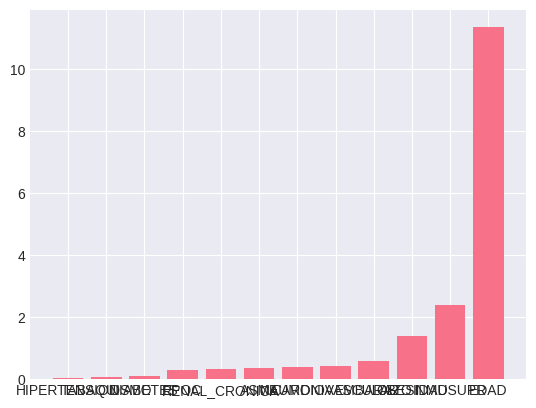

In [ ]:
plt.figure()
plt.bar(df_resultados.index, df_resultados.valor_f)
plt.show()

### Umbral de varianza

Para esto, tenemos que normalizar las variables.

In [ ]:
escalador = MinMaxScaler()
escala = escalador.fit_transform(x)
x_escalada = pd.DataFrame(escala, columns=x.columns)
x_escalada

,EDAD,NEUMONIA,EMBARAZO,DIABETES,EPOC,ASMA,INMUSUPR,HIPERTENSION,CARDIOVASCULAR,OBESIDAD,RENAL_CRONICA,TABAQUISMO
0,0.663551,0.0,0.010309,0.000000,0.010309,0.010309,0.000000,0.010309,0.010309,0.010309,0.010309,0.010309
1,0.457944,0.0,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309
2,0.700935,1.0,0.989691,0.010309,0.000000,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309
3,0.635514,0.0,0.989691,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.000000
4,0.672897,1.0,0.989691,0.000000,0.000000,0.010309,0.010309,0.010309,0.000000,0.010309,0.010309,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4910,0.579439,0.0,0.010309,0.010309,0.010309,0.010309,0.010309,0.000000,0.010309,0.010309,0.000000,0.010309
4911,0.728972,0.0,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309
4912,0.607477,0.0,0.010309,0.010309,0.000000,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.000000
4913,0.616822,0.0,0.989691,0.000000,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309,0.010309


Una vez obtenida las variables normalizadas, obtenemos las varianzas

In [ ]:
selector = VarianceThreshold()
selector.fit_transform(x_escalada)
selector.variances_

array([0.05290138, 0.22662181, 0.23539265, 0.00402195, 0.00339394,
       0.00278577, 0.00160108, 0.00243038, 0.00279877, 0.00200368,
       0.00279997, 0.00418636])

In [ ]:
df_resultados['varianza'] = selector.variances_
df_resultados

,valor_f,varianza
HIPERTENSION,0.052742,0.052901
TABAQUISMO,0.056415,0.226622
DIABETES,0.087078,0.235393
EPOC,0.306855,0.004022
RENAL_CRONICA,0.338016,0.003394
ASMA,0.366020,0.002786
NEUMONIA,0.385433,0.001601
CARDIOVASCULAR,0.434234,0.002430
EMBARAZO,0.582499,0.002799
OBESIDAD,1.384339,0.002004


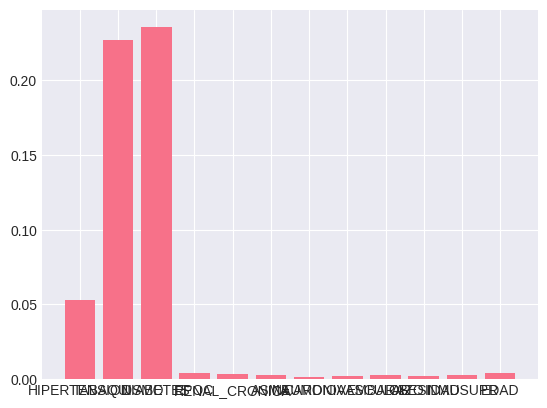

In [ ]:
plt.figure()
plt.bar(df_resultados.index, df_resultados.varianza)
plt.show()

### Información mutua

Nos permite encontrar relacions no lineales entre los datos

In [ ]:
mi = mutual_info_regression(x,y)
mi

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0.        , 0.0035114 , 0.00873234, 0.01665463, 0.00025054,
       0.        , 0.00776001, 0.        , 0.0248789 , 0.        ,
       0.        , 0.00124367])

In [ ]:
df_resultados['mi'] = mi
df_resultados

,valor_f,varianza,mi
HIPERTENSION,0.052742,0.052901,0.000000
TABAQUISMO,0.056415,0.226622,0.003511
DIABETES,0.087078,0.235393,0.008732
EPOC,0.306855,0.004022,0.016655
RENAL_CRONICA,0.338016,0.003394,0.000251
ASMA,0.366020,0.002786,0.000000
NEUMONIA,0.385433,0.001601,0.007760
CARDIOVASCULAR,0.434234,0.002430,0.000000
EMBARAZO,0.582499,0.002799,0.024879
OBESIDAD,1.384339,0.002004,0.000000


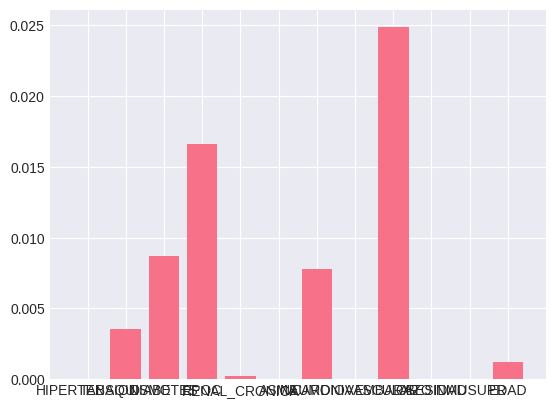

In [ ]:
plt.figure()
plt.bar(df_resultados.index, df_resultados.mi)
plt.show()

Resultados de variables dependientes en manera no lineal

### Reresion lineal

In [ ]:
lr = LinearRegression()
lr

LinearRegression()

In [ ]:
efs = EFS(estimator = lr,   #use linear regression as the classifier/estimator
          min_features = 1, #the minimum number of features to consider is 1
          max_features = 5, # the maximum number of features to consider is 4
          scoring = 'neg_mean_absolute_error', #The metric to use to evluate the classifier is accuracy
          cv = 5)

In [ ]:
efs = efs.fit(x,y)

Features: 1585/1585

In [ ]:
efs.best_score_

np.float64(-0.6789786089750809)

In [ ]:
#la mejor combinacion de la tabla es
efs.best_feature_names_


('EDAD', 'EMBARAZO', 'INMUSUPR', 'TABAQUISMO')

In [ ]:
df_resultados_efs = pd.DataFrame(efs.get_metric_dict()).T
df_resultados_efs = df_resultados_efs.sort_values('avg_score', ascending = False)
df_resultados_efs

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
368,"(0, 2, 6, 11)","[-0.5560734483140302, -0.5593144985017674, -0....",-0.678979,"(EDAD, EMBARAZO, INMUSUPR, TABAQUISMO)",0.143617,0.111739,0.05587
994,"(0, 2, 8, 9, 11)","[-0.5565859427833846, -0.5593528902649558, -0....",-0.679005,"(EDAD, EMBARAZO, CARDIOVASCULAR, OBESIDAD, TAB...",0.142877,0.111163,0.055581
373,"(0, 2, 8, 9)","[-0.5569386734142547, -0.5593871848883691, -0....",-0.679028,"(EDAD, EMBARAZO, CARDIOVASCULAR, OBESIDAD)",0.142814,0.111114,0.055557
358,"(0, 2, 5, 6)","[-0.5563731244328506, -0.5592261594532185, -0....",-0.679032,"(EDAD, EMBARAZO, ASMA, INMUSUPR)",0.143456,0.111614,0.055807
377,"(0, 2, 9, 11)","[-0.5564182975634983, -0.5591801251043905, -0....",-0.679032,"(EDAD, EMBARAZO, OBESIDAD, TABAQUISMO)",0.142984,0.111246,0.055623
...,...,...,...,...,...,...,...
1254,"(1, 3, 7, 8, 10)","[-0.5584164386108229, -0.5680702059614781, -0....",-0.682133,"(NEUMONIA, DIABETES, HIPERTENSION, CARDIOVASCU...",0.141067,0.109755,0.054877
1299,"(1, 5, 6, 7, 9)","[-0.5591452339627442, -0.5673770819464524, -0....",-0.682148,"(NEUMONIA, ASMA, INMUSUPR, HIPERTENSION, OBESI...",0.141329,0.109958,0.054979
1318,"(1, 6, 7, 8, 9)","[-0.5594857355824734, -0.5672341370293333, -0....",-0.682151,"(NEUMONIA, INMUSUPR, HIPERTENSION, CARDIOVASCU...",0.141239,0.109889,0.054945
1279,"(1, 4, 6, 7, 9)","[-0.5591716162170427, -0.5672582191788017, -0....",-0.682184,"(NEUMONIA, EPOC, INMUSUPR, HIPERTENSION, OBESI...",0.141241,0.10989,0.054945


[]

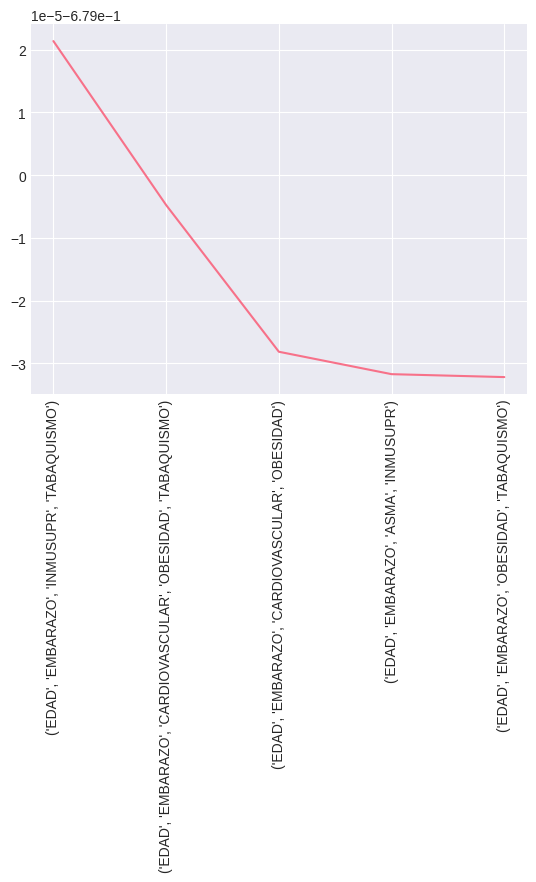

In [ ]:
plt.figure()

plt.plot(
    df_resultados_efs.iloc[:5].feature_names.astype(str),
    df_resultados_efs.iloc[:5].avg_score

)
#plt.gca().invert_yaxis()
plt.xticks(rotation = 90)
plt.plot()

queremos el mas cercano al cero para considerar la mejor

### Sequencial Feature Selector

In [ ]:
sfs = SFS(
    estimator = lr,
    k_features = (1,5),
    forward = True,
    scoring = 'neg_mean_absolute_error',
    cv=5
)

In [ ]:
sfs = sfs.fit(x,y)

In [ ]:
sfs.k_feature_names_

('EDAD', 'EMBARAZO', 'INMUSUPR', 'TABAQUISMO')

In [ ]:
pd.DataFrame(sfs.subsets_).T.sort_values('avg_score', ascending = False)

,feature_idx,cv_scores,avg_score,feature_names
4,"(0, 2, 6, 11)","[-0.5560734483140302, -0.5593144985017674, -0....",-0.678979,"(EDAD, EMBARAZO, INMUSUPR, TABAQUISMO)"
5,"(0, 2, 6, 10, 11)","[-0.556411610844171, -0.5593179473524242, -0.7...",-0.679046,"(EDAD, EMBARAZO, INMUSUPR, RENAL_CRONICA, TABA..."
3,"(0, 2, 6)","[-0.5566364986191434, -0.5591306039258642, -0....",-0.679057,"(EDAD, EMBARAZO, INMUSUPR)"
2,"(0, 2)","[-0.5566357531837994, -0.5599949641821415, -0....",-0.679187,"(EDAD, EMBARAZO)"
1,"(0,)","[-0.5572954648773083, -0.560292506730371, -0.7...",-0.679316,"(EDAD,)"


Las variables que mas contribuyen son la edad y el embarazo

In [ ]:
df_covid_modelos

,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,TIPO_PACIENTE,...,RESULTADO_PCR,RESULTADO_PCR_COINFECCION,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL_COVID,CLASIFICACION_FINAL_FLU,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
0,2025-11-04,167f1a,1,12,1,2,1,1,3,1,...,997,997,2,97,6,6,99,México,97,97
1,2025-11-04,g5963e1,1,12,9,1,9,9,13,1,...,5,5,2,97,7,7,99,México,97,97
2,2025-11-04,gbbb80b,1,4,20,2,20,20,413,1,...,997,997,2,97,6,6,99,México,97,97
3,2025-11-04,ga47252,1,12,9,1,9,9,13,1,...,5,5,2,97,7,7,99,México,97,97
4,2025-11-04,gd8311d,1,8,9,1,9,9,12,1,...,997,997,2,97,6,6,99,México,97,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131912,2025-11-04,g765ea2,1,3,21,1,21,21,73,2,...,999,999,2,97,6,6,99,México,97,2
131913,2025-11-04,g72e830,1,12,29,1,29,29,21,2,...,999,999,2,97,6,6,99,México,97,2
131914,2025-11-04,gd7d663,1,3,21,1,20,21,114,1,...,997,997,2,97,6,6,99,México,97,97
131915,2025-11-04,g68c89b,1,4,31,1,31,31,50,1,...,997,997,2,97,6,6,99,México,97,97


In [ ]:
df_covid_modelos.columns

Index(['FECHA_ACTUALIZACION', 'ID_REGISTRO', 'ORIGEN', 'SECTOR', 'ENTIDAD_UM',
       'SEXO', 'ENTIDAD_NAC', 'ENTIDAD_RES', 'MUNICIPIO_RES', 'TIPO_PACIENTE',
       'FECHA_INGRESO', 'FECHA_SINTOMAS', 'FECHA_DEF', 'INTUBADO', 'NEUMONIA',
       'EDAD', 'NACIONALIDAD', 'EMBARAZO', 'HABLA_LENGUA_INDIG', 'INDIGENA',
       'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION', 'OTRA_COM',
       'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO',
       'OTRO_CASO', 'TOMA_MUESTRA_LAB', 'RESULTADO_PCR',
       'RESULTADO_PCR_COINFECCION', 'TOMA_MUESTRA_ANTIGENO',
       'RESULTADO_ANTIGENO', 'CLASIFICACION_FINAL_COVID',
       'CLASIFICACION_FINAL_FLU', 'MIGRANTE', 'PAIS_NACIONALIDAD',
       'PAIS_ORIGEN', 'UCI'],
      dtype='object')

# PCA (Análisis de Componentes Principales)

## MCA


PREPARACIÓN DE DATOS PARA MCA

✓ Variables incluidas en MCA: 11
    1. DIABETES
    2. EPOC
    3. ASMA
    4. INMUSUPR
    5. HIPERTENSION
    6. OTRA_COM
    7. CARDIOVASCULAR
    8. OBESIDAD
    9. RENAL_CRONICA
   10. TABAQUISMO
   11. NEUMONIA

✓ Tamaño original del dataset 'cor': 79,989 registros
✓ CLASIFICACION_FINAL_COVID ya está codificada como binaria (0-1)

✓ Dataset preparado: 79,989 registros

✓ Distribución de CLASIFICACION_FINAL_COVID (target binario):
CLASIFICACION_FINAL_COVID
0    73064
1     6925
Name: count, dtype: int64
   COVID Positivo (1): 6,925 (8.66%)
   COVID Negativo (0): 73,064 (91.34%)

⚙ Dataset grande. Aplicando muestreo estratificado...
✓ Muestra estratificada: 50,000 registros (62.5%)
✓ Distribución por clase:
CLASIFICACION_FINAL_COVID
0    45671
1     4329
Name: count, dtype: int64

✓ Dataframe MCA creado: 50,000 filas × 11 columnas


/tmp/ipython-input-2453519760.py:66: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_muestra = mca_prep.groupby('CLASIFICACION_FINAL_COVID', group_keys=False).apply(



RECODIFICACIÓN DE VARIABLES PARA MCA

⚙ Recodificando variables categóricas...
--------------------------------------------------------------------------------

   • DIABETES
     Original: {0: np.int64(41825), 1: np.int64(8175)}
     Nueva:    {'No': 41825, 'Sí': 8175}
     Prevalencia: 16.35%

   • EPOC
     Original: {0: np.int64(47640), 1: np.int64(2360)}
     Nueva:    {'No': 47640, 'Sí': 2360}
     Prevalencia: 4.72%

   • ASMA
     Original: {0: np.int64(47469), 1: np.int64(2531)}
     Nueva:    {'No': 47469, 'Sí': 2531}
     Prevalencia: 5.06%

   • INMUSUPR
     Original: {0: np.int64(47588), 1: np.int64(2412)}
     Nueva:    {'No': 47588, 'Sí': 2412}
     Prevalencia: 4.82%

   • HIPERTENSION
     Original: {0: np.int64(40212), 1: np.int64(9788)}
     Nueva:    {'No': 40212, 'Sí': 9788}
     Prevalencia: 19.58%

   • OTRA_COM
     Original: {0: np.int64(46337), 1: np.int64(3663)}
     Nueva:    {'No': 46337, 'Sí': 3663}
     Prevalencia: 7.33%

   • CARDIOVASCULAR
     Origi

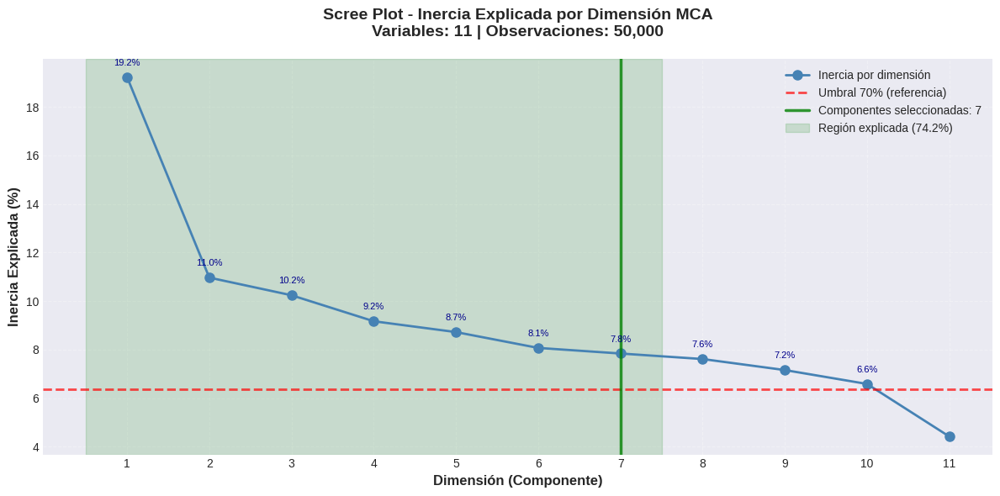

✓ Scree Plot guardado

⚙ Gráfica 2: Varianza Acumulada...
Imagen guardada como varianza_acumulada_mca en la carpeta Galeria


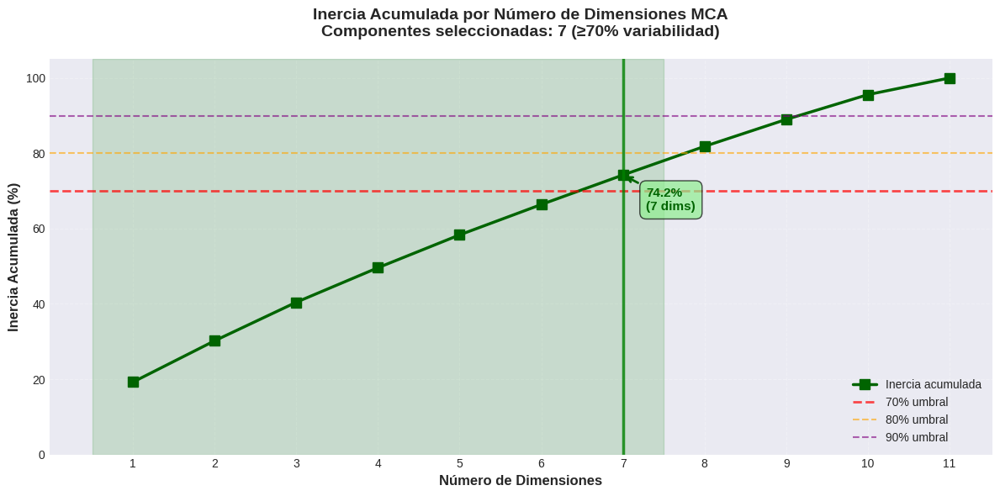

✓ Varianza Acumulada guardada

⚙ Gráfica 3: Grupos de Muestras (Dim1 vs Dim2)...
Imagen guardada como grupos_muestras_mca_dim1_dim2 en la carpeta Galeria


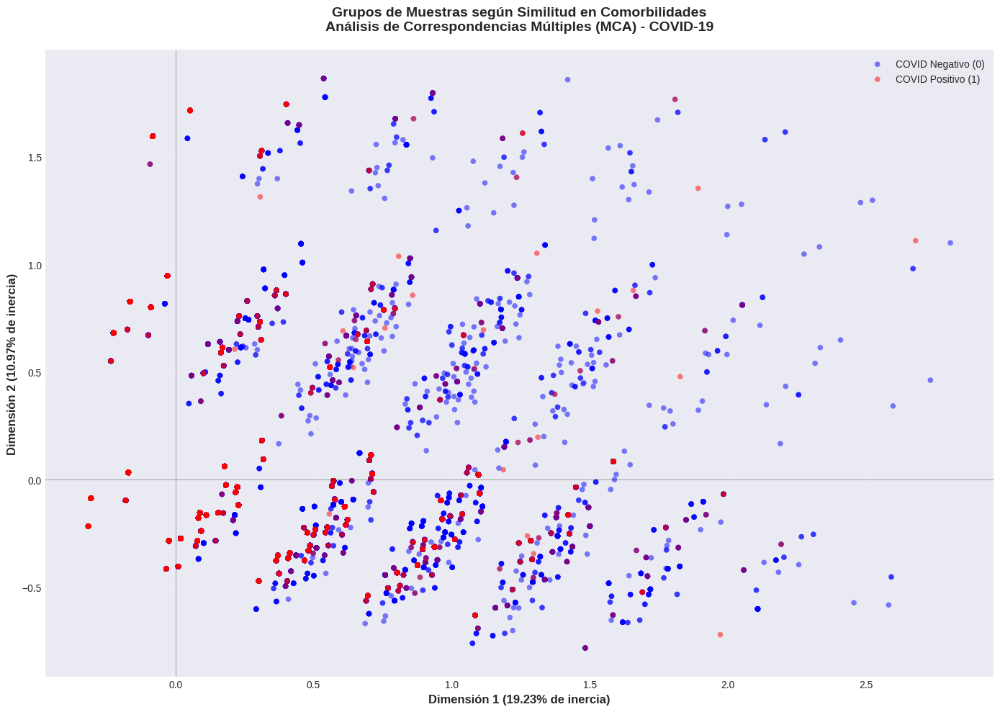

✓ Grupos de Muestras guardado

⚙ Gráfica 4: Biplot (Dim1 vs Dim2)...
✓ Vectores de contribuciones añadidos
Imagen guardada como biplot_mca_dim1_dim2 en la carpeta Galeria


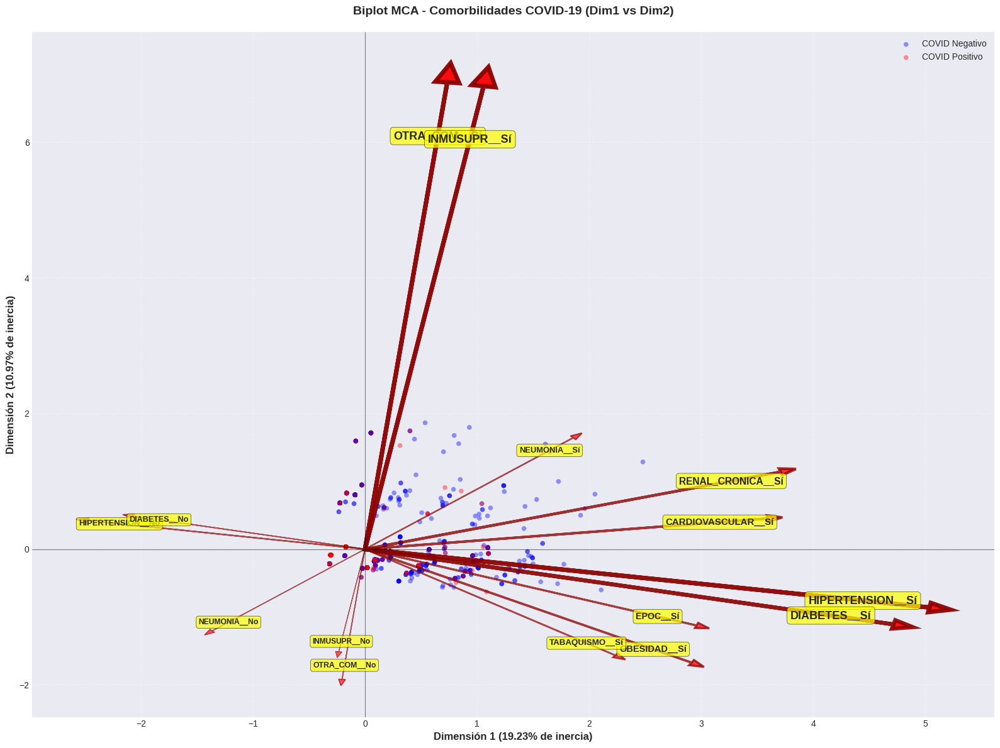

✓ Biplot guardado

ANÁLISIS DE CONTRIBUCIONES DE VARIABLES

📊 TOP 10 MODALIDADES POR DIMENSIÓN (Dim1-Dim7)

✓ Dim1 (19.23% de inercia)
 Rank          Modalidad  Contribución Porcentaje
    1   HIPERTENSION__Sí      0.216920     21.69%
    2       DIABETES__Sí      0.190071     19.01%
    3  RENAL_CRONICA__Sí      0.117469     11.75%
    4 CARDIOVASCULAR__Sí      0.110227     11.02%
    5           EPOC__Sí      0.074982      7.50%
    6       OBESIDAD__Sí      0.072675      7.27%
    7   HIPERTENSION__No      0.052801      5.28%
    8     TABAQUISMO__Sí      0.042923      4.29%
    9       DIABETES__No      0.037151      3.72%
   10       NEUMONIA__Sí      0.029808      2.98%

✓ Dim2 (10.97% de inercia)
 Rank         Modalidad  Contribución Porcentaje
    1      OTRA_COM__Sí      0.407824     40.78%
    2      INMUSUPR__Sí      0.401225     40.12%
    3      OTRA_COM__No      0.032239      3.22%
    4      OBESIDAD__Sí      0.023947      2.39%
    5      NEUMONIA__Sí      0.023278     

In [ ]:
# ============================================================================
# ANÁLISIS DE CORRESPONDENCIAS MÚLTIPLES (MCA) - VARIABLES CATEGÓRICAS
# Análisis de Comorbilidades COVID-19
# CORREGIDO PARA CLASIFICACION_FINAL_COVID BINARIA (0-1)
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import prince
from sklearn.preprocessing import LabelEncoder
import gc

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("\n" + "="*80)
print("PREPARACIÓN DE DATOS PARA MCA")
print("="*80)

# ============================================================================
# 1. CREACIÓN DE DATAFRAME MCA INDEPENDIENTE
# ============================================================================

# Variables categóricas a analizar (comorbilidades)
columnas_mca = [
    'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION',
    'OTRA_COM', 'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA',
    'TABAQUISMO', 'NEUMONIA'
]

print(f"\n✓ Variables incluidas en MCA: {len(columnas_mca)}")
for i, col in enumerate(columnas_mca, 1):
    print(f"   {i:2d}. {col}")

# USAR 'cor' que ya tiene CLASIFICACION_FINAL_COVID como binaria (0-1)
print(f"\n✓ Tamaño original del dataset 'cor': {len(cor):,} registros")
print(f"✓ CLASIFICACION_FINAL_COVID ya está codificada como binaria (0-1)")

# ============================================================================
# 2. FILTRADO Y PREPARACIÓN DE DATOS
# ============================================================================

# Crear copia del dataframe 'cor' con las variables necesarias
mca_prep = cor[columnas_mca + ['CLASIFICACION_FINAL_COVID']].copy()

print(f"\n✓ Dataset preparado: {mca_prep.shape[0]:,} registros")

# Verificar distribución de CLASIFICACION_FINAL_COVID
print("\n✓ Distribución de CLASIFICACION_FINAL_COVID (target binario):")
print(mca_prep['CLASIFICACION_FINAL_COVID'].value_counts().sort_index())
print(f"   COVID Positivo (1): {(mca_prep['CLASIFICACION_FINAL_COVID']==1).sum():,} ({(mca_prep['CLASIFICACION_FINAL_COVID']==1).mean()*100:.2f}%)")
print(f"   COVID Negativo (0): {(mca_prep['CLASIFICACION_FINAL_COVID']==0).sum():,} ({(mca_prep['CLASIFICACION_FINAL_COVID']==0).mean()*100:.2f}%)")

# ============================================================================
# 3. MUESTREO ESTRATIFICADO (SI ES NECESARIO)
# ============================================================================

if len(mca_prep) > 50000:
    print("\n⚙ Dataset grande. Aplicando muestreo estratificado...")
    fraccion_muestra = min(50000 / len(mca_prep), 1.0)

    # Muestreo estratificado por clasificación COVID
    df_muestra = mca_prep.groupby('CLASIFICACION_FINAL_COVID', group_keys=False).apply(
        lambda x: x.sample(frac=fraccion_muestra, random_state=42)
    ).reset_index(drop=True)

    print(f"✓ Muestra estratificada: {len(df_muestra):,} registros ({fraccion_muestra*100:.1f}%)")
    print(f"✓ Distribución por clase:")
    print(df_muestra['CLASIFICACION_FINAL_COVID'].value_counts().sort_index())
else:
    df_muestra = mca_prep.copy()
    print("\n✓ Usando dataset completo (sin muestreo)")

# Separar target para después
target = df_muestra['CLASIFICACION_FINAL_COVID'].copy()
mca = df_muestra[columnas_mca].copy()

print(f"\n✓ Dataframe MCA creado: {mca.shape[0]:,} filas × {mca.shape[1]} columnas")

del mca_prep, df_muestra
gc.collect()

# ============================================================================
# 4. RECODIFICACIÓN DE VARIABLES (MANTENER CATEGORÍAS PARA MCA)
# ============================================================================

print("\n" + "="*80)
print("RECODIFICACIÓN DE VARIABLES PARA MCA")
print("="*80)

def recodificar_variable(valor):
    """
    Recodifica valores numéricos a categorías descriptivas
    0 → 'No'  (No presenta la condición)
    1 → 'Sí'  (Presenta la condición)
    """
    if valor == 1:
        return 'Sí'
    elif valor == 0:
        return 'No'
    else:
        return 'Otro'

print("\n⚙ Recodificando variables categóricas...")
print("-" * 80)

for var in columnas_mca:
    if var in mca.columns:
        # Distribución original
        dist_orig = mca[var].value_counts().sort_index()
        print(f"\n   • {var}")
        print(f"     Original: {dict(dist_orig)}")

        # Aplicar recodificación
        mca[var] = mca[var].apply(recodificar_variable)

        # Distribución nueva
        dist_nueva = mca[var].value_counts()
        print(f"     Nueva:    {dist_nueva.to_dict()}")

        # Calcular prevalencia (% de 'Sí')
        if 'Sí' in dist_nueva.index:
            prevalencia = (dist_nueva['Sí'] / dist_nueva.sum()) * 100
            print(f"     Prevalencia: {prevalencia:.2f}%")

print("\n✓ Recodificación completada exitosamente")

# ============================================================================
# 5. VALIDACIÓN DE DATOS
# ============================================================================

print("\n" + "="*80)
print("VALIDACIÓN DE DATOS")
print("="*80)

# Verificar valores nulos
valores_nulos = mca.isnull().sum()
total_nulos = valores_nulos.sum()

if total_nulos > 0:
    print(f"\n⚠ Valores nulos detectados: {total_nulos}")
    print("-" * 40)
    print(valores_nulos[valores_nulos > 0])
    print("\n⚙ Eliminando filas con valores nulos...")

    # Eliminar filas con nulos
    indices_validos = ~mca.isnull().any(axis=1)
    mca = mca[indices_validos].copy()
    target = target[indices_validos].copy()

    print(f"✓ Datos después de limpieza: {len(mca):,} registros")
else:
    print("✓ No hay valores nulos en el dataset")

# Verificar categorías únicas por variable
print("\n✓ Categorías únicas por variable:")
for col in columnas_mca:
    categorias = mca[col].unique()
    n_categorias = len(categorias)
    print(f"   • {col}: {categorias} ({n_categorias} categorías)")

# VERIFICACIÓN CRÍTICA: Asegurar que hay al menos 2 categorías por variable
print("\n" + "="*80)
print("VERIFICACIÓN DE VARIABILIDAD")
print("="*80)

variables_problematicas = []
for col in columnas_mca:
    n_categorias = mca[col].nunique()
    if n_categorias < 2:
        variables_problematicas.append((col, n_categorias))
        print(f"⚠ {col}: Solo tiene {n_categorias} categoría(s) única(s)")

if len(variables_problematicas) > 0:
    print(f"\n❌ ERROR: {len(variables_problematicas)} variable(s) sin variabilidad suficiente")
    print("   Esto impide el análisis MCA.")
    print("   Variables problemáticas:", [v[0] for v in variables_problematicas])
    raise ValueError("Datos insuficientes para MCA. Necesitas al menos 2 categorías por variable.")
else:
    print("✓ Todas las variables tienen al menos 2 categorías")

print(f"\n✓ Dataset validado: {mca.shape[0]:,} observaciones completas")

# ============================================================================
# 6. APLICACIÓN DE MCA
# ============================================================================

print("\n" + "="*80)
print("APLICANDO ANÁLISIS DE CORRESPONDENCIAS MÚLTIPLES (MCA)")
print("="*80)

X_mca = mca.copy()

# Número de componentes
# Para k variables binarias: dimensiones máximas = k (cada variable aporta 1 dimensión)
n_componentes = min(len(columnas_mca), sum([X_mca[col].nunique() - 1 for col in columnas_mca]))

# Asegurar que n_componentes sea al menos 1
if n_componentes < 1:
    print("❌ ERROR: No hay suficiente variabilidad para crear componentes")
    raise ValueError("n_componentes = 0. Verifica tus datos.")

print(f"\n⚙ Configuración MCA:")
print(f"   • Número de componentes: {n_componentes}")
print(f"   • Número de variables: {len(columnas_mca)}")
print(f"   • Tamaño de muestra: {X_mca.shape[0]:,}")
print(f"   • Motor: sklearn")
print(f"   • Semilla aleatoria: 42")

# Crear y ajustar modelo MCA
mca_model = prince.MCA(
    n_components=n_componentes,
    n_iter=10,
    copy=True,
    random_state=42,
    engine='sklearn'
)

print("\n⚙ Ajustando modelo MCA...")
mca_model.fit(X_mca)
print("✓ Modelo MCA ajustado exitosamente")

# Transformar datos
print("⚙ Transformando datos...")
coordenadas = mca_model.transform(X_mca)

# Crear dataframe con coordenadas
coordenadas_df = pd.DataFrame(
    coordenadas.values,
    columns=[f'Dim{i+1}' for i in range(coordenadas.shape[1])]
)
coordenadas_df['CLASIFICACION_FINAL_COVID'] = target.values

print(f"✓ Transformación completada: {coordenadas_df.shape[1]-1} dimensiones")

# ============================================================================
# 7. ANÁLISIS DE VARIANZA EXPLICADA (INERCIA)
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS DE INERCIA EXPLICADA")
print("="*80)

eigenvalues = mca_model.eigenvalues_
varianza_explicada = (eigenvalues / eigenvalues.sum()) * 100
varianza_acumulada = np.cumsum(varianza_explicada)

print("\n" + "-"*80)
print(f"{'Dim':<6} {'Eigenvalue':<12} {'Inercia %':<12} {'Acumulada %':<12} {'Barra'}")
print("-"*80)

for i in range(min(10, len(eigenvalues))):
    barra = '█' * int(varianza_explicada[i] / 2)
    print(f"{i+1:<6} {eigenvalues[i]:>10.4f}  {varianza_explicada[i]:>10.2f}  {varianza_acumulada[i]:>10.2f}  {barra}")

# Determinar componentes necesarias
n_comp_70 = np.argmax(varianza_acumulada >= 70) + 1 if any(varianza_acumulada >= 70) else len(varianza_acumulada)
n_comp_80 = np.argmax(varianza_acumulada >= 80) + 1 if any(varianza_acumulada >= 80) else len(varianza_acumulada)
n_comp_90 = np.argmax(varianza_acumulada >= 90) + 1 if any(varianza_acumulada >= 90) else len(varianza_acumulada)

print("\n" + "="*80)
print("RESUMEN DE COMPONENTES NECESARIAS")
print("="*80)
print(f"✓ Componentes para ≥70% inercia: {n_comp_70} ({varianza_acumulada[n_comp_70-1]:.2f}%)")
print(f"✓ Componentes para ≥80% inercia: {n_comp_80} ({varianza_acumulada[n_comp_80-1]:.2f}%)")
print(f"✓ Componentes para ≥90% inercia: {n_comp_90} ({varianza_acumulada[n_comp_90-1]:.2f}%)")

# Seleccionar componentes
n_componentes_seleccionadas = n_comp_70
componentes_seleccionadas = [f'Dim{i+1}' for i in range(n_componentes_seleccionadas)]

print(f"\n✓ Componentes seleccionadas (≥70%): {componentes_seleccionadas}")

# ============================================================================
# 8. VISUALIZACIÓN 1: SCREE PLOT
# ============================================================================

print("\n" + "="*80)
print("GENERANDO VISUALIZACIONES")
print("="*80)

print("\n⚙ Gráfica 1: Scree Plot (Varianza Explicada)...")

fig, ax = plt.subplots(figsize=(12, 6))

n_vis = min(15, len(eigenvalues))
dims = np.arange(1, n_vis + 1)

ax.plot(dims, varianza_explicada[:n_vis], 'o-', linewidth=2, markersize=8,
        color='steelblue', label='Inercia por dimensión')

ax.axhline(y=70/n_vis, color='red', linestyle='--', linewidth=2,
           label='Umbral 70% (referencia)', alpha=0.7)

ax.axvline(x=n_componentes_seleccionadas, color='green', linestyle='-',
           linewidth=2.5, label=f'Componentes seleccionadas: {n_componentes_seleccionadas}',
           alpha=0.8)

ax.axvspan(0.5, n_componentes_seleccionadas + 0.5, alpha=0.15, color='green',
           label=f'Región explicada ({varianza_acumulada[n_componentes_seleccionadas-1]:.1f}%)')

ax.set_xlabel('Dimensión (Componente)', fontsize=12, fontweight='bold')
ax.set_ylabel('Inercia Explicada (%)', fontsize=12, fontweight='bold')
ax.set_title('Scree Plot - Inercia Explicada por Dimensión MCA\n' +
             f'Variables: {len(columnas_mca)} | Observaciones: {X_mca.shape[0]:,}',
             fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='upper right', fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_xticks(dims)

for i in range(min(10, n_vis)):
    ax.annotate(f'{varianza_explicada[i]:.1f}%',
                xy=(dims[i], varianza_explicada[i]),
                xytext=(0, 10), textcoords='offset points',
                ha='center', fontsize=8, color='darkblue')

plt.tight_layout()
save_fig("scree_plot_mca_varianza", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Scree Plot guardado")

# ============================================================================
# 9. VISUALIZACIÓN 2: VARIANZA ACUMULADA
# ============================================================================

print("\n⚙ Gráfica 2: Varianza Acumulada...")

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(dims, varianza_acumulada[:n_vis], 's-', linewidth=2.5, markersize=8,
        color='darkgreen', label='Inercia acumulada')

ax.axhline(y=70, color='red', linestyle='--', linewidth=2, label='70% umbral', alpha=0.7)
ax.axhline(y=80, color='orange', linestyle='--', linewidth=1.5, label='80% umbral', alpha=0.6)
ax.axhline(y=90, color='purple', linestyle='--', linewidth=1.5, label='90% umbral', alpha=0.6)

ax.axvline(x=n_componentes_seleccionadas, color='green', linestyle='-',
           linewidth=2.5, alpha=0.8)

ax.axvspan(0.5, n_componentes_seleccionadas + 0.5, alpha=0.15, color='green')

ax.set_xlabel('Número de Dimensiones', fontsize=12, fontweight='bold')
ax.set_ylabel('Inercia Acumulada (%)', fontsize=12, fontweight='bold')
ax.set_title('Inercia Acumulada por Número de Dimensiones MCA\n' +
             f'Componentes seleccionadas: {n_componentes_seleccionadas} (≥70% variabilidad)',
             fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='lower right', fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_xticks(dims)
ax.set_ylim([0, 105])

ax.annotate(f'{varianza_acumulada[n_componentes_seleccionadas-1]:.1f}%\n({n_componentes_seleccionadas} dims)',
            xy=(n_componentes_seleccionadas, varianza_acumulada[n_componentes_seleccionadas-1]),
            xytext=(20, -30), textcoords='offset points',
            fontsize=11, fontweight='bold', color='darkgreen',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgreen', alpha=0.7),
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0',
                          color='darkgreen', lw=2))

plt.tight_layout()
save_fig("varianza_acumulada_mca", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Varianza Acumulada guardada")

# ============================================================================
# 10. VISUALIZACIÓN 3: GRUPOS DE MUESTRAS
# ============================================================================

print("\n⚙ Gráfica 3: Grupos de Muestras (Dim1 vs Dim2)...")

fig, ax = plt.subplots(figsize=(14, 10))

# Colores por COVID
covid_negativo = coordenadas_df['CLASIFICACION_FINAL_COVID'] == 0
covid_positivo = coordenadas_df['CLASIFICACION_FINAL_COVID'] == 1

ax.scatter(coordenadas_df.loc[covid_negativo, 'Dim1'],
          coordenadas_df.loc[covid_negativo, 'Dim2'],
          c='blue', label='COVID Negativo (0)', alpha=0.5, s=30, edgecolors='none')

ax.scatter(coordenadas_df.loc[covid_positivo, 'Dim1'],
          coordenadas_df.loc[covid_positivo, 'Dim2'],
          c='red', label='COVID Positivo (1)', alpha=0.5, s=30, edgecolors='none')

ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.3)
ax.axvline(x=0, color='black', linestyle='-', linewidth=0.8, alpha=0.3)

ax.set_xlabel(f'Dimensión 1 ({varianza_explicada[0]:.2f}% de inercia)',
              fontsize=12, fontweight='bold')
ax.set_ylabel(f'Dimensión 2 ({varianza_explicada[1]:.2f}% de inercia)',
              fontsize=12, fontweight='bold')
ax.set_title('Grupos de Muestras según Similitud en Comorbilidades\n' +
             'Análisis de Correspondencias Múltiples (MCA) - COVID-19',
             fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='best', fontsize=10, framealpha=0.9)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
save_fig("grupos_muestras_mca_dim1_dim2", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Grupos de Muestras guardado")

# ============================================================================
# 11. VISUALIZACIÓN 4: BIPLOT
# ============================================================================

print("\n⚙ Gráfica 4: Biplot (Dim1 vs Dim2)...")

fig, ax = plt.subplots(figsize=(16, 12))

# Muestra de observaciones
n_muestra_plot = min(2000, len(coordenadas_df))
indices_muestra = np.random.choice(len(coordenadas_df), n_muestra_plot, replace=False)

for clase, color, label in [(0, 'blue', 'COVID Negativo'), (1, 'red', 'COVID Positivo')]:
    mask = coordenadas_df.iloc[indices_muestra]['CLASIFICACION_FINAL_COVID'] == clase
    idx_clase = coordenadas_df.iloc[indices_muestra][mask].index

    ax.scatter(coordenadas_df.loc[idx_clase, 'Dim1'],
              coordenadas_df.loc[idx_clase, 'Dim2'],
              c=color, label=label, alpha=0.4, s=30, edgecolors='none')

# Vectores de variables
try:
    column_contrib = mca_model.column_contributions_
    column_coords = mca_model.column_coordinates(X_mca)

    contrib_cols = column_contrib.columns.tolist()
    coord_cols = column_coords.columns.tolist()

    dim1_contrib_col = contrib_cols[0]
    dim2_contrib_col = contrib_cols[1]
    dim1_coord_col = coord_cols[0]
    dim2_coord_col = coord_cols[1]

    plot_data = pd.DataFrame({
        'modalidad': column_coords.index,
        'contrib_dim1': column_contrib[dim1_contrib_col],
        'contrib_dim2': column_contrib[dim2_contrib_col],
        'coord_x_sign': np.sign(column_coords[dim1_coord_col]),
        'coord_y_sign': np.sign(column_coords[dim2_coord_col])
    })

    plot_data['contrib_total'] = plot_data['contrib_dim1'] + plot_data['contrib_dim2']
    plot_data_top = plot_data.nlargest(15, 'contrib_total')

    max_data_range = coordenadas_df[['Dim1', 'Dim2']].abs().max().max()
    scale_factor = max_data_range * 4

    plot_data_top['arrow_x'] = np.sqrt(plot_data_top['contrib_dim1']) * plot_data_top['coord_x_sign'] * scale_factor
    plot_data_top['arrow_y'] = np.sqrt(plot_data_top['contrib_dim2']) * plot_data_top['coord_y_sign'] * scale_factor

    for idx, row in plot_data_top.iterrows():
        arrow_x = row['arrow_x']
        arrow_y = row['arrow_y']

        linewidth = 0.5 + (row['contrib_total'] * 20)
        linewidth = min(linewidth, 5)

        alpha = 0.6 + (row['contrib_total'] * 1.5)
        alpha = min(alpha, 0.95)

        head_width = 0.05 + (row['contrib_total'] * 0.4)
        head_length = 0.08 + (row['contrib_total'] * 0.5)

        ax.arrow(0, 0, arrow_x, arrow_y,
                head_width=head_width, head_length=head_length,
                fc='red', ec='darkred',
                alpha=alpha, linewidth=linewidth,
                length_includes_head=True)

        fontsize = 8 + (row['contrib_total'] * 25)
        fontsize = min(fontsize, 13)

        ax.text(arrow_x * 0.85, arrow_y * 0.85, idx,
               fontsize=fontsize, fontweight='bold',
               ha='center', va='center',
               bbox=dict(boxstyle='round,pad=0.3',
                        facecolor='yellow', alpha=0.7,
                        edgecolor='black', linewidth=0.5))

    print("✓ Vectores de contribuciones añadidos")
except Exception as e:
    print(f"⚠ No se pudieron añadir vectores: {e}")

ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5)
ax.axvline(x=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5)

ax.set_xlabel(f'Dimensión 1 ({varianza_explicada[0]:.2f}% de inercia)',
              fontsize=12, fontweight='bold')
ax.set_ylabel(f'Dimensión 2 ({varianza_explicada[1]:.2f}% de inercia)',
              fontsize=12, fontweight='bold')
ax.set_title('Biplot MCA - Comorbilidades COVID-19 (Dim1 vs Dim2)',
             fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='upper right', fontsize=10, framealpha=0.9)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
save_fig("biplot_mca_dim1_dim2", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Biplot guardado")

# ============================================================================
# 12. ANÁLISIS DE CONTRIBUCIONES
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS DE CONTRIBUCIONES DE VARIABLES")
print("="*80)

try:
    column_contrib = mca_model.column_contributions_
    contrib_cols = column_contrib.columns.tolist()

    n_dims_analizar = min(7, len(contrib_cols))

    # CAMBIO AQUÍ: Ahora incluye TODAS las dimensiones desde Dim1
    print(f"\n📊 TOP 10 MODALIDADES POR DIMENSIÓN (Dim1-Dim{n_dims_analizar})")
    print("="*80)

    contribuciones_por_dim = {}

    # CAMBIO: range(0, n_dims_analizar) en lugar de range(2, n_dims_analizar)
    for i in range(0, n_dims_analizar):
        dim_name = f"Dim{i+1}"
        dim_col = contrib_cols[i]

        top_10 = column_contrib[dim_col].nlargest(10)
        contribuciones_por_dim[dim_name] = top_10

        print(f"\n{'='*80}")
        print(f"✓ {dim_name} ({varianza_explicada[i]:.2f}% de inercia)")
        print(f"{'='*80}")

        tabla = pd.DataFrame({
            'Rank': range(1, 11),
            'Modalidad': top_10.index,
            'Contribución': top_10.values,
            'Porcentaje': [f"{val*100:.2f}%" for val in top_10.values]
        })

        print(tabla.to_string(index=False))
except Exception as e:
    print(f"\n⚠ Error al calcular contribuciones: {e}")

# ============================================================================
# 13. GUARDAR RESULTADOS
# ============================================================================

print("\n" + "="*80)
print("GUARDANDO RESULTADOS")
print("="*80)

coordenadas_mca_full = coordenadas_df.copy()
coordenadas_mca_seleccionadas = coordenadas_df[componentes_seleccionadas + ['CLASIFICACION_FINAL_COVID']].copy()

resumen_mca = pd.DataFrame({
    'Dimensión': [f'Dim{i+1}' for i in range(len(eigenvalues))],
    'Eigenvalue': eigenvalues,
    'Inercia (%)': varianza_explicada,
    'Inercia Acumulada (%)': varianza_acumulada
})

print(f"\n✓ Coordenadas MCA: {coordenadas_mca_full.shape}")
print(f"✓ Coordenadas seleccionadas (≥70%): {coordenadas_mca_seleccionadas.shape}")
print(f"\n✓ Resumen MCA:")
print(resumen_mca.head(10))

# ============================================================================
# RESUMEN FINAL
# ============================================================================

In [ ]:
# ============================================================================
# VISUALIZACIÓN 3D MEJORADA: INTERACTIVA CON FLECHAS A ESCALA
# Con controles para rotar y zoom + flechas proporcionales
# ============================================================================

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
from concurrent.futures import ThreadPoolExecutor
import gc

# Importar para interactividad en Colab
try:
    from google.colab import output
    output.enable_custom_widget_manager()
    print("✓ Widgets habilitados para Colab")
except:
    pass

# Habilitar modo interactivo
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

print("\n" + "="*80)
print("GENERANDO VISUALIZACIONES 3D INTERACTIVAS (OPTIMIZADO)")
print("="*80)

# ============================================================================
# MUESTREO ESTRATIFICADO ÚNICO (50,000 observaciones)
# ============================================================================

print("\n⚙ Preparando muestreo estratificado para gráficas 3D...")

if len(coordenadas_df) > 50000:
    print("   Dataset grande. Aplicando muestreo estratificado...")
    fraccion_muestra_3d = 50000 / len(coordenadas_df)

    df_muestra_3d = coordenadas_df.groupby('CLASIFICACION_FINAL_COVID', group_keys=False).apply(
        lambda x: x.sample(frac=fraccion_muestra_3d, random_state=42)
    ).reset_index(drop=True)

    print(f"✓ Muestra estratificada: {len(df_muestra_3d):,} registros ({fraccion_muestra_3d*100:.1f}%)")
else:
    df_muestra_3d = coordenadas_df.copy()
    print(f"✓ Usando dataset completo: {len(df_muestra_3d):,} registros")

# Verificar distribución
print(f"✓ Distribución de la muestra:")
dist_muestra = df_muestra_3d['CLASIFICACION_FINAL_COVID'].value_counts().sort_index()
for clase, count in dist_muestra.items():
    print(f"   Clase {clase}: {count:,} ({count/len(df_muestra_3d)*100:.2f}%)")

# Calcular varianza total 3D
varianza_total_3d = varianza_explicada[:3].sum()

# ============================================================================
# FUNCIÓN PARALELA: PREPARAR DATOS DE VECTORES ESCALADOS
# ============================================================================

def preparar_vectores_3d_escalados():
    """Prepara vectores de variables con escala proporcional"""
    try:
        column_contrib = mca_model.column_contributions_
        column_coords = mca_model.column_coordinates(X_mca)

        contrib_cols = column_contrib.columns.tolist()
        coord_cols = column_coords.columns.tolist()

        plot_data_3d = pd.DataFrame({
            'modalidad': column_coords.index,
            'contrib_dim1': column_contrib[contrib_cols[0]],
            'contrib_dim2': column_contrib[contrib_cols[1]],
            'contrib_dim3': column_contrib[contrib_cols[2]],
            'coord_x': column_coords[coord_cols[0]],
            'coord_y': column_coords[coord_cols[1]],
            'coord_z': column_coords[coord_cols[2]]
        })

        plot_data_3d['contrib_total'] = (
            plot_data_3d['contrib_dim1'] +
            plot_data_3d['contrib_dim2'] +
            plot_data_3d['contrib_dim3']
        )

        # Top 12 modalidades
        plot_data_top = plot_data_3d.nlargest(12, 'contrib_total')

        # NUEVA ESCALA: Usar coordenadas directas (más proporcional)
        # Factor de escala basado en el rango de datos
        max_data_range = df_muestra_3d[['Dim1', 'Dim2', 'Dim3']].abs().quantile(0.95).max()

        # Escala ajustada: vectores serán proporcionales a su contribución
        # pero no excederán el 60% del rango de datos
        scale_factor = max_data_range * 0.6

        vectores = []
        for idx, row in plot_data_top.iterrows():
            # Usar coordenadas directas multiplicadas por contribución
            contrib_weight = np.sqrt(row['contrib_total'])  # Raíz para suavizar

            arrow_x = row['coord_x'] * contrib_weight * scale_factor
            arrow_y = row['coord_y'] * contrib_weight * scale_factor
            arrow_z = row['coord_z'] * contrib_weight * scale_factor

            # Tamaño de fuente proporcional a contribución
            fontsize = 8 + (row['contrib_total'] * 20)
            fontsize = min(fontsize, 12)

            vectores.append({
                'nombre': idx,
                'x': arrow_x,
                'y': arrow_y,
                'z': arrow_z,
                'fontsize': fontsize,
                'contrib': row['contrib_total'],
                'magnitud': np.sqrt(arrow_x**2 + arrow_y**2 + arrow_z**2)
            })

        return vectores
    except Exception as e:
        print(f"⚠ Error preparando vectores: {e}")
        return None

# ============================================================================
# VISUALIZACIÓN 1: GRUPOS DE MUESTRAS 3D - MATPLOTLIB (CON INTERACTIVIDAD)
# ============================================================================

print("\n⚙ Gráfica 1 (Matplotlib): Grupos de Muestras 3D con interactividad...")

# Habilitar modo interactivo para matplotlib
%matplotlib notebook

fig1 = plt.figure(figsize=(14, 10))
ax1 = fig1.add_subplot(111, projection='3d')

# Separar datos por clase
covid_negativo = df_muestra_3d[df_muestra_3d['CLASIFICACION_FINAL_COVID'] == 0]
covid_positivo = df_muestra_3d[df_muestra_3d['CLASIFICACION_FINAL_COVID'] == 1]

# Graficar puntos
scatter_neg = ax1.scatter(
    covid_negativo['Dim1'],
    covid_negativo['Dim2'],
    covid_negativo['Dim3'],
    c='blue',
    label=f'COVID Negativo (n={len(covid_negativo):,})',
    alpha=0.5,
    s=18,
    edgecolors='none',
    depthshade=True
)

scatter_pos = ax1.scatter(
    covid_positivo['Dim1'],
    covid_positivo['Dim2'],
    covid_positivo['Dim3'],
    c='red',
    label=f'COVID Positivo (n={len(covid_positivo):,})',
    alpha=0.5,
    s=18,
    edgecolors='none',
    depthshade=True
)

# Líneas de referencia
ax1.plot([0, 0], [0, 0], ax1.get_zlim(), 'k-', linewidth=0.5, alpha=0.3)
ax1.plot([0, 0], ax1.get_ylim(), [0, 0], 'k-', linewidth=0.5, alpha=0.3)
ax1.plot(ax1.get_xlim(), [0, 0], [0, 0], 'k-', linewidth=0.5, alpha=0.3)

# Etiquetas
ax1.set_xlabel(f'\nDimensión 1\n({varianza_explicada[0]:.2f}%)', fontsize=11, fontweight='bold', labelpad=10)
ax1.set_ylabel(f'\nDimensión 2\n({varianza_explicada[1]:.2f}%)', fontsize=11, fontweight='bold', labelpad=10)
ax1.set_zlabel(f'\nDimensión 3\n({varianza_explicada[2]:.2f}%)', fontsize=11, fontweight='bold', labelpad=10)

ax1.set_title(
    f'Grupos de Muestras 3D - MCA COVID-19 [INTERACTIVO]\n' +
    f'Inercia: {varianza_total_3d:.2f}% | n={len(df_muestra_3d):,}',
    fontsize=13, fontweight='bold', pad=15
)

ax1.legend(loc='upper left', fontsize=10, framealpha=0.9, markerscale=2)
ax1.view_init(elev=20, azim=45)
ax1.grid(True, alpha=0.2, linestyle='--')

plt.tight_layout()
save_fig("grupos_muestras_mca_3d_interactivo", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Gráfica 1 generada (use el mouse para rotar)")

# ============================================================================
# VISUALIZACIÓN 2: BIPLOT 3D - MATPLOTLIB CON VECTORES ESCALADOS
# ============================================================================

print("\n⚙ Gráfica 2 (Matplotlib): Biplot 3D con vectores escalados...")

# Preparar vectores en paralelo
with ThreadPoolExecutor(max_workers=2) as executor:
    future_vectores = executor.submit(preparar_vectores_3d_escalados)

    fig2 = plt.figure(figsize=(16, 12))
    ax2 = fig2.add_subplot(111, projection='3d')

    # Graficar observaciones (transparencia menor para ver vectores)
    ax2.scatter(
        covid_negativo['Dim1'], covid_negativo['Dim2'], covid_negativo['Dim3'],
        c='blue', label=f'COVID Negativo (n={len(covid_negativo):,})',
        alpha=0.25, s=10, edgecolors='none', depthshade=True
    )

    ax2.scatter(
        covid_positivo['Dim1'], covid_positivo['Dim2'], covid_positivo['Dim3'],
        c='red', label=f'COVID Positivo (n={len(covid_positivo):,})',
        alpha=0.25, s=10, edgecolors='none', depthshade=True
    )

    vectores = future_vectores.result()

# Agregar vectores escalados
if vectores:
    print(f"✓ Vectores preparados: {len(vectores)} modalidades")
    print("⚙ Dibujando vectores escalados...")

    # Información de vectores
    print("\n   Magnitudes de vectores:")
    for i, vec in enumerate(vectores, 1):
        print(f"   {i:2d}. {vec['nombre']:<25} | Magnitud: {vec['magnitud']:.3f} | Contrib: {vec['contrib']:.4f}")

    for vec in vectores:
        # Flecha con grosor proporcional a contribución
        linewidth = 1.2 + (vec['contrib'] * 15)
        linewidth = min(linewidth, 3.5)

        ax2.quiver(
            0, 0, 0,
            vec['x'], vec['y'], vec['z'],
            color='darkred',
            alpha=0.8,
            arrow_length_ratio=0.15,
            linewidth=linewidth
        )

        # Etiqueta
        ax2.text(
            vec['x'] * 1.12, vec['y'] * 1.12, vec['z'] * 1.12,
            vec['nombre'],
            fontsize=vec['fontsize'],
            fontweight='bold',
            ha='center', va='center',
            bbox=dict(
                boxstyle='round,pad=0.3',
                facecolor='yellow',
                alpha=0.75,
                edgecolor='black',
                linewidth=0.5
            )
        )

    print("✓ Vectores escalados añadidos")

# Líneas de referencia
ax2.plot([0, 0], [0, 0], ax2.get_zlim(), 'k-', linewidth=0.5, alpha=0.4)
ax2.plot([0, 0], ax2.get_ylim(), [0, 0], 'k-', linewidth=0.5, alpha=0.4)
ax2.plot(ax2.get_xlim(), [0, 0], [0, 0], 'k-', linewidth=0.5, alpha=0.4)

# Etiquetas
ax2.set_xlabel(f'\nDimensión 1 ({varianza_explicada[0]:.2f}%)', fontsize=11, fontweight='bold', labelpad=10)
ax2.set_ylabel(f'\nDimensión 2 ({varianza_explicada[1]:.2f}%)', fontsize=11, fontweight='bold', labelpad=10)
ax2.set_zlabel(f'\nDimensión 3 ({varianza_explicada[2]:.2f}%)', fontsize=11, fontweight='bold', labelpad=10)

ax2.set_title(
    f'Biplot 3D - Vectores Escalados [INTERACTIVO]\n' +
    f'Top {len(vectores) if vectores else 0} Modalidades | Inercia: {varianza_total_3d:.2f}%',
    fontsize=13, fontweight='bold', pad=15
)

ax2.legend(loc='upper left', fontsize=10, framealpha=0.9, markerscale=1.5)
ax2.view_init(elev=20, azim=45)
ax2.grid(True, alpha=0.2, linestyle='--')

plt.tight_layout()
save_fig("biplot_mca_3d_escalado_interactivo", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Gráfica 2 generada con vectores escalados")

# ============================================================================
# VISUALIZACIÓN 3 y 4: VERSIONES PLOTLY (ALTAMENTE INTERACTIVAS)
# ============================================================================

print("\n" + "="*80)
print("GENERANDO VERSIONES PLOTLY (INTERACTIVIDAD AVANZADA)")
print("="*80)

# Crear etiquetas para hover
df_muestra_3d['label'] = df_muestra_3d['CLASIFICACION_FINAL_COVID'].map({
    0: 'COVID Negativo',
    1: 'COVID Positivo'
})

# ============================================================================
# PLOTLY 1: GRUPOS DE MUESTRAS 3D
# ============================================================================

print("\n⚙ Gráfica Plotly 1: Grupos de Muestras (con zoom, rotación, filtros)...")

fig_plotly_1 = go.Figure()

# COVID Negativo
fig_plotly_1.add_trace(go.Scatter3d(
    x=covid_negativo['Dim1'],
    y=covid_negativo['Dim2'],
    z=covid_negativo['Dim3'],
    mode='markers',
    name=f'COVID Negativo (n={len(covid_negativo):,})',
    marker=dict(
        size=3,
        color='blue',
        opacity=0.5,
        line=dict(width=0)
    ),
    text=[f'COVID Negativo<br>Dim1: {x:.3f}<br>Dim2: {y:.3f}<br>Dim3: {z:.3f}'
          for x, y, z in zip(covid_negativo['Dim1'], covid_negativo['Dim2'], covid_negativo['Dim3'])],
    hovertemplate='%{text}<extra></extra>'
))

# COVID Positivo
fig_plotly_1.add_trace(go.Scatter3d(
    x=covid_positivo['Dim1'],
    y=covid_positivo['Dim2'],
    z=covid_positivo['Dim3'],
    mode='markers',
    name=f'COVID Positivo (n={len(covid_positivo):,})',
    marker=dict(
        size=3,
        color='red',
        opacity=0.5,
        line=dict(width=0)
    ),
    text=[f'COVID Positivo<br>Dim1: {x:.3f}<br>Dim2: {y:.3f}<br>Dim3: {z:.3f}'
          for x, y, z in zip(covid_positivo['Dim1'], covid_positivo['Dim2'], covid_positivo['Dim3'])],
    hovertemplate='%{text}<extra></extra>'
))

# Layout
fig_plotly_1.update_layout(
    title=dict(
        text=f'<b>Grupos de Muestras 3D - MCA COVID-19 [PLOTLY INTERACTIVO]</b><br>' +
             f'<sub>Inercia: {varianza_total_3d:.2f}% | n={len(df_muestra_3d):,} | ' +
             f'Rote, zoom, filtre por leyenda</sub>',
        x=0.5,
        xanchor='center',
        font=dict(size=16)
    ),
    scene=dict(
        xaxis=dict(title=f'Dimensión 1 ({varianza_explicada[0]:.2f}%)', backgroundcolor="white", gridcolor="lightgray"),
        yaxis=dict(title=f'Dimensión 2 ({varianza_explicada[1]:.2f}%)', backgroundcolor="white", gridcolor="lightgray"),
        zaxis=dict(title=f'Dimensión 3 ({varianza_explicada[2]:.2f}%)', backgroundcolor="white", gridcolor="lightgray"),
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.3))
    ),
    showlegend=True,
    legend=dict(x=0.02, y=0.98, bgcolor="rgba(255,255,255,0.8)"),
    width=1000,
    height=800,
    hovermode='closest'
)

fig_plotly_1.show()
print("✓ Gráfica Plotly 1 generada (click en leyenda para filtrar grupos)")

# ============================================================================
# PLOTLY 2: BIPLOT 3D CON VECTORES
# ============================================================================

print("\n⚙ Gráfica Plotly 2: Biplot 3D con vectores escalados...")

fig_plotly_2 = go.Figure()

# Observaciones (muestra más pequeña para mejor performance)
n_muestra_plotly = min(5000, len(df_muestra_3d))
df_plotly = df_muestra_3d.sample(n=n_muestra_plotly, random_state=42)

covid_neg_plotly = df_plotly[df_plotly['CLASIFICACION_FINAL_COVID'] == 0]
covid_pos_plotly = df_plotly[df_plotly['CLASIFICACION_FINAL_COVID'] == 1]

# COVID Negativo
fig_plotly_2.add_trace(go.Scatter3d(
    x=covid_neg_plotly['Dim1'],
    y=covid_neg_plotly['Dim2'],
    z=covid_neg_plotly['Dim3'],
    mode='markers',
    name=f'COVID Negativo (muestra: {len(covid_neg_plotly):,})',
    marker=dict(size=2, color='blue', opacity=0.3),
    text=[f'COVID Negativo<br>Dim1: {x:.3f}<br>Dim2: {y:.3f}<br>Dim3: {z:.3f}'
          for x, y, z in zip(covid_neg_plotly['Dim1'], covid_neg_plotly['Dim2'], covid_neg_plotly['Dim3'])],
    hovertemplate='%{text}<extra></extra>'
))

# COVID Positivo
fig_plotly_2.add_trace(go.Scatter3d(
    x=covid_pos_plotly['Dim1'],
    y=covid_pos_plotly['Dim2'],
    z=covid_pos_plotly['Dim3'],
    mode='markers',
    name=f'COVID Positivo (muestra: {len(covid_pos_plotly):,})',
    marker=dict(size=2, color='red', opacity=0.3),
    text=[f'COVID Positivo<br>Dim1: {x:.3f}<br>Dim2: {y:.3f}<br>Dim3: {z:.3f}'
          for x, y, z in zip(covid_pos_plotly['Dim1'], covid_pos_plotly['Dim2'], covid_pos_plotly['Dim3'])],
    hovertemplate='%{text}<extra></extra>'
))

# Agregar vectores como líneas 3D
if vectores:
    for vec in vectores:
        # Línea del vector
        fig_plotly_2.add_trace(go.Scatter3d(
            x=[0, vec['x']],
            y=[0, vec['y']],
            z=[0, vec['z']],
            mode='lines+text',
            name=vec['nombre'],
            line=dict(color='darkred', width=4),
            text=['', vec['nombre']],
            textposition='top center',
            textfont=dict(size=10, color='black'),
            hovertemplate=f"<b>{vec['nombre']}</b><br>" +
                         f"Contribución: {vec['contrib']:.4f}<br>" +
                         f"Magnitud: {vec['magnitud']:.3f}<extra></extra>",
            showlegend=True
        ))

# Layout
fig_plotly_2.update_layout(
    title=dict(
        text=f'<b>Biplot 3D - Vectores Escalados [PLOTLY INTERACTIVO]</b><br>' +
             f'<sub>Top {len(vectores) if vectores else 0} Modalidades | Inercia: {varianza_total_3d:.2f}% | ' +
             f'Click en leyenda para ocultar/mostrar elementos</sub>',
        x=0.5,
        xanchor='center',
        font=dict(size=16)
    ),
    scene=dict(
        xaxis=dict(title=f'Dimensión 1 ({varianza_explicada[0]:.2f}%)', backgroundcolor="white", gridcolor="lightgray"),
        yaxis=dict(title=f'Dimensión 2 ({varianza_explicada[1]:.2f}%)', backgroundcolor="white", gridcolor="lightgray"),
        zaxis=dict(title=f'Dimensión 3 ({varianza_explicada[2]:.2f}%)', backgroundcolor="white", gridcolor="lightgray"),
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.3))
    ),
    showlegend=True,
    legend=dict(x=0.02, y=0.98, bgcolor="rgba(255,255,255,0.8)", font=dict(size=9)),
    width=1100,
    height=900,
    hovermode='closest'
)

fig_plotly_2.show()
print("✓ Gráfica Plotly 2 generada (vectores interactivos)")

# ============================================================================
# LIMPIEZA DE MEMORIA
# ============================================================================

print("\n⚙ Liberando memoria...")
del df_muestra_3d, covid_negativo, covid_positivo
if vectores:
    del vectores
gc.collect()
print("✓ Memoria liberada")

print("\n" + "="*80)
print("✓ VISUALIZACIONES 3D COMPLETADAS")
print("="*80)
print(f"   📊 Matplotlib (interactivo): 2 gráficas")
print(f"   🎨 Plotly (altamente interactivo): 2 gráficas")
print(f"   📏 Vectores: Escalados proporcionalmente")
print(f"   🎯 Varianza explicada (3D): {varianza_total_3d:.2f}%")
print("="*80)
print("\n💡 INSTRUCCIONES:")
print("   • Matplotlib: Use el mouse para rotar las gráficas")
print("   • Plotly: Click en leyenda para filtrar, arrastre para rotar, scroll para zoom")
print("   • Los vectores ahora están a escala proporcional a su contribución")

✓ Widgets habilitados para Colab

GENERANDO VISUALIZACIONES 3D INTERACTIVAS (OPTIMIZADO)

⚙ Preparando muestreo estratificado para gráficas 3D...
✓ Usando dataset completo: 50,000 registros
✓ Distribución de la muestra:
   Clase 0: 45,671 (91.34%)
   Clase 1: 4,329 (8.66%)

⚙ Gráfica 1 (Matplotlib): Grupos de Muestras 3D con interactividad...


<IPython.core.display.Javascript object>

Imagen guardada como grupos_muestras_mca_3d_interactivo en la carpeta Galeria
✓ Gráfica 1 generada (use el mouse para rotar)

⚙ Gráfica 2 (Matplotlib): Biplot 3D con vectores escalados...


<IPython.core.display.Javascript object>

✓ Vectores preparados: 12 modalidades
⚙ Dibujando vectores escalados...

   Magnitudes de vectores:
    1. OTRA_COM__Sí              | Magnitud: 0.996 | Contrib: 0.4242
    2. INMUSUPR__Sí              | Magnitud: 1.226 | Contrib: 0.4220
    3. TABAQUISMO__Sí            | Magnitud: 0.885 | Contrib: 0.3196
    4. EPOC__Sí                  | Magnitud: 0.918 | Contrib: 0.2942
    5. DIABETES__Sí              | Magnitud: 0.540 | Contrib: 0.2828
    6. HIPERTENSION__Sí          | Magnitud: 0.492 | Contrib: 0.2729
    7. RENAL_CRONICA__Sí         | Magnitud: 0.829 | Contrib: 0.2574
    8. CARDIOVASCULAR__Sí        | Magnitud: 0.573 | Contrib: 0.1584
    9. OBESIDAD__Sí              | Magnitud: 0.369 | Contrib: 0.1329
   10. ASMA__Sí                  | Magnitud: 0.270 | Contrib: 0.0989
   11. HIPERTENSION__No          | Magnitud: 0.059 | Contrib: 0.0664
   12. NEUMONIA__Sí              | Magnitud: 0.073 | Contrib: 0.0581
✓ Vectores escalados añadidos
Imagen guardada como biplot_mca_3d_escalad

✓ Gráfica Plotly 1 generada (click en leyenda para filtrar grupos)

⚙ Gráfica Plotly 2: Biplot 3D con vectores escalados...


✓ Gráfica Plotly 2 generada (vectores interactivos)

⚙ Liberando memoria...
✓ Memoria liberada

✓ VISUALIZACIONES 3D COMPLETADAS
   📊 Matplotlib (interactivo): 2 gráficas
   🎨 Plotly (altamente interactivo): 2 gráficas
   📏 Vectores: Escalados proporcionalmente
   🎯 Varianza explicada (3D): 40.43%

💡 INSTRUCCIONES:
   • Matplotlib: Use el mouse para rotar las gráficas
   • Plotly: Click en leyenda para filtrar, arrastre para rotar, scroll para zoom
   • Los vectores ahora están a escala proporcional a su contribución


## Clustering

In [ ]:
# ============================================================================
# TRANSFORMACIÓN A COORDENADAS ESFÉRICAS Y ANÁLISIS DBSCAN OPTIMIZADO
# Visualización de densidades sobre esfera sin deformación
# VERSIÓN FINAL CORREGIDA - EPSILON ÓPTIMO CON PERCENTILES ROBUSTOS
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import plotly.graph_objects as go
import seaborn as sns
from scipy.signal import savgol_filter
from scipy.ndimage import gaussian_filter1d
import gc
import warnings
warnings.filterwarnings('ignore')

print("\n" + "="*80)
print("TRANSFORMACIÓN A COORDENADAS ESFÉRICAS Y ANÁLISIS DBSCAN OPTIMIZADO")
print("VERSIÓN FINAL CORREGIDA - EPSILON ÓPTIMO CON VALIDACIÓN")
print("="*80)

# ============================================================================
# 1. PREPARACIÓN DE DATOS (Recrear muestra estratificada)
# ============================================================================

print("\n⚙ Preparando muestra estratificada para análisis esférico...")

# Verificar si coordenadas_df existe
if 'coordenadas_df' not in locals() and 'coordenadas_df' not in globals():
    print("❌ Error: 'coordenadas_df' no está disponible.")
    print("   Ejecute primero el código de MCA para generar coordenadas_df")
    raise NameError("coordenadas_df no está definido. Ejecute el análisis MCA primero.")

# OPTIMIZACIÓN 1: Reducir muestra para DBSCAN (25,000 en lugar de 50,000)
max_muestra_dbscan = 25000

if len(coordenadas_df) > max_muestra_dbscan:
    print(f"   Dataset grande ({len(coordenadas_df):,} registros). Aplicando muestreo optimizado...")
    fraccion_muestra_3d = max_muestra_dbscan / len(coordenadas_df)

    df_muestra_3d = coordenadas_df.groupby('CLASIFICACION_FINAL_COVID', group_keys=False).apply(
        lambda x: x.sample(frac=fraccion_muestra_3d, random_state=42)
    ).reset_index(drop=True)

    print(f"✓ Muestra estratificada optimizada: {len(df_muestra_3d):,} registros ({fraccion_muestra_3d*100:.1f}%)")
else:
    df_muestra_3d = coordenadas_df.copy()
    print(f"✓ Usando dataset completo: {len(df_muestra_3d):,} registros")

# Verificar distribución
print(f"\n✓ Distribución de la muestra:")
dist_muestra = df_muestra_3d['CLASIFICACION_FINAL_COVID'].value_counts().sort_index()
for clase, count in dist_muestra.items():
    print(f"   Clase {clase}: {count:,} ({count/len(df_muestra_3d)*100:.2f}%)")

# Extraer coordenadas cartesianas 3D
X_cartesian = df_muestra_3d[['Dim1', 'Dim2', 'Dim3']].values
y_covid = df_muestra_3d['CLASIFICACION_FINAL_COVID'].values

print(f"\n✓ Datos cartesianos extraídos:")
print(f"   Shape: {X_cartesian.shape}")
print(f"   Memoria: {X_cartesian.nbytes / 1024**2:.2f} MB")

# ============================================================================
# 2. TRANSFORMACIÓN A COORDENADAS ESFÉRICAS
# ============================================================================

print("\n" + "="*80)
print("TRANSFORMACIÓN CARTESIANAS → ESFÉRICAS")
print("="*80)

def cartesian_to_spherical(x, y, z):
    """Transforma coordenadas cartesianas a esféricas"""
    r = np.sqrt(x**2 + y**2 + z**2)
    theta = np.arctan2(y, x)  # Azimut
    phi = np.arccos(np.clip(z / (r + 1e-10), -1, 1))  # Polar

    return r, theta, phi

print("\n⚙ Calculando coordenadas esféricas...")

# Extraer componentes
x_cart = X_cartesian[:, 0]
y_cart = X_cartesian[:, 1]
z_cart = X_cartesian[:, 2]

# Transformar a esféricas
r, theta, phi = cartesian_to_spherical(x_cart, y_cart, z_cart)

# OPTIMIZACIÓN 2: Usar tipos de datos más eficientes
coords_df = pd.DataFrame({
    'x_cart': x_cart.astype(np.float32),
    'y_cart': y_cart.astype(np.float32),
    'z_cart': z_cart.astype(np.float32),
    'r': r.astype(np.float32),
    'theta': theta.astype(np.float32),
    'phi': phi.astype(np.float32),
    'x_sphere': (x_cart / (r + 1e-10)).astype(np.float32),
    'y_sphere': (y_cart / (r + 1e-10)).astype(np.float32),
    'z_sphere': (z_cart / (r + 1e-10)).astype(np.float32),
    'COVID': y_covid.astype(np.int8)
})

print("✓ Transformación completada con tipos optimizados (float32)")
print(f"✓ Memoria total del DataFrame: {coords_df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

print(f"\n📊 Estadísticas de coordenadas esféricas:")
print("-" * 60)
print(f"   Radio (r):")
print(f"      Min:    {r.min():.4f}")
print(f"      Max:    {r.max():.4f}")
print(f"      Media:  {r.mean():.4f}")
print(f"      Std:    {r.std():.4f}")

# Liberar memoria
del x_cart, y_cart, z_cart, r, theta, phi, X_cartesian
gc.collect()

# ============================================================================
# 3. VISUALIZACIÓN 1: COMPARACIÓN CARTESIANAS vs ESFÉRICAS
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 1: CARTESIANAS vs PROYECCIÓN ESFÉRICA")
print("="*80)

fig = plt.figure(figsize=(20, 8))

covid_neg_mask = coords_df['COVID'] == 0
covid_pos_mask = coords_df['COVID'] == 1

# Subplot 1: Coordenadas Cartesianas Originales
ax1 = fig.add_subplot(131, projection='3d')

ax1.scatter(coords_df.loc[covid_neg_mask, 'x_cart'],
           coords_df.loc[covid_neg_mask, 'y_cart'],
           coords_df.loc[covid_neg_mask, 'z_cart'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax1.scatter(coords_df.loc[covid_pos_mask, 'x_cart'],
           coords_df.loc[covid_pos_mask, 'y_cart'],
           coords_df.loc[covid_pos_mask, 'z_cart'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax1.set_xlabel('Dim1', fontsize=10, fontweight='bold')
ax1.set_ylabel('Dim2', fontsize=10, fontweight='bold')
ax1.set_zlabel('Dim3', fontsize=10, fontweight='bold')
ax1.set_title('A) Coordenadas Cartesianas\nMCA Original',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper right', fontsize=8)
ax1.grid(True, alpha=0.2)
ax1.view_init(elev=20, azim=45)

# Subplot 2: Proyección a Esfera Unitaria
ax2 = fig.add_subplot(132, projection='3d')

ax2.scatter(coords_df.loc[covid_neg_mask, 'x_sphere'],
           coords_df.loc[covid_neg_mask, 'y_sphere'],
           coords_df.loc[covid_neg_mask, 'z_sphere'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax2.scatter(coords_df.loc[covid_pos_mask, 'x_sphere'],
           coords_df.loc[covid_pos_mask, 'y_sphere'],
           coords_df.loc[covid_pos_mask, 'z_sphere'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

# Esfera de referencia
u = np.linspace(0, 2 * np.pi, 30)
v = np.linspace(0, np.pi, 30)
x_sphere = np.outer(np.cos(u), np.sin(v))
y_sphere = np.outer(np.sin(u), np.sin(v))
z_sphere = np.outer(np.ones(np.size(u)), np.cos(v))

ax2.plot_wireframe(x_sphere, y_sphere, z_sphere,
                   color='gray', alpha=0.15, linewidth=0.5)

ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z', fontsize=10, fontweight='bold')
ax2.set_title('B) Proyección a Esfera Unitaria\n(Normalización Geométrica)',
             fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.2)
ax2.view_init(elev=20, azim=45)

# Subplot 3: Coordenadas Esféricas
ax3 = fig.add_subplot(133, projection='3d')

scatter = ax3.scatter(coords_df.loc[covid_neg_mask, 'theta'],
                     coords_df.loc[covid_neg_mask, 'phi'],
                     coords_df.loc[covid_neg_mask, 'r'],
                     c=coords_df.loc[covid_neg_mask, 'r'],
                     s=6, alpha=0.5, cmap='Blues', label='COVID Negativo')

ax3.scatter(coords_df.loc[covid_pos_mask, 'theta'],
           coords_df.loc[covid_pos_mask, 'phi'],
           coords_df.loc[covid_pos_mask, 'r'],
           c='red', s=6, alpha=0.5, label='COVID Positivo')

ax3.set_xlabel('Azimut θ (rad)', fontsize=10, fontweight='bold')
ax3.set_ylabel('Polar φ (rad)', fontsize=10, fontweight='bold')
ax3.set_zlabel('Radio r', fontsize=10, fontweight='bold')
ax3.set_title('C) Coordenadas Esféricas\n(θ, φ, r)',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(True, alpha=0.2)
ax3.view_init(elev=20, azim=45)

plt.suptitle('Transformación de Coordenadas: Cartesianas - Esféricas\n' +
             f'Muestra: {len(coords_df):,} observaciones | MCA COVID-19',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("transformacion_cartesianas_esfericas_3d", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 1 guardada")

# ============================================================================
# 4. ESTIMACIÓN ÓPTIMA DE EPSILON MEJORADA - VERSIÓN CORREGIDA
# ============================================================================

print("\n" + "="*80)
print("ESTIMACIÓN DE EPSILON ÓPTIMO - ALGORITMO K-DISTANCE ROBUSTO")
print("="*80)

# Preparar datos para DBSCAN
X_sphere = coords_df[['x_sphere', 'y_sphere', 'z_sphere']].values

print(f"\n⚙ Datos para análisis:")
print(f"   Shape: {X_sphere.shape}")
print(f"   Memoria: {X_sphere.nbytes / 1024**2:.2f} MB")

# Usar muestra más grande para mejor estimación de epsilon
n_sample_kdist = min(10000, len(X_sphere))
print(f"\n⚙ Calculando k-distance en submuestra de {n_sample_kdist:,} puntos...")

# Muestreo aleatorio
indices_kdist = np.random.choice(len(X_sphere), n_sample_kdist, replace=False)
X_sample_kdist = X_sphere[indices_kdist]

# Parámetro k para k-nearest neighbors
min_samples = 50
k = min_samples - 1

print(f"⚙ Calculando {k}-nearest neighbors (min_samples={min_samples})...")

nbrs = NearestNeighbors(n_neighbors=k+1, algorithm='ball_tree', n_jobs=-1)
nbrs.fit(X_sample_kdist)

distances, indices = nbrs.kneighbors(X_sample_kdist)

# Distancia al k-ésimo vecino más cercano
k_distances = distances[:, k]
k_distances_sorted = np.sort(k_distances)

# ============================================================================
# MÉTODO ROBUSTO PARA DETECTAR EL CODO (ELBOW) - VERSIÓN CORREGIDA
# ============================================================================

print(f"\n⚙ Aplicando métodos robustos para detectar punto de codo óptimo...")

# Definir umbral mínimo válido para epsilon
EPSILON_MIN = 0.01

# Método 1: Percentiles (MÁS ROBUSTO para este tipo de datos)
eps_percentil_85 = np.percentile(k_distances_sorted, 85)
eps_percentil_90 = np.percentile(k_distances_sorted, 90)
eps_percentil_95 = np.percentile(k_distances_sorted, 95)

print(f"   Método PRINCIPAL (Percentiles):")
print(f"      Percentil 85: eps = {eps_percentil_85:.4f}")
print(f"      Percentil 90: eps = {eps_percentil_90:.4f}")
print(f"      Percentil 95: eps = {eps_percentil_95:.4f}")

# Método 2: Derivada de segunda orden (curvatura) - CON VALIDACIÓN
try:
    # Suavizar con filtro gaussiano moderado
    k_dist_smooth = gaussian_filter1d(k_distances_sorted, sigma=30)

    # Primera y segunda derivada
    primera_derivada = np.gradient(k_dist_smooth)
    segunda_derivada = np.gradient(primera_derivada)

    # Buscar en rango razonable (10% a 90%)
    start_idx = int(len(k_dist_smooth) * 0.10)
    end_idx = int(len(k_dist_smooth) * 0.90)

    idx_curvatura = start_idx + np.argmax(segunda_derivada[start_idx:end_idx])
    eps_curvatura = k_distances_sorted[idx_curvatura]

    # VALIDACIÓN: verificar que sea razonable
    if eps_curvatura < EPSILON_MIN or eps_curvatura > eps_percentil_95 * 1.5:
        print(f"   Método 2 (Curvatura): eps = {eps_curvatura:.4f} ⚠ RECHAZADO (fuera de rango)")
        eps_curvatura = None
    else:
        print(f"   Método 2 (Curvatura): eps = {eps_curvatura:.4f} ✓ válido")
except Exception as e:
    print(f"   Método 2 (Curvatura): ❌ ERROR - {str(e)}")
    eps_curvatura = None
    segunda_derivada = None

# Método 3: Distancia a línea recta - CON VALIDACIÓN
try:
    punto_inicio = np.array([start_idx, k_distances_sorted[start_idx]])
    punto_fin = np.array([end_idx, k_distances_sorted[end_idx]])

    distancias_linea = []
    for i in range(start_idx, end_idx):
        punto = np.array([i, k_distances_sorted[i]])
        numerador = np.abs(np.cross(punto_fin - punto_inicio, punto_inicio - punto))
        denominador = np.linalg.norm(punto_fin - punto_inicio)
        distancia = numerador / denominador
        distancias_linea.append(distancia)

    idx_linea = start_idx + np.argmax(distancias_linea)
    eps_linea = k_distances_sorted[idx_linea]

    # VALIDACIÓN
    if eps_linea < EPSILON_MIN or eps_linea > eps_percentil_95 * 1.5:
        print(f"   Método 3 (Dist. línea): eps = {eps_linea:.4f} ⚠ RECHAZADO (fuera de rango)")
        eps_linea = None
    else:
        print(f"   Método 3 (Dist. línea): eps = {eps_linea:.4f} ✓ válido")
except Exception as e:
    print(f"   Método 3 (Dist. línea): ❌ ERROR - {str(e)}")
    eps_linea = None
    distancias_linea = None

# ============================================================================
# SELECCIÓN DEL EPSILON ÓPTIMO FINAL CON LÓGICA ROBUSTA
# ============================================================================

print(f"\n⚙ Seleccionando epsilon óptimo con validación...")

# Recolectar métodos válidos
epsilon_candidatos_validos = []
metodos_validos = []

if eps_curvatura is not None and eps_curvatura >= EPSILON_MIN:
    epsilon_candidatos_validos.append(eps_curvatura)
    metodos_validos.append('Curvatura')

if eps_linea is not None and eps_linea >= EPSILON_MIN:
    epsilon_candidatos_validos.append(eps_linea)
    metodos_validos.append('Línea')

# ESTRATEGIA DE SELECCIÓN:
# 1. Si hay 2+ métodos geométricos válidos: usar su mediana
# 2. Si solo 1 método geométrico: validar que esté cerca del percentil 90-95
# 3. Si ninguno es válido: usar percentil 90 (conservador pero seguro)

if len(epsilon_candidatos_validos) >= 2:
    # Tenemos suficientes métodos geométricos
    eps_optimo = np.median(epsilon_candidatos_validos)
    metodo_seleccion = f"Mediana de {len(epsilon_candidatos_validos)} métodos ({', '.join(metodos_validos)})"
    print(f"\n✅ Estrategia: Consenso de métodos geométricos")

elif len(epsilon_candidatos_validos) == 1:
    # Solo un método geométrico - validar contra percentiles
    eps_geometrico = epsilon_candidatos_validos[0]

    # Verificar si está en rango razonable (entre P85 y P95*1.2)
    if eps_percentil_85 <= eps_geometrico <= eps_percentil_95 * 1.2:
        eps_optimo = eps_geometrico
        metodo_seleccion = f"Método geométrico único ({metodos_validos[0]}) validado"
        print(f"\n✅ Estrategia: Método geométrico validado contra percentiles")
    else:
        # Fuera de rango - usar percentil 90
        eps_optimo = eps_percentil_90
        metodo_seleccion = "Percentil 90 (método geométrico fuera de rango)"
        print(f"\n⚠ Estrategia: Percentil 90 (método geométrico {eps_geometrico:.4f} fuera de rango)")

else:
    # Ningún método geométrico válido - usar percentil 90
    eps_optimo = eps_percentil_90
    metodo_seleccion = "Percentil 90 (fallback robusto)"
    print(f"\n⚠ Estrategia: Percentil 90 (métodos geométricos fallaron)")

print(f"\n" + "="*80)
print(f"✅ EPSILON ÓPTIMO SELECCIONADO: {eps_optimo:.4f}")
print(f"   Método: {metodo_seleccion}")
print(f"   Rango de referencia: P85={eps_percentil_85:.4f}, P90={eps_percentil_90:.4f}, P95={eps_percentil_95:.4f}")
print("="*80)

# ============================================================================
# VISUALIZACIÓN K-DISTANCE GRAPH (SOLO GRÁFICA PRINCIPAL)
# ============================================================================

fig, ax = plt.subplots(figsize=(14, 7))

# Plot principal de K-distance
ax.plot(k_distances_sorted, linewidth=1.5, color='steelblue', label='K-distance', alpha=0.6)

# Línea del epsilon óptimo (roja gruesa)
ax.axhline(y=eps_optimo, color='red', linestyle='--', linewidth=3,
           label=f'Epsilon ÓPTIMO: {eps_optimo:.4f}', zorder=10)

# Percentiles de referencia
ax.axhline(y=eps_percentil_85, color='orange', linestyle=':', linewidth=1.5,
           label=f'Percentil 85: {eps_percentil_85:.4f}', alpha=0.7)
ax.axhline(y=eps_percentil_90, color='green', linestyle=':', linewidth=1.5,
           label=f'Percentil 90: {eps_percentil_90:.4f}', alpha=0.7)
ax.axhline(y=eps_percentil_95, color='purple', linestyle=':', linewidth=1.5,
           label=f'Percentil 95: {eps_percentil_95:.4f}', alpha=0.7)

# Métodos geométricos (si son válidos)
if eps_curvatura is not None and eps_curvatura >= EPSILON_MIN:
    ax.axhline(y=eps_curvatura, color='cyan', linestyle='-.', linewidth=1.5,
               label=f'Curvatura: {eps_curvatura:.4f}', alpha=0.6)

if eps_linea is not None and eps_linea >= EPSILON_MIN:
    ax.axhline(y=eps_linea, color='magenta', linestyle='-.', linewidth=1.5,
               label=f'Dist. Línea: {eps_linea:.4f}', alpha=0.6)

# Etiquetas y título
ax.set_xlabel('Puntos ordenados', fontsize=12, fontweight='bold')
ax.set_ylabel(f'{k}-Distance', fontsize=12, fontweight='bold')
ax.set_title(f'K-Distance Graph para Estimación de Epsilon\n' +
             f'Muestra: {n_sample_kdist:,} puntos | k={k} | Epsilon Óptimo: {eps_optimo:.4f}',
             fontsize=14, fontweight='bold', pad=15)

# Leyenda y grid
ax.legend(loc='upper left', fontsize=10, framealpha=0.95, ncol=2)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
save_fig("kdistance_graph_epsilon", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización K-distance guardada")

# Liberar memoria
del X_sample_kdist, nbrs, distances, indices, k_distances, k_distances_sorted
if 'segunda_derivada' in locals():
    del segunda_derivada
if 'distancias_linea' in locals():
    del distancias_linea
gc.collect()

# ============================================================================
# 5. APLICACIÓN DE DBSCAN CON EPSILON ÓPTIMO ÚNICO
# ============================================================================

print("\n" + "="*80)
print("APLICACIÓN DE DBSCAN CON EPSILON ÓPTIMO")
print("="*80)

print(f"\n⚙ Configuración DBSCAN:")
print(f"   eps: {eps_optimo:.4f} (ÓPTIMO - {metodo_seleccion})")
print(f"   min_samples: {min_samples}")
print(f"   Tamaño de datos: {X_sphere.shape}")
print(f"   Algoritmo: ball_tree")

print("\n⚙ Ejecutando DBSCAN...")

# Crear y ejecutar DBSCAN
dbscan = DBSCAN(
    eps=eps_optimo,
    min_samples=min_samples,
    metric='euclidean',
    algorithm='ball_tree',
    leaf_size=30,
    n_jobs=-1
)

labels_optimo = dbscan.fit_predict(X_sphere)

# Calcular métricas
unique_labels = set(labels_optimo)
n_clusters_opt = len(unique_labels) - (1 if -1 in unique_labels else 0)
n_noise_opt = np.sum(labels_optimo == -1)
n_clustered = len(labels_optimo) - n_noise_opt

print(f"\n✅ RESULTADOS DE DBSCAN:")
print("="*80)
print(f"   Epsilon utilizado: {eps_optimo:.4f}")
print(f"   Clusters detectados: {n_clusters_opt}")
print(f"   Puntos clusterizados: {n_clustered:,} ({n_clustered/len(labels_optimo)*100:.2f}%)")
print(f"   Ruido: {n_noise_opt:,} ({n_noise_opt/len(labels_optimo)*100:.2f}%)")

# Agregar labels al dataframe
coords_df['dbscan_cluster'] = labels_optimo

# Calcular tamaños de clusters
unique_labels_no_noise = [l for l in unique_labels if l != -1]
cluster_sizes = {}
for label in unique_labels_no_noise:
    cluster_sizes[label] = (labels_optimo == label).sum()

# Estadísticas por cluster
print(f"\n📊 Distribución de puntos por cluster:")
print("-" * 80)

if n_noise_opt > 0:
    print(f"   Ruido (cluster -1):        {n_noise_opt:>6,} puntos " +
          f"({n_noise_opt/len(labels_optimo)*100:>5.2f}%)")

for cluster_id, size in sorted(cluster_sizes.items(), key=lambda x: x[1], reverse=True):
    print(f"   Cluster {cluster_id:>2}:              {size:>6,} puntos " +
          f"({size/len(labels_optimo)*100:>5.2f}%)")

del dbscan
gc.collect()

print(f"\n✓ Memoria liberada")

# ============================================================================
# 6. VISUALIZACIÓN 2: DBSCAN SOBRE ESFERA
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 2: DENSIDADES DBSCAN SOBRE ESFERA UNITARIA")
print("="*80)

print("\n⚙ Generando visualización...")

fig = plt.figure(figsize=(20, 8))

n_clusters_vis = len(unique_labels_no_noise)

colors = plt.cm.tab20(np.linspace(0, 1, max(n_clusters_vis, 1)))
color_map = {}
cluster_idx = 0
for label in sorted(unique_labels):
    if label == -1:
        color_map[label] = [0.5, 0.5, 0.5, 0.3]
    else:
        color_map[label] = colors[cluster_idx % len(colors)]
        cluster_idx += 1

# Subplot 1: Vista general
ax1 = fig.add_subplot(131, projection='3d')

max_points_per_cluster = 2000

for label in sorted(unique_labels):
    mask = coords_df['dbscan_cluster'] == label
    cluster_data = coords_df[mask]

    if len(cluster_data) > max_points_per_cluster:
        cluster_data = cluster_data.sample(n=max_points_per_cluster, random_state=42)

    if label == -1:
        ax1.scatter(cluster_data['x_sphere'], cluster_data['y_sphere'], cluster_data['z_sphere'],
                   c=[color_map[label]], s=3, alpha=0.2, label='Ruido', edgecolors='none')
    else:
        n_total = mask.sum()
        ax1.scatter(cluster_data['x_sphere'], cluster_data['y_sphere'], cluster_data['z_sphere'],
                   c=[color_map[label]], s=10, alpha=0.6,
                   label=f'Cluster {label} (n={n_total:,})', edgecolors='none')

u = np.linspace(0, 2 * np.pi, 30)
v = np.linspace(0, np.pi, 30)
x_wire = np.outer(np.cos(u), np.sin(v))
y_wire = np.outer(np.sin(u), np.sin(v))
z_wire = np.outer(np.ones(np.size(u)), np.cos(v))
ax1.plot_wireframe(x_wire, y_wire, z_wire, color='black', alpha=0.1, linewidth=0.3)

ax1.set_xlabel('X', fontsize=10, fontweight='bold')
ax1.set_ylabel('Y', fontsize=10, fontweight='bold')
ax1.set_zlabel('Z', fontsize=10, fontweight='bold')
ax1.set_title(f'A) DBSCAN sobre Esfera\n{n_clusters_opt} Clusters | eps={eps_optimo:.4f}',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper left', fontsize=6, ncol=1, framealpha=0.8)
ax1.view_init(elev=20, azim=45)
ax1.grid(True, alpha=0.2)

# Subplot 2: Sin ruido
ax2 = fig.add_subplot(132, projection='3d')

for label in sorted(unique_labels):
    if label == -1:
        continue

    mask = coords_df['dbscan_cluster'] == label
    cluster_data = coords_df[mask]

    if len(cluster_data) > max_points_per_cluster:
        cluster_data = cluster_data.sample(n=max_points_per_cluster, random_state=42)

    ax2.scatter(cluster_data['x_sphere'], cluster_data['y_sphere'], cluster_data['z_sphere'],
               c=[color_map[label]], s=12, alpha=0.7, edgecolors='none')

ax2.plot_wireframe(x_wire, y_wire, z_wire, color='black', alpha=0.1, linewidth=0.3)
ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z', fontsize=10, fontweight='bold')
ax2.set_title(f'B) Regiones Densas (sin ruido)\n{n_clusters_opt} Clusters',
             fontsize=12, fontweight='bold', pad=10)
ax2.view_init(elev=20, azim=45)
ax2.grid(True, alpha=0.2)

# Subplot 3: Mapa de densidad
ax3 = fig.add_subplot(133, projection='3d')

densidades = []
for label in unique_labels_no_noise:
    mask = coords_df['dbscan_cluster'] == label
    n_points = mask.sum()
    densidades.append((label, n_points))

if densidades:
    densidades_df = pd.DataFrame(densidades, columns=['cluster', 'densidad'])
    densidad_max = densidades_df['densidad'].max()

    for _, row in densidades_df.iterrows():
        label = int(row['cluster'])
        mask = coords_df['dbscan_cluster'] == label
        cluster_data = coords_df[mask]

        densidad_norm = row['densidad'] / densidad_max
        n_points_to_plot = int(100 + densidad_norm * 2900)

        if len(cluster_data) > n_points_to_plot:
            cluster_data = cluster_data.sample(n=n_points_to_plot, random_state=42)

        color_intensidad = plt.cm.viridis(densidad_norm)
        punto_size = 5 + densidad_norm * 15

        ax3.scatter(cluster_data['x_sphere'], cluster_data['y_sphere'], cluster_data['z_sphere'],
                   c=[color_intensidad], s=punto_size, alpha=0.7,
                   label=f'C{label} (ρ={densidad_norm:.2f})', edgecolors='none')

ax3.plot_wireframe(x_wire, y_wire, z_wire, color='black', alpha=0.1, linewidth=0.3)
ax3.set_xlabel('X', fontsize=10, fontweight='bold')
ax3.set_ylabel('Y', fontsize=10, fontweight='bold')
ax3.set_zlabel('Z', fontsize=10, fontweight='bold')
ax3.set_title(f'C) Mapa de Densidad\nColor/Tamaño = Densidad',
             fontsize=12, fontweight='bold', pad=10)

handles, labels_legend = ax3.get_legend_handles_labels()
if len(handles) > 8:
    top_8 = densidades_df.nlargest(8, 'densidad')['cluster'].astype(int).tolist()
    filt_h = []
    filt_l = []
    for i, lt in enumerate(labels_legend):
        cn = int(lt.split('C')[1].split(' ')[0])
        if cn in top_8:
            filt_h.append(handles[i])
            cs = densidades_df[densidades_df['cluster'] == cn]['densidad'].values[0]
            filt_l.append(f'C{cn} (n={int(cs):,})')
    ax3.legend(filt_h, filt_l, loc='upper left', fontsize=6, ncol=1, framealpha=0.9, title='Top 8')
else:
    ax3.legend(loc='upper left', fontsize=6, ncol=1, framealpha=0.9)

ax3.view_init(elev=20, azim=45)
ax3.grid(True, alpha=0.2)

plt.suptitle(f'Análisis DBSCAN sobre Esfera Unitaria - COVID-19\n' +
             f'Clusters: {n_clusters_opt} | Ruido: {n_noise_opt:,} ({n_noise_opt/len(labels_optimo)*100:.1f}%) | eps={eps_optimo:.4f}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("dbscan_densidades_esfera_unitaria", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 2 guardada")

# ============================================================================
# 7. ANÁLISIS CLUSTERS vs COVID
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS: CLUSTERS vs COVID")
print("="*80)

contingencia = pd.crosstab(coords_df['dbscan_cluster'], coords_df['COVID'], margins=True)
print("\n📊 Tabla de contingencia:")
print(contingencia)

print("\n📊 Proporción COVID por cluster:")
print("-" * 80)
print(f"{'Cluster':<10} {'Total':<10} {'COVID-':<12} {'COVID+':<12} {'% COVID+':<10}")
print("-" * 80)

for cluster_id in sorted(unique_labels):
    if cluster_id == -1:
        continue
    mask = coords_df['dbscan_cluster'] == cluster_id
    total = mask.sum()
    covid_neg = ((coords_df['dbscan_cluster'] == cluster_id) & (coords_df['COVID'] == 0)).sum()
    covid_pos = ((coords_df['dbscan_cluster'] == cluster_id) & (coords_df['COVID'] == 1)).sum()
    pct_covid = (covid_pos / total) * 100 if total > 0 else 0
    print(f"{cluster_id:<10} {total:<10,} {covid_neg:<12,} {covid_pos:<12,} {pct_covid:<10.2f}")

# ============================================================================
# 8. PLOTLY INTERACTIVO
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN PLOTLY INTERACTIVA")
print("="*80)

n_plotly_max = 8000
print(f"\n⚙ Muestra de {n_plotly_max:,} puntos...")

if len(coords_df) > n_plotly_max:
    coords_plotly = coords_df.groupby('dbscan_cluster', group_keys=False).apply(
        lambda x: x.sample(n=min(len(x), max(50, int(n_plotly_max * len(x) / len(coords_df)))),
                          random_state=42)
    ).reset_index(drop=True)
else:
    coords_plotly = coords_df.copy()

fig_plotly = go.Figure()

u_p = np.linspace(0, 2 * np.pi, 25)
v_p = np.linspace(0, np.pi, 25)
x_s = np.outer(np.cos(u_p), np.sin(v_p))
y_s = np.outer(np.sin(u_p), np.sin(v_p))
z_s = np.outer(np.ones(np.size(u_p)), np.cos(v_p))

fig_plotly.add_trace(go.Surface(x=x_s, y=y_s, z=z_s, opacity=0.1, showscale=False,
                                colorscale=[[0, 'lightgray'], [1, 'lightgray']],
                                name='Esfera', hoverinfo='skip'))

for label in sorted(unique_labels):
    if label == -1:
        continue
    mask = coords_plotly['dbscan_cluster'] == label
    cd = coords_plotly[mask]
    n_orig = (coords_df['dbscan_cluster'] == label).sum()

    fig_plotly.add_trace(go.Scatter3d(
        x=cd['x_sphere'], y=cd['y_sphere'], z=cd['z_sphere'],
        mode='markers', name=f'Cluster {label} (n={n_orig:,})',
        marker=dict(size=2.5, opacity=0.6),
        text=[f'Cluster: {label}<br>COVID: {"+" if c==1 else "-"}<br>θ: {t:.3f}<br>φ: {p:.3f}'
              for c, t, p in zip(cd['COVID'], cd['theta'], cd['phi'])],
        hovertemplate='%{text}<extra></extra>'
    ))

fig_plotly.update_layout(
    title=dict(text=f'<b>DBSCAN Interactivo</b><br><sub>{n_clusters_opt} Clusters | eps={eps_optimo:.4f}</sub>',
               x=0.5, xanchor='center', font=dict(size=16)),
    scene=dict(xaxis=dict(title='X'), yaxis=dict(title='Y'), zaxis=dict(title='Z'),
               camera=dict(eye=dict(x=1.5, y=1.5, z=1.3)), aspectmode='cube'),
    showlegend=True, legend=dict(x=0.02, y=0.98, bgcolor="rgba(255,255,255,0.8)", font=dict(size=9)),
    width=1100, height=900, hovermode='closest'
)

fig_plotly.show()
print("✓ Plotly generado")

# ============================================================================
# RESUMEN FINAL
# ============================================================================

del X_sphere, coords_plotly
gc.collect()

print("\n" + "="*80)
print("✓ ANÁLISIS COMPLETADO")
print("="*80)
print(f"\n📊 Resumen:")
print(f"   • Puntos: {len(coords_df):,}")
print(f"   • Epsilon: {eps_optimo:.4f} ({metodo_seleccion})")
print(f"   • Clusters: {n_clusters_opt}")
print(f"   • Clusterizados: {n_clustered:,} ({n_clustered/len(labels_optimo)*100:.2f}%)")
print(f"   • Ruido: {n_noise_opt:,} ({n_noise_opt/len(labels_optimo)*100:.2f}%)")
print(f"\n✅ Visualizaciones guardadas:")
print(f"   1. transformacion_cartesianas_esfericas_3d.pdf")
print(f"   2. kdistance_graph_epsilon.pdf (solo gráfica principal)")
print(f"   3. dbscan_densidades_esfera_unitaria.pdf")
print("="*80)


TRANSFORMACIÓN A COORDENADAS ESFÉRICAS Y ANÁLISIS DBSCAN OPTIMIZADO
VERSIÓN FINAL CORREGIDA - EPSILON ÓPTIMO CON VALIDACIÓN

⚙ Preparando muestra estratificada para análisis esférico...
   Dataset grande (50,000 registros). Aplicando muestreo optimizado...
✓ Muestra estratificada optimizada: 25,000 registros (50.0%)

✓ Distribución de la muestra:
   Clase 0: 22,836 (91.34%)
   Clase 1: 2,164 (8.66%)

✓ Datos cartesianos extraídos:
   Shape: (25000, 3)
   Memoria: 0.57 MB

TRANSFORMACIÓN CARTESIANAS → ESFÉRICAS

⚙ Calculando coordenadas esféricas...
✓ Transformación completada con tipos optimizados (float32)
✓ Memoria total del DataFrame: 0.88 MB

📊 Estadísticas de coordenadas esféricas:
------------------------------------------------------------
   Radio (r):
      Min:    0.1737
      Max:    3.1378
      Media:  0.5068
      Std:    0.3884

VISUALIZACIÓN 1: CARTESIANAS vs PROYECCIÓN ESFÉRICA


<IPython.core.display.Javascript object>

Imagen guardada como transformacion_cartesianas_esfericas_3d en la carpeta Galeria
✓ Visualización 1 guardada

ESTIMACIÓN DE EPSILON ÓPTIMO - ALGORITMO K-DISTANCE ROBUSTO

⚙ Datos para análisis:
   Shape: (25000, 3)
   Memoria: 0.29 MB

⚙ Calculando k-distance en submuestra de 10,000 puntos...
⚙ Calculando 49-nearest neighbors (min_samples=50)...

⚙ Aplicando métodos robustos para detectar punto de codo óptimo...
   Método PRINCIPAL (Percentiles):
      Percentil 85: eps = 0.0939
      Percentil 90: eps = 0.1272
      Percentil 95: eps = 0.1823
   Método 2 (Curvatura): eps = 0.0000 ⚠ RECHAZADO (fuera de rango)
   Método 3 (Dist. línea): eps = 0.0000 ⚠ RECHAZADO (fuera de rango)

⚙ Seleccionando epsilon óptimo con validación...

⚠ Estrategia: Percentil 90 (métodos geométricos fallaron)

✅ EPSILON ÓPTIMO SELECCIONADO: 0.1272
   Método: Percentil 90 (fallback robusto)
   Rango de referencia: P85=0.0939, P90=0.1272, P95=0.1823


<IPython.core.display.Javascript object>

Imagen guardada como kdistance_graph_epsilon en la carpeta Galeria
✓ Visualización K-distance guardada

APLICACIÓN DE DBSCAN CON EPSILON ÓPTIMO

⚙ Configuración DBSCAN:
   eps: 0.1272 (ÓPTIMO - Percentil 90 (fallback robusto))
   min_samples: 50
   Tamaño de datos: (25000, 3)
   Algoritmo: ball_tree

⚙ Ejecutando DBSCAN...

✅ RESULTADOS DE DBSCAN:
   Epsilon utilizado: 0.1272
   Clusters detectados: 22
   Puntos clusterizados: 24,576 (98.30%)
   Ruido: 424 (1.70%)

📊 Distribución de puntos por cluster:
--------------------------------------------------------------------------------
   Ruido (cluster -1):           424 puntos ( 1.70%)
   Cluster  0:              10,052 puntos (40.21%)
   Cluster  6:               4,085 puntos (16.34%)
   Cluster  5:               2,859 puntos (11.44%)
   Cluster  3:               1,793 puntos ( 7.17%)
   Cluster  4:               1,523 puntos ( 6.09%)
   Cluster  1:               1,088 puntos ( 4.35%)
   Cluster  9:                 565 puntos ( 2.26%)
 

<IPython.core.display.Javascript object>

Imagen guardada como dbscan_densidades_esfera_unitaria en la carpeta Galeria
✓ Visualización 2 guardada

ANÁLISIS: CLUSTERS vs COVID

📊 Tabla de contingencia:
COVID               0     1    All
dbscan_cluster                    
-1                382    42    424
0                8984  1068  10052
1                 948   140   1088
2                  57     5     62
3                1675   118   1793
4                1381   142   1523
5                2659   200   2859
6                3914   171   4085
7                 462    63    525
8                 168    21    189
9                 528    37    565
10                253    31    284
11                228     5    233
12                312    48    360
13                177    20    197
14                 76    11     87
15                122     4    126
16                109    12    121
17                126     1    127
18                 75     8     83
19                 61     9     70
20                 94     3     97
2

✓ Plotly generado

✓ ANÁLISIS COMPLETADO

📊 Resumen:
   • Puntos: 25,000
   • Epsilon: 0.1272 (Percentil 90 (fallback robusto))
   • Clusters: 22
   • Clusterizados: 24,576 (98.30%)
   • Ruido: 424 (1.70%)

✅ Visualizaciones guardadas:
   1. transformacion_cartesianas_esfericas_3d.pdf
   2. kdistance_graph_epsilon.pdf (solo gráfica principal)
   3. dbscan_densidades_esfera_unitaria.pdf


In [ ]:
# ============================================================================
# VALIDACIÓN DE CLUSTERS DBSCAN
# Validación Interna y Externa con Clasificación COVID-19
# CORREGIDO - ERRORES DE FORMATO
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score,
    fowlkes_mallows_score,
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    confusion_matrix,
    classification_report
)
from scipy.stats import chi2_contingency
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

print("\n" + "="*80)
print("VALIDACIÓN DE CLUSTERS DBSCAN - COMPARACIÓN CON COVID-19")
print("="*80)

# ============================================================================
# 1. PREPARACIÓN DE DATOS PARA VALIDACIÓN
# ============================================================================

print("\n⚙ Preparando datos para validación...")

# Verificar que tenemos los datos necesarios
if 'coords_df' not in locals() and 'coords_df' not in globals():
    print("❌ Error: 'coords_df' no está disponible.")
    raise NameError("Ejecute primero el análisis DBSCAN")

# Verificar columnas necesarias
columnas_necesarias = ['COVID', 'dbscan_cluster', 'x_sphere', 'y_sphere', 'z_sphere']
for col in columnas_necesarias:
    if col not in coords_df.columns:
        print(f"❌ Error: Falta columna '{col}'")
        raise ValueError(f"Columna {col} no encontrada")

# Extraer datos
y_true = coords_df['COVID'].values  # Clasificación real (0 o 1)
y_pred = coords_df['dbscan_cluster'].values  # Clusters DBSCAN (-1, 0, 1, 2, ...)

print(f"✓ Datos de validación extraídos:")
print(f"   Clasificación real (COVID): {len(np.unique(y_true))} clases")
print(f"   Clusters DBSCAN: {len(np.unique(y_pred))} clusters (incluyendo ruido)")
print(f"   Total de observaciones: {len(y_true):,}")

# Estadísticas básicas
n_covid_neg = (y_true == 0).sum()
n_covid_pos = (y_true == 1).sum()
n_ruido = (y_pred == -1).sum()
n_clusterizado = (y_pred != -1).sum()

print(f"\n📊 Distribución de datos:")
print(f"   COVID Negativo: {n_covid_neg:,} ({n_covid_neg/len(y_true)*100:.2f}%)")
print(f"   COVID Positivo: {n_covid_pos:,} ({n_covid_pos/len(y_true)*100:.2f}%)")
print(f"   Puntos clusterizados: {n_clusterizado:,} ({n_clusterizado/len(y_true)*100:.2f}%)")
print(f"   Ruido DBSCAN: {n_ruido:,} ({n_ruido/len(y_true)*100:.2f}%)")

# ============================================================================
# 2. TABLA DE CONTINGENCIA (CLASIFICACIÓN REAL vs DBSCAN)
# ============================================================================

print("\n" + "="*80)
print("TABLA DE CONTINGENCIA: COVID vs CLUSTERS DBSCAN")
print("="*80)

# Crear tabla de contingencia completa
contingencia_completa = pd.crosstab(
    coords_df['dbscan_cluster'],
    coords_df['COVID'],
    margins=True,
    margins_name='Total'
)

print("\n📊 Tabla de Contingencia Completa:")
print("-" * 80)
print(contingencia_completa)

# Tabla de contingencia con porcentajes
contingencia_pct = pd.crosstab(
    coords_df['dbscan_cluster'],
    coords_df['COVID'],
    normalize='all'
) * 100

print("\n📊 Tabla de Contingencia (Porcentajes del Total):")
print("-" * 80)
print(contingencia_pct.round(2))

# Test de Chi-cuadrado
chi2, p_value, dof, expected = chi2_contingency(
    pd.crosstab(coords_df['dbscan_cluster'], coords_df['COVID'])
)

print(f"\n📊 Test de Independencia Chi-Cuadrado:")
print(f"   Chi² = {chi2:.4f}")
print(f"   p-valor = {p_value:.4e}")
print(f"   Grados de libertad = {dof}")
if p_value < 0.001:
    print(f"   ✓ Existe asociación significativa entre clusters y COVID (p < 0.001)")
elif p_value < 0.05:
    print(f"   ✓ Existe asociación significativa entre clusters y COVID (p < 0.05)")
else:
    print(f"   ⚠ No hay asociación significativa (p >= 0.05)")

# ============================================================================
# 3. VISUALIZACIÓN 1: MATRIZ DE CONFUSIÓN MEJORADA
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 1: MATRIZ DE CONFUSIÓN")
print("="*80)

print("\n⚙ Generando matriz de confusión...")

# Preparar datos para matriz (excluir ruido para visualización limpia)
mask_no_ruido = y_pred != -1
y_true_sin_ruido = y_true[mask_no_ruido]
y_pred_sin_ruido = y_pred[mask_no_ruido]

# Obtener clusters únicos (sin ruido)
unique_clusters = sorted([c for c in np.unique(y_pred) if c != -1])

fig = plt.figure(figsize=(20, 8))

# Subplot 1: Matriz de confusión completa (con ruido)
ax1 = fig.add_subplot(131)

conf_matrix_completa = pd.crosstab(
    pd.Series(y_pred, name='Cluster DBSCAN'),
    pd.Series(y_true, name='COVID Real')
)

sns.heatmap(conf_matrix_completa, annot=True, fmt='d', cmap='Blues',
            cbar_kws={'label': 'Frecuencia'}, ax=ax1, linewidths=0.5)
ax1.set_title('A) Matriz de Confusión Completa\n(Incluye Ruido)',
             fontsize=12, fontweight='bold', pad=10)
ax1.set_xlabel('COVID Real', fontsize=10, fontweight='bold')
ax1.set_ylabel('Cluster DBSCAN', fontsize=10, fontweight='bold')

# Subplot 2: Matriz de confusión sin ruido
ax2 = fig.add_subplot(132)

if len(y_true_sin_ruido) > 0:
    conf_matrix_sin_ruido = pd.crosstab(
        pd.Series(y_pred_sin_ruido, name='Cluster DBSCAN'),
        pd.Series(y_true_sin_ruido, name='COVID Real')
    )

    sns.heatmap(conf_matrix_sin_ruido, annot=True, fmt='d', cmap='Greens',
                cbar_kws={'label': 'Frecuencia'}, ax=ax2, linewidths=0.5)
    ax2.set_title('B) Matriz de Confusión\n(Sin Ruido)',
                 fontsize=12, fontweight='bold', pad=10)
    ax2.set_xlabel('COVID Real', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Cluster DBSCAN', fontsize=10, fontweight='bold')

# Subplot 3: Matriz normalizada por fila (porcentaje dentro de cada cluster)
ax3 = fig.add_subplot(133)

conf_matrix_norm = pd.crosstab(
    pd.Series(y_pred, name='Cluster DBSCAN'),
    pd.Series(y_true, name='COVID Real'),
    normalize='index'
) * 100

sns.heatmap(conf_matrix_norm, annot=True, fmt='.1f', cmap='RdYlGn_r',
            cbar_kws={'label': '% dentro del cluster'}, ax=ax3,
            linewidths=0.5, vmin=0, vmax=100)
ax3.set_title('C) Matriz Normalizada por Cluster\n(% Composición COVID)',
             fontsize=12, fontweight='bold', pad=10)
ax3.set_xlabel('COVID Real', fontsize=10, fontweight='bold')
ax3.set_ylabel('Cluster DBSCAN', fontsize=10, fontweight='bold')

plt.suptitle('Matrices de Confusión: Clusters DBSCAN vs Clasificación COVID-19\n' +
             f'n={len(y_true):,} | Clusters={len(unique_clusters)} | Ruido={n_ruido:,}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("matriz_confusion_dbscan_covid", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 1 guardada")

# ============================================================================
# 4. MEDIDAS DE VALIDACIÓN EXTERNA
# ============================================================================

print("\n" + "="*80)
print("MEDIDAS DE VALIDACIÓN EXTERNA")
print("="*80)

print("\n⚙ Calculando métricas de validación externa...")

# Filtrar ruido para métricas que no lo soportan
y_true_valido = y_true[mask_no_ruido]
y_pred_valido = y_pred[mask_no_ruido]

# Calcular métricas
metricas_externas = {}

# 1. Adjusted Rand Index
ari = adjusted_rand_score(y_true, y_pred)
ari_sin_ruido = adjusted_rand_score(y_true_valido, y_pred_valido) if len(y_true_valido) > 0 else 0
metricas_externas['ARI'] = ari
metricas_externas['ARI (sin ruido)'] = ari_sin_ruido

# 2. Normalized Mutual Information
nmi = normalized_mutual_info_score(y_true, y_pred)
nmi_sin_ruido = normalized_mutual_info_score(y_true_valido, y_pred_valido) if len(y_true_valido) > 0 else 0
metricas_externas['NMI'] = nmi
metricas_externas['NMI (sin ruido)'] = nmi_sin_ruido

# 3. Homogeneidad, Completitud y V-measure
homogeneidad = homogeneity_score(y_true, y_pred)
completitud = completeness_score(y_true, y_pred)
v_measure = v_measure_score(y_true, y_pred)
metricas_externas['Homogeneidad'] = homogeneidad
metricas_externas['Completitud'] = completitud
metricas_externas['V-measure'] = v_measure

# 4. Fowlkes-Mallows Index
fmi = fowlkes_mallows_score(y_true, y_pred)
fmi_sin_ruido = fowlkes_mallows_score(y_true_valido, y_pred_valido) if len(y_true_valido) > 0 else 0
metricas_externas['FMI'] = fmi
metricas_externas['FMI (sin ruido)'] = fmi_sin_ruido

# Mostrar resultados
print("\n📊 MÉTRICAS DE VALIDACIÓN EXTERNA (Comparación con COVID):")
print("="*80)
print(f"{'Métrica':<25} {'Valor':<12} {'Interpretación'}")
print("-"*80)

interpretaciones = {
    'ARI': 'Acuerdo ajustado (1=perfecto, 0=azar, <0=peor que azar)',
    'ARI (sin ruido)': 'ARI excluyendo puntos de ruido',
    'NMI': 'Información mutua normalizada (1=perfecto, 0=independiente)',
    'NMI (sin ruido)': 'NMI excluyendo puntos de ruido',
    'Homogeneidad': 'Cada cluster contiene solo una clase (1=perfecto)',
    'Completitud': 'Todos miembros de una clase en mismo cluster (1=perfecto)',
    'V-measure': 'Media armónica de homogeneidad y completitud',
    'FMI': 'Índice Fowlkes-Mallows (1=perfecto, 0=azar)',
    'FMI (sin ruido)': 'FMI excluyendo puntos de ruido'
}

for metrica, valor in metricas_externas.items():
    print(f"{metrica:<25} {valor:>10.4f}  {interpretaciones[metrica]}")

# Interpretación general
print("\n📊 INTERPRETACIÓN GENERAL:")
print("-"*80)
if ari > 0.5:
    print(f"✓ ARI = {ari:.4f}: Acuerdo FUERTE entre clusters y clasificación COVID")
elif ari > 0.2:
    print(f"⚠ ARI = {ari:.4f}: Acuerdo MODERADO entre clusters y clasificación COVID")
else:
    print(f"⚠ ARI = {ari:.4f}: Acuerdo DÉBIL entre clusters y clasificación COVID")

if nmi > 0.5:
    print(f"✓ NMI = {nmi:.4f}: Alta información mutua entre clusters y COVID")
elif nmi > 0.2:
    print(f"⚠ NMI = {nmi:.4f}: Información mutua MODERADA")
else:
    print(f"⚠ NMI = {nmi:.4f}: Baja información mutua")

if homogeneidad > 0.7:
    print(f"✓ Homogeneidad = {homogeneidad:.4f}: Clusters bastante PUROS (mayoría de un tipo COVID)")
elif homogeneidad > 0.4:
    print(f"⚠ Homogeneidad = {homogeneidad:.4f}: Pureza MODERADA de clusters")
else:
    print(f"⚠ Homogeneidad = {homogeneidad:.4f}: Clusters MIXTOS")

if completitud > 0.7:
    print(f"✓ Completitud = {completitud:.4f}: Clases COVID bien agrupadas")
elif completitud > 0.4:
    print(f"⚠ Completitud = {completitud:.4f}: Agrupamiento MODERADO de clases")
else:
    print(f"⚠ Completitud = {completitud:.4f}: Clases COVID dispersas en múltiples clusters")

# ============================================================================
# 5. MEDIDAS DE VALIDACIÓN INTERNA
# ============================================================================

print("\n" + "="*80)
print("MEDIDAS DE VALIDACIÓN INTERNA")
print("="*80)

print("\n⚙ Calculando métricas de validación interna...")

# Preparar datos (coordenadas esféricas)
X_esfera = coords_df[['x_sphere', 'y_sphere', 'z_sphere']].values

# Calcular solo para puntos clusterizados (excluir ruido)
metricas_internas = {}

if len(y_pred_valido) > 1 and len(np.unique(y_pred_valido)) > 1:
    X_valido = X_esfera[mask_no_ruido]

    # 1. Silhouette Score
    silhouette = silhouette_score(X_valido, y_pred_valido)
    metricas_internas['Silhouette'] = silhouette

    # 2. Davies-Bouldin Index
    davies_bouldin = davies_bouldin_score(X_valido, y_pred_valido)
    metricas_internas['Davies-Bouldin'] = davies_bouldin

    # 3. Calinski-Harabasz Index
    calinski = calinski_harabasz_score(X_valido, y_pred_valido)
    metricas_internas['Calinski-Harabasz'] = calinski

    print("\n📊 MÉTRICAS DE VALIDACIÓN INTERNA (Sin Ruido):")
    print("="*80)
    print(f"{'Métrica':<30} {'Valor':<15} {'Interpretación'}")
    print("-"*80)
    print(f"{'Silhouette Score':<30} {silhouette:>13.4f}  Cohesión y separación (1=mejor, -1=peor)")
    print(f"{'Davies-Bouldin Index':<30} {davies_bouldin:>13.4f}  Compacidad y separación (menor=mejor)")
    print(f"{'Calinski-Harabasz Index':<30} {calinski:>13.4f}  Varianza entre/dentro (mayor=mejor)")

    print("\n📊 INTERPRETACIÓN DE VALIDACIÓN INTERNA:")
    print("-"*80)
    if silhouette > 0.5:
        print(f"✓ Silhouette = {silhouette:.4f}: Clusters bien definidos y separados")
    elif silhouette > 0.25:
        print(f"⚠ Silhouette = {silhouette:.4f}: Estructura de clusters MODERADA")
    else:
        print(f"⚠ Silhouette = {silhouette:.4f}: Clusters poco definidos o superpuestos")

    if davies_bouldin < 1.0:
        print(f"✓ Davies-Bouldin = {davies_bouldin:.4f}: Buena separación entre clusters")
    elif davies_bouldin < 2.0:
        print(f"⚠ Davies-Bouldin = {davies_bouldin:.4f}: Separación MODERADA")
    else:
        print(f"⚠ Davies-Bouldin = {davies_bouldin:.4f}: Clusters cercanos o superpuestos")

    print(f"✓ Calinski-Harabasz = {calinski:.2f}: {'Alto' if calinski > 100 else 'Moderado' if calinski > 50 else 'Bajo'} ratio varianza entre/dentro")
else:
    print("\n⚠ No se pueden calcular métricas internas: insuficientes clusters o puntos")
    silhouette = None
    davies_bouldin = None
    calinski = None

# ============================================================================
# 6. VISUALIZACIÓN 2: RESUMEN DE MÉTRICAS
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 2: RESUMEN DE MÉTRICAS DE VALIDACIÓN")
print("="*80)

print("\n⚙ Generando gráfica de resumen de métricas...")

fig = plt.figure(figsize=(18, 6))

# Subplot 1: Métricas Externas
ax1 = fig.add_subplot(131)

metricas_ext_plot = {
    'ARI': ari,
    'NMI': nmi,
    'Homogeneidad': homogeneidad,
    'Completitud': completitud,
    'V-measure': v_measure,
    'FMI': fmi
}

colors_ext = ['steelblue' if v > 0.3 else 'coral' for v in metricas_ext_plot.values()]
bars1 = ax1.barh(list(metricas_ext_plot.keys()), list(metricas_ext_plot.values()),
                 color=colors_ext, alpha=0.7, edgecolor='black', linewidth=1.5)

ax1.axvline(x=0.5, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Umbral "Bueno"')
ax1.axvline(x=0.3, color='orange', linestyle='--', linewidth=2, alpha=0.5, label='Umbral "Moderado"')
ax1.set_xlabel('Valor', fontsize=11, fontweight='bold')
ax1.set_title('A) Métricas de Validación Externa\n(Comparación con COVID)',
             fontsize=12, fontweight='bold', pad=10)
ax1.set_xlim([0, 1])
ax1.legend(loc='lower right', fontsize=8)
ax1.grid(True, alpha=0.3, axis='x')

# Añadir valores en las barras
for bar in bars1:
    width = bar.get_width()
    ax1.text(width + 0.02, bar.get_y() + bar.get_height()/2,
            f'{width:.3f}', ha='left', va='center', fontsize=9, fontweight='bold')

# Subplot 2: Métricas Internas (si están disponibles)
ax2 = fig.add_subplot(132)

if metricas_internas:
    # Normalizar métricas para visualización
    metricas_int_norm = {
        'Silhouette\n(normalizado)': (silhouette + 1) / 2,  # [-1,1] → [0,1]
        'Davies-Bouldin\n(invertido)': max(0, 1 - davies_bouldin/5),  # Menor es mejor
        'Calinski-Harabasz\n(normalizado)': min(1, calinski / 500)  # Escalar
    }

    colors_int = ['steelblue' if v > 0.5 else 'coral' for v in metricas_int_norm.values()]
    bars2 = ax2.barh(list(metricas_int_norm.keys()), list(metricas_int_norm.values()),
                     color=colors_int, alpha=0.7, edgecolor='black', linewidth=1.5)

    ax2.axvline(x=0.5, color='green', linestyle='--', linewidth=2, alpha=0.5)
    ax2.set_xlabel('Valor Normalizado', fontsize=11, fontweight='bold')
    ax2.set_title('B) Métricas de Validación Interna\n(Valores Normalizados)',
                 fontsize=12, fontweight='bold', pad=10)
    ax2.set_xlim([0, 1])
    ax2.grid(True, alpha=0.3, axis='x')

    # Valores originales como anotaciones
    valores_orig = [f'S={silhouette:.3f}', f'DB={davies_bouldin:.3f}', f'CH={calinski:.1f}']
    for bar, val_orig in zip(bars2, valores_orig):
        width = bar.get_width()
        ax2.text(width + 0.02, bar.get_y() + bar.get_height()/2,
                val_orig, ha='left', va='center', fontsize=9, fontweight='bold')
else:
    ax2.text(0.5, 0.5, 'Métricas internas\nno disponibles',
            ha='center', va='center', fontsize=12, transform=ax2.transAxes)
    ax2.set_title('B) Métricas de Validación Interna',
                 fontsize=12, fontweight='bold', pad=10)

# Subplot 3: Distribución por Cluster
ax3 = fig.add_subplot(133)

cluster_stats = []
for cluster_id in sorted(np.unique(y_pred)):
    mask_cluster = y_pred == cluster_id
    n_total = mask_cluster.sum()
    n_covid_pos = ((y_pred == cluster_id) & (y_true == 1)).sum()
    pct_covid = (n_covid_pos / n_total * 100) if n_total > 0 else 0

    cluster_stats.append({
        'cluster': f'C{cluster_id}' if cluster_id != -1 else 'Ruido',
        'total': n_total,
        'pct_covid': pct_covid
    })

cluster_stats_df = pd.DataFrame(cluster_stats)

colors_clusters = ['red' if row['pct_covid'] > 50 else 'blue' for _, row in cluster_stats_df.iterrows()]
bars3 = ax3.bar(cluster_stats_df['cluster'], cluster_stats_df['pct_covid'],
                color=colors_clusters, alpha=0.6, edgecolor='black', linewidth=1.5)

ax3.axhline(y=50, color='black', linestyle='--', linewidth=2, alpha=0.5, label='50% (equilibrio)')
ax3.set_xlabel('Cluster', fontsize=11, fontweight='bold')
ax3.set_ylabel('% COVID Positivo', fontsize=11, fontweight='bold')
ax3.set_title('C) Composición COVID por Cluster\n(% COVID Positivo)',
             fontsize=12, fontweight='bold', pad=10)
ax3.set_ylim([0, 100])
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(True, alpha=0.3, axis='y')

# Añadir valores y tamaños
for bar, row in zip(bars3, cluster_stats_df.itertuples()):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2, height + 2,
            f'{height:.1f}%\n(n={row.total:,})',
            ha='center', va='bottom', fontsize=8, fontweight='bold')

# CORRECCIÓN: Crear string para silhouette antes de usarlo
silhouette_str = f'{silhouette:.3f}' if metricas_internas else 'N/A'

plt.suptitle(f'Resumen de Validación de Clusters DBSCAN\n' +
             f'ARI={ari:.3f} | NMI={nmi:.3f} | Silhouette={silhouette_str}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("resumen_metricas_validacion_dbscan", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 2 guardada")

# ============================================================================
# 7. VISUALIZACIÓN 3: GRÁFICAS DE CORRELACIÓN - CLASIFICACIÓN REAL
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 3: CORRELACIONES CON CLASIFICACIÓN COVID REAL")
print("="*80)

print("\n⚙ Generando gráficas de correlación por clasificación real...")

fig = plt.figure(figsize=(20, 14))

# Matriz de correlación para cada grupo COVID
dims_correlacion = ['Dim1', 'Dim2', 'Dim3']

# Necesitamos las coordenadas cartesianas originales
coords_corr = coords_df[['x_cart', 'y_cart', 'z_cart', 'COVID', 'dbscan_cluster']].copy()
coords_corr.columns = ['Dim1', 'Dim2', 'Dim3', 'COVID', 'Cluster']

# Subplot 1: Correlación COVID Negativo
ax1 = fig.add_subplot(2, 3, 1)
covid_neg_data = coords_corr[coords_corr['COVID'] == 0][dims_correlacion]
corr_neg = covid_neg_data.corr()

sns.heatmap(corr_neg, annot=True, fmt='.3f', cmap='coolwarm', center=0,
            vmin=-1, vmax=1, square=True, ax=ax1, cbar_kws={'label': 'Correlación'})
ax1.set_title('A) Correlación: COVID Negativo\n' +
             f'n={len(covid_neg_data):,}',
             fontsize=11, fontweight='bold', pad=10)

# Subplot 2: Correlación COVID Positivo
ax2 = fig.add_subplot(2, 3, 2)
covid_pos_data = coords_corr[coords_corr['COVID'] == 1][dims_correlacion]
corr_pos = covid_pos_data.corr()

sns.heatmap(corr_pos, annot=True, fmt='.3f', cmap='coolwarm', center=0,
            vmin=-1, vmax=1, square=True, ax=ax2, cbar_kws={'label': 'Correlación'})
ax2.set_title('B) Correlación: COVID Positivo\n' +
             f'n={len(covid_pos_data):,}',
             fontsize=11, fontweight='bold', pad=10)

# Subplot 3: Diferencia de correlaciones
ax3 = fig.add_subplot(2, 3, 3)
corr_diff = corr_pos - corr_neg

sns.heatmap(corr_diff, annot=True, fmt='.3f', cmap='RdBu_r', center=0,
            vmin=-0.5, vmax=0.5, square=True, ax=ax3, cbar_kws={'label': 'Diferencia'})
ax3.set_title('C) Diferencia de Correlaciones\n(Positivo - Negativo)',
             fontsize=11, fontweight='bold', pad=10)

# Subplot 4-6: Scatter plots 3D coloreados por COVID
# Dim1 vs Dim2
ax4 = fig.add_subplot(2, 3, 4)
scatter_neg = ax4.scatter(coords_corr.loc[coords_corr['COVID']==0, 'Dim1'],
                         coords_corr.loc[coords_corr['COVID']==0, 'Dim2'],
                         c='blue', s=3, alpha=0.3, label='COVID Negativo')
scatter_pos = ax4.scatter(coords_corr.loc[coords_corr['COVID']==1, 'Dim1'],
                         coords_corr.loc[coords_corr['COVID']==1, 'Dim2'],
                         c='red', s=3, alpha=0.3, label='COVID Positivo')
ax4.set_xlabel('Dim1', fontsize=10, fontweight='bold')
ax4.set_ylabel('Dim2', fontsize=10, fontweight='bold')
ax4.set_title('D) Dim1 vs Dim2\n(Coloreado por COVID)',
             fontsize=11, fontweight='bold', pad=10)
ax4.legend(loc='best', fontsize=8)
ax4.grid(True, alpha=0.3)

# Dim1 vs Dim3
ax5 = fig.add_subplot(2, 3, 5)
ax5.scatter(coords_corr.loc[coords_corr['COVID']==0, 'Dim1'],
           coords_corr.loc[coords_corr['COVID']==0, 'Dim3'],
           c='blue', s=3, alpha=0.3, label='COVID Negativo')
ax5.scatter(coords_corr.loc[coords_corr['COVID']==1, 'Dim1'],
           coords_corr.loc[coords_corr['COVID']==1, 'Dim3'],
           c='red', s=3, alpha=0.3, label='COVID Positivo')
ax5.set_xlabel('Dim1', fontsize=10, fontweight='bold')
ax5.set_ylabel('Dim3', fontsize=10, fontweight='bold')
ax5.set_title('E) Dim1 vs Dim3\n(Coloreado por COVID)',
             fontsize=11, fontweight='bold', pad=10)
ax5.legend(loc='best', fontsize=8)
ax5.grid(True, alpha=0.3)

# Dim2 vs Dim3
ax6 = fig.add_subplot(2, 3, 6)
ax6.scatter(coords_corr.loc[coords_corr['COVID']==0, 'Dim2'],
           coords_corr.loc[coords_corr['COVID']==0, 'Dim3'],
           c='blue', s=3, alpha=0.3, label='COVID Negativo')
ax6.scatter(coords_corr.loc[coords_corr['COVID']==1, 'Dim2'],
           coords_corr.loc[coords_corr['COVID']==1, 'Dim3'],
           c='red', s=3, alpha=0.3, label='COVID Positivo')
ax6.set_xlabel('Dim2', fontsize=10, fontweight='bold')
ax6.set_ylabel('Dim3', fontsize=10, fontweight='bold')
ax6.set_title('F) Dim2 vs Dim3\n(Coloreado por COVID)',
             fontsize=11, fontweight='bold', pad=10)
ax6.legend(loc='best', fontsize=8)
ax6.grid(True, alpha=0.3)

plt.suptitle('Análisis de Correlaciones por Clasificación COVID Real\n' +
             f'n={len(coords_corr):,} observaciones',
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout(rect=[0, 0, 1, 0.99])
save_fig("correlaciones_clasificacion_real_covid", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 3 guardada")

# ============================================================================
# 8. VISUALIZACIÓN 4: GRÁFICAS DE CORRELACIÓN - CLUSTERS DBSCAN
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 4: CORRELACIONES CON CLUSTERS DBSCAN")
print("="*80)

print("\n⚙ Generando gráficas de correlación por clusters DBSCAN...")

# Seleccionar top 3 clusters más grandes (excluyendo ruido)
cluster_sizes = coords_corr[coords_corr['Cluster'] != -1]['Cluster'].value_counts()
top_clusters = cluster_sizes.head(3).index.tolist()

if len(top_clusters) >= 3:
    fig = plt.figure(figsize=(20, 14))

    # Subplot 1-3: Correlaciones por cluster
    for i, cluster_id in enumerate(top_clusters, 1):
        ax = fig.add_subplot(2, 3, i)
        cluster_data = coords_corr[coords_corr['Cluster'] == cluster_id][dims_correlacion]
        corr_cluster = cluster_data.corr()

        sns.heatmap(corr_cluster, annot=True, fmt='.3f', cmap='coolwarm', center=0,
                    vmin=-1, vmax=1, square=True, ax=ax, cbar_kws={'label': 'Correlación'})
        ax.set_title(f'{chr(65+i-1)}) Correlación: Cluster {cluster_id}\n' +
                     f'n={len(cluster_data):,}',
                     fontsize=11, fontweight='bold', pad=10)

    # Subplot 4-6: Scatter plots coloreados por cluster
    # Preparar colores para clusters
    unique_clusters_plot = sorted([c for c in coords_corr['Cluster'].unique() if c != -1])
    colors_clusters = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters_plot)))
    color_map_clusters = dict(zip(unique_clusters_plot, colors_clusters))
    color_map_clusters[-1] = [0.5, 0.5, 0.5, 0.3]  # Gris para ruido

    # Dim1 vs Dim2
    ax4 = fig.add_subplot(2, 3, 4)
    for cluster_id in unique_clusters_plot[:8]:  # Máximo 8 clusters para legibilidad
        mask_c = coords_corr['Cluster'] == cluster_id
        ax4.scatter(coords_corr.loc[mask_c, 'Dim1'],
                   coords_corr.loc[mask_c, 'Dim2'],
                   c=[color_map_clusters[cluster_id]], s=5, alpha=0.5,
                   label=f'Cluster {cluster_id}')

    # Ruido
    mask_noise = coords_corr['Cluster'] == -1
    if mask_noise.sum() > 0:
        ax4.scatter(coords_corr.loc[mask_noise, 'Dim1'],
                   coords_corr.loc[mask_noise, 'Dim2'],
                   c='gray', s=2, alpha=0.2, label='Ruido')

    ax4.set_xlabel('Dim1', fontsize=10, fontweight='bold')
    ax4.set_ylabel('Dim2', fontsize=10, fontweight='bold')
    ax4.set_title('D) Dim1 vs Dim2\n(Coloreado por Cluster DBSCAN)',
                 fontsize=11, fontweight='bold', pad=10)
    ax4.legend(loc='best', fontsize=7, ncol=2)
    ax4.grid(True, alpha=0.3)

    # Dim1 vs Dim3
    ax5 = fig.add_subplot(2, 3, 5)
    for cluster_id in unique_clusters_plot[:8]:
        mask_c = coords_corr['Cluster'] == cluster_id
        ax5.scatter(coords_corr.loc[mask_c, 'Dim1'],
                   coords_corr.loc[mask_c, 'Dim3'],
                   c=[color_map_clusters[cluster_id]], s=5, alpha=0.5,
                   label=f'Cluster {cluster_id}')

    if mask_noise.sum() > 0:
        ax5.scatter(coords_corr.loc[mask_noise, 'Dim1'],
                   coords_corr.loc[mask_noise, 'Dim3'],
                   c='gray', s=2, alpha=0.2, label='Ruido')

    ax5.set_xlabel('Dim1', fontsize=10, fontweight='bold')
    ax5.set_ylabel('Dim3', fontsize=10, fontweight='bold')
    ax5.set_title('E) Dim1 vs Dim3\n(Coloreado por Cluster DBSCAN)',
                 fontsize=11, fontweight='bold', pad=10)
    ax5.legend(loc='best', fontsize=7, ncol=2)
    ax5.grid(True, alpha=0.3)

    # Dim2 vs Dim3
    ax6 = fig.add_subplot(2, 3, 6)
    for cluster_id in unique_clusters_plot[:8]:
        mask_c = coords_corr['Cluster'] == cluster_id
        ax6.scatter(coords_corr.loc[mask_c, 'Dim2'],
                   coords_corr.loc[mask_c, 'Dim3'],
                   c=[color_map_clusters[cluster_id]], s=5, alpha=0.5,
                   label=f'Cluster {cluster_id}')

    if mask_noise.sum() > 0:
        ax6.scatter(coords_corr.loc[mask_noise, 'Dim2'],
                   coords_corr.loc[mask_noise, 'Dim3'],
                   c='gray', s=2, alpha=0.2, label='Ruido')

    ax6.set_xlabel('Dim2', fontsize=10, fontweight='bold')
    ax6.set_ylabel('Dim3', fontsize=10, fontweight='bold')
    ax6.set_title('F) Dim2 vs Dim3\n(Coloreado por Cluster DBSCAN)',
                 fontsize=11, fontweight='bold', pad=10)
    ax6.legend(loc='best', fontsize=7, ncol=2)
    ax6.grid(True, alpha=0.3)

    plt.suptitle('Análisis de Correlaciones por Clusters DBSCAN\n' +
                 f'{len(unique_clusters_plot)} clusters | n={len(coords_corr):,} observaciones',
                 fontsize=14, fontweight='bold', y=0.995)

    plt.tight_layout(rect=[0, 0, 1, 0.99])
    save_fig("correlaciones_clusters_dbscan", fig_extension="pdf", resolution=300)
    plt.show()

    print("✓ Visualización 4 guardada")
else:
    print("⚠ Insuficientes clusters para visualización (se necesitan al menos 3)")

# ============================================================================
# 9. VISUALIZACIÓN 5: COMPARACIÓN LADO A LADO 3D
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 5: COMPARACIÓN 3D COVID vs CLUSTERS")
print("="*80)

print("\n⚙ Generando comparación 3D lado a lado...")

fig = plt.figure(figsize=(18, 7))

# Subplot 1: Clasificación por COVID
ax1 = fig.add_subplot(121, projection='3d')

ax1.scatter(coords_corr.loc[coords_corr['COVID']==0, 'Dim1'],
           coords_corr.loc[coords_corr['COVID']==0, 'Dim2'],
           coords_corr.loc[coords_corr['COVID']==0, 'Dim3'],
           c='blue', s=5, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax1.scatter(coords_corr.loc[coords_corr['COVID']==1, 'Dim1'],
           coords_corr.loc[coords_corr['COVID']==1, 'Dim2'],
           coords_corr.loc[coords_corr['COVID']==1, 'Dim3'],
           c='red', s=5, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax1.set_xlabel('Dim1', fontsize=10, fontweight='bold')
ax1.set_ylabel('Dim2', fontsize=10, fontweight='bold')
ax1.set_zlabel('Dim3', fontsize=10, fontweight='bold')
ax1.set_title('A) Clasificación Real COVID-19\n' +
             f'Negativo: {n_covid_neg:,} | Positivo: {n_covid_pos:,}',
             fontsize=12, fontweight='bold', pad=15)
ax1.legend(loc='upper right', fontsize=9)
ax1.grid(True, alpha=0.2)
ax1.view_init(elev=20, azim=45)

# Subplot 2: Clasificación por DBSCAN
ax2 = fig.add_subplot(122, projection='3d')

# Limitar a top 6 clusters para visualización
top_6_clusters = cluster_sizes.head(6).index.tolist()

for cluster_id in top_6_clusters:
    mask_c = coords_corr['Cluster'] == cluster_id
    ax2.scatter(coords_corr.loc[mask_c, 'Dim1'],
               coords_corr.loc[mask_c, 'Dim2'],
               coords_corr.loc[mask_c, 'Dim3'],
               c=[color_map_clusters[cluster_id]], s=5, alpha=0.5,
               label=f'Cluster {cluster_id} (n={mask_c.sum():,})', edgecolors='none')

# Ruido
if mask_noise.sum() > 0:
    ax2.scatter(coords_corr.loc[mask_noise, 'Dim1'],
               coords_corr.loc[mask_noise, 'Dim2'],
               coords_corr.loc[mask_noise, 'Dim3'],
               c='gray', s=2, alpha=0.2, label=f'Ruido (n={mask_noise.sum():,})', edgecolors='none')

ax2.set_xlabel('Dim1', fontsize=10, fontweight='bold')
ax2.set_ylabel('Dim2', fontsize=10, fontweight='bold')
ax2.set_zlabel('Dim3', fontsize=10, fontweight='bold')
ax2.set_title('B) Clusters DBSCAN\n' +
             f'{len(unique_clusters_plot)} clusters detectados',
             fontsize=12, fontweight='bold', pad=15)
ax2.legend(loc='upper left', fontsize=8, ncol=1)
ax2.grid(True, alpha=0.2)
ax2.view_init(elev=20, azim=45)

plt.suptitle('Comparación: Clasificación COVID Real vs Clusters DBSCAN\n' +
             f'ARI={ari:.3f} | NMI={nmi:.3f} | V-measure={v_measure:.3f}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("comparacion_3d_covid_vs_dbscan", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 5 guardada")

# ============================================================================
# 10. TABLA RESUMEN FINAL
# ============================================================================

print("\n" + "="*80)
print("TABLA RESUMEN DE VALIDACIÓN")
print("="*80)

# Crear tabla resumen
resumen_validacion = pd.DataFrame({
    'Categoría': [
        'Validación Externa', '', '', '', '', '',
        'Validación Interna', '', '',
        'Distribución', '', ''
    ],
    'Métrica': [
        'Adjusted Rand Index (ARI)',
        'Normalized Mutual Info (NMI)',
        'Homogeneidad',
        'Completitud',
        'V-measure',
        'Fowlkes-Mallows Index (FMI)',
        'Silhouette Score',
        'Davies-Bouldin Index',
        'Calinski-Harabasz Index',
        'Total Observaciones',
        'Puntos Clusterizados',
        'Ruido DBSCAN'
    ],
    'Valor': [
        f'{ari:.4f}',
        f'{nmi:.4f}',
        f'{homogeneidad:.4f}',
        f'{completitud:.4f}',
        f'{v_measure:.4f}',
        f'{fmi:.4f}',
        f'{silhouette:.4f}' if metricas_internas else 'N/A',
        f'{davies_bouldin:.4f}' if metricas_internas else 'N/A',
        f'{calinski:.2f}' if metricas_internas else 'N/A',
        f'{len(y_true):,}',
        f'{n_clusterizado:,} ({n_clusterizado/len(y_true)*100:.1f}%)',
        f'{n_ruido:,} ({n_ruido/len(y_true)*100:.1f}%)'
    ]
})

print("\n📊 TABLA RESUMEN DE VALIDACIÓN:")
print("="*80)
print(resumen_validacion.to_string(index=False))

# Guardar tabla como CSV
resumen_validacion.to_csv('resumen_validacion_dbscan.csv', index=False)
print("\n✓ Tabla guardada como: resumen_validacion_dbscan.csv")

# ============================================================================
# RESUMEN FINAL
# ============================================================================

print("\n" + "="*80)
print("✓ VALIDACIÓN COMPLETADA")
print("="*80)

print(f"\n📊 Resumen:")
print(f"   • Total observaciones: {len(y_true):,}")
print(f"   • Clusters DBSCAN: {len(unique_clusters_plot)}")
print(f"   • Ruido: {n_ruido:,} ({n_ruido/len(y_true)*100:.1f}%)")
print(f"\n📊 Métricas Clave:")
print(f"   • ARI (acuerdo con COVID): {ari:.4f}")
print(f"   • NMI (información mutua): {nmi:.4f}")
print(f"   • V-measure: {v_measure:.4f}")
if metricas_internas:
    print(f"   • Silhouette (cohesión): {silhouette:.4f}")
    print(f"   • Davies-Bouldin (separación): {davies_bouldin:.4f}")

print(f"\n✅ Visualizaciones guardadas (5 PDFs):")
print(f"   1. matriz_confusion_dbscan_covid.pdf")
print(f"   2. resumen_metricas_validacion_dbscan.pdf")
print(f"   3. correlaciones_clasificacion_real_covid.pdf")
print(f"   4. correlaciones_clusters_dbscan.pdf")
print(f"   5. comparacion_3d_covid_vs_dbscan.pdf")

print(f"\n✅ Archivo de datos:")
print(f"   • resumen_validacion_dbscan.csv")

print("\n" + "="*80)


VALIDACIÓN DE CLUSTERS DBSCAN - COMPARACIÓN CON COVID-19

⚙ Preparando datos para validación...
✓ Datos de validación extraídos:
   Clasificación real (COVID): 2 clases
   Clusters DBSCAN: 23 clusters (incluyendo ruido)
   Total de observaciones: 25,000

📊 Distribución de datos:
   COVID Negativo: 22,836 (91.34%)
   COVID Positivo: 2,164 (8.66%)
   Puntos clusterizados: 24,576 (98.30%)
   Ruido DBSCAN: 424 (1.70%)

TABLA DE CONTINGENCIA: COVID vs CLUSTERS DBSCAN

📊 Tabla de Contingencia Completa:
--------------------------------------------------------------------------------
COVID               0     1  Total
dbscan_cluster                    
-1                382    42    424
0                8984  1068  10052
1                 948   140   1088
2                  57     5     62
3                1675   118   1793
4                1381   142   1523
5                2659   200   2859
6                3914   171   4085
7                 462    63    525
8                 168    21    

<IPython.core.display.Javascript object>

Imagen guardada como matriz_confusion_dbscan_covid en la carpeta Galeria
✓ Visualización 1 guardada

MEDIDAS DE VALIDACIÓN EXTERNA

⚙ Calculando métricas de validación externa...

📊 MÉTRICAS DE VALIDACIÓN EXTERNA (Comparación con COVID):
Métrica                   Valor        Interpretación
--------------------------------------------------------------------------------
ARI                          -0.0078  Acuerdo ajustado (1=perfecto, 0=azar, <0=peor que azar)
ARI (sin ruido)              -0.0083  ARI excluyendo puntos de ruido
NMI                           0.0049  Información mutua normalizada (1=perfecto, 0=independiente)
NMI (sin ruido)               0.0051  NMI excluyendo puntos de ruido
Homogeneidad                  0.0195  Cada cluster contiene solo una clase (1=perfecto)
Completitud                   0.0028  Todos miembros de una clase en mismo cluster (1=perfecto)
V-measure                     0.0049  Media armónica de homogeneidad y completitud
FMI                           

<IPython.core.display.Javascript object>

Imagen guardada como resumen_metricas_validacion_dbscan en la carpeta Galeria
✓ Visualización 2 guardada

VISUALIZACIÓN 3: CORRELACIONES CON CLASIFICACIÓN COVID REAL

⚙ Generando gráficas de correlación por clasificación real...


<IPython.core.display.Javascript object>

Imagen guardada como correlaciones_clasificacion_real_covid en la carpeta Galeria
✓ Visualización 3 guardada

VISUALIZACIÓN 4: CORRELACIONES CON CLUSTERS DBSCAN

⚙ Generando gráficas de correlación por clusters DBSCAN...


<IPython.core.display.Javascript object>

Imagen guardada como correlaciones_clusters_dbscan en la carpeta Galeria
✓ Visualización 4 guardada

VISUALIZACIÓN 5: COMPARACIÓN 3D COVID vs CLUSTERS

⚙ Generando comparación 3D lado a lado...


<IPython.core.display.Javascript object>

Imagen guardada como comparacion_3d_covid_vs_dbscan en la carpeta Galeria
✓ Visualización 5 guardada

TABLA RESUMEN DE VALIDACIÓN

📊 TABLA RESUMEN DE VALIDACIÓN:
         Categoría                      Métrica          Valor
Validación Externa    Adjusted Rand Index (ARI)        -0.0078
                   Normalized Mutual Info (NMI)         0.0049
                                   Homogeneidad         0.0195
                                    Completitud         0.0028
                                      V-measure         0.0049
                    Fowlkes-Mallows Index (FMI)         0.4182
Validación Interna             Silhouette Score         0.7713
                           Davies-Bouldin Index         0.5206
                        Calinski-Harabasz Index       26172.12
      Distribución          Total Observaciones         25,000
                           Puntos Clusterizados 24,576 (98.3%)
                                   Ruido DBSCAN     424 (1.7%)

✓ Tabla guardada c

In [ ]:
# ============================================================================
# TRANSFORMACIONES GEOMÉTRICAS AVANZADAS: TOROIDE Y CILINDRO
# Análisis de datos MCA en diferentes espacios geométricos
# OPTIMIZADO PARA MEMORIA Y PROCESAMIENTO PARALELO
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from concurrent.futures import ThreadPoolExecutor
import gc
import warnings
warnings.filterwarnings('ignore')

print("\n" + "="*80)
print("TRANSFORMACIONES GEOMÉTRICAS: TOROIDE Y CILINDRO")
print("="*80)

# ============================================================================
# 1. VERIFICACIÓN Y PREPARACIÓN DE DATOS
# ============================================================================

print("\n⚙ Preparando datos para transformaciones geométricas...")

# Verificar existencia de coordenadas_df
if 'coordenadas_df' not in locals() and 'coordenadas_df' not in globals():
    print("❌ Error: 'coordenadas_df' no está disponible.")
    raise NameError("Ejecute primero el análisis MCA")

# Crear muestra optimizada (25k)
max_muestra = 25000

if len(coordenadas_df) > max_muestra:
    df_trans = coordenadas_df.groupby('CLASIFICACION_FINAL_COVID', group_keys=False).apply(
        lambda x: x.sample(frac=max_muestra/len(coordenadas_df), random_state=42)
    ).reset_index(drop=True)
    print(f"✓ Muestra estratificada: {len(df_trans):,} registros")
else:
    df_trans = coordenadas_df.copy()
    print(f"✓ Usando dataset completo: {len(df_trans):,} registros")

# Extraer coordenadas cartesianas
X_cart = df_trans[['Dim1', 'Dim2', 'Dim3']].values.astype(np.float32)
y_covid = df_trans['CLASIFICACION_FINAL_COVID'].values.astype(np.int8)

print(f"✓ Datos extraídos: {X_cart.shape}")
print(f"✓ Memoria: {X_cart.nbytes / 1024**2:.2f} MB")

# ============================================================================
# 2. NORMALIZACIÓN DE DATOS (NECESARIA PARA TRANSFORMACIONES)
# ============================================================================

print("\n" + "="*80)
print("NORMALIZACIÓN DE COORDENADAS")
print("="*80)

# Normalizar a [0, 1] para cada dimensión
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X_cart)

print(f"\n✓ Datos normalizados a rango [0, 1]")
print(f"   Dim1: [{X_normalized[:, 0].min():.3f}, {X_normalized[:, 0].max():.3f}]")
print(f"   Dim2: [{X_normalized[:, 1].min():.3f}, {X_normalized[:, 1].max():.3f}]")
print(f"   Dim3: [{X_normalized[:, 2].min():.3f}, {X_normalized[:, 2].max():.3f}]")

# ============================================================================
# 3. FUNCIONES DE TRANSFORMACIÓN GEOMÉTRICA
# ============================================================================

print("\n" + "="*80)
print("DEFINICIÓN DE TRANSFORMACIONES GEOMÉTRICAS")
print("="*80)

def cartesian_to_toroid(x, y, z, R=2.0, r=1.0):
    """
    Transforma coordenadas cartesianas normalizadas [0,1]³ a toroide

    Parámetros:
    -----------
    x, y, z : coordenadas normalizadas [0, 1]
    R : radio mayor del toroide (distancia desde centro al tubo)
    r : radio menor del toroide (radio del tubo)

    Returns:
    --------
    X, Y, Z : coordenadas en el toroide
    u, v : coordenadas paramétricas [0, 2π]
    """
    # Mapear [0,1] a [0, 2π] para las coordenadas angulares
    u = x * 2 * np.pi  # Ángulo alrededor del eje Z
    v = y * 2 * np.pi  # Ángulo alrededor del tubo

    # Usar z para variar el radio (añade variabilidad 3D)
    r_var = r * (0.5 + 0.5 * z)  # Radio variable entre 0.5r y 1.5r

    # Ecuaciones paramétricas del toroide
    X = (R + r_var * np.cos(v)) * np.cos(u)
    Y = (R + r_var * np.cos(v)) * np.sin(u)
    Z = r_var * np.sin(v)

    return X, Y, Z, u, v

def cartesian_to_cylinder(x, y, z, R=1.0, H=3.0):
    """
    Transforma coordenadas cartesianas normalizadas [0,1]³ a cilindro

    Parámetros:
    -----------
    x, y, z : coordenadas normalizadas [0, 1]
    R : radio del cilindro
    H : altura del cilindro

    Returns:
    --------
    X, Y, Z : coordenadas en el cilindro
    theta : ángulo [0, 2π]
    r_norm : radio normalizado [0, 1]
    """
    # x -> ángulo theta [0, 2π]
    theta = x * 2 * np.pi

    # y -> radio (variable para añadir estructura)
    r_norm = y
    r_actual = R * r_norm

    # z -> altura [0, H]
    height = z * H

    # Ecuaciones paramétricas del cilindro
    X = r_actual * np.cos(theta)
    Y = r_actual * np.sin(theta)
    Z = height

    return X, Y, Z, theta, r_norm

print("✓ Funciones de transformación definidas:")
print("   • Toroide: R=2.0, r=1.0 (radio variable)")
print("   • Cilindro: R=1.0, H=3.0")

# ============================================================================
# 4. APLICAR TRANSFORMACIONES
# ============================================================================

print("\n" + "="*80)
print("APLICANDO TRANSFORMACIONES")
print("="*80)

# Extraer componentes normalizadas
x_norm = X_normalized[:, 0]
y_norm = X_normalized[:, 1]
z_norm = X_normalized[:, 2]

# TRANSFORMACIÓN A TOROIDE
print("\n⚙ Transformando a toroide...")
X_tor, Y_tor, Z_tor, u_tor, v_tor = cartesian_to_toroid(x_norm, y_norm, z_norm)
print("✓ Transformación a toroide completada")

# TRANSFORMACIÓN A CILINDRO
print("⚙ Transformando a cilindro...")
X_cyl, Y_cyl, Z_cyl, theta_cyl, r_cyl = cartesian_to_cylinder(x_norm, y_norm, z_norm)
print("✓ Transformación a cilindro completada")

# Crear DataFrame con todas las transformaciones
coords_geom_df = pd.DataFrame({
    # Cartesianas originales
    'x_cart': X_cart[:, 0],
    'y_cart': X_cart[:, 1],
    'z_cart': X_cart[:, 2],
    # Normalizadas
    'x_norm': x_norm,
    'y_norm': y_norm,
    'z_norm': z_norm,
    # Toroide
    'X_tor': X_tor,
    'Y_tor': Y_tor,
    'Z_tor': Z_tor,
    'u_tor': u_tor,
    'v_tor': v_tor,
    # Cilindro
    'X_cyl': X_cyl,
    'Y_cyl': Y_cyl,
    'Z_cyl': Z_cyl,
    'theta_cyl': theta_cyl,
    'r_cyl': r_cyl,
    # Target
    'COVID': y_covid
})

print(f"\n✓ DataFrame de transformaciones creado:")
print(f"   Shape: {coords_geom_df.shape}")
print(f"   Memoria: {coords_geom_df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

# Liberar memoria
del X_cart, X_normalized, x_norm, y_norm, z_norm
gc.collect()

# ============================================================================
# 5. VISUALIZACIÓN 1: COMPARACIÓN DE ESPACIOS GEOMÉTRICOS
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 1: COMPARACIÓN DE TRANSFORMACIONES")
print("="*80)

print("\n⚙ Generando comparación: Cartesianas vs Toroide vs Cilindro...")

fig = plt.figure(figsize=(22, 7))

# Máscaras por COVID
covid_neg = coords_geom_df['COVID'] == 0
covid_pos = coords_geom_df['COVID'] == 1

# Subplot 1: Cartesianas Originales
ax1 = fig.add_subplot(131, projection='3d')

ax1.scatter(coords_geom_df.loc[covid_neg, 'x_cart'],
           coords_geom_df.loc[covid_neg, 'y_cart'],
           coords_geom_df.loc[covid_neg, 'z_cart'],
           c='blue', s=5, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax1.scatter(coords_geom_df.loc[covid_pos, 'x_cart'],
           coords_geom_df.loc[covid_pos, 'y_cart'],
           coords_geom_df.loc[covid_pos, 'z_cart'],
           c='red', s=5, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax1.set_xlabel('Dim1', fontsize=10, fontweight='bold')
ax1.set_ylabel('Dim2', fontsize=10, fontweight='bold')
ax1.set_zlabel('Dim3', fontsize=10, fontweight='bold')
ax1.set_title('A) Espacio Cartesiano Original\nMCA 3D',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper right', fontsize=8)
ax1.grid(True, alpha=0.2)
ax1.view_init(elev=20, azim=45)

# Subplot 2: Toroide
ax2 = fig.add_subplot(132, projection='3d')

ax2.scatter(coords_geom_df.loc[covid_neg, 'X_tor'],
           coords_geom_df.loc[covid_neg, 'Y_tor'],
           coords_geom_df.loc[covid_neg, 'Z_tor'],
           c='blue', s=5, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax2.scatter(coords_geom_df.loc[covid_pos, 'X_tor'],
           coords_geom_df.loc[covid_pos, 'Y_tor'],
           coords_geom_df.loc[covid_pos, 'Z_tor'],
           c='red', s=5, alpha=0.4, label='COVID Positivo', edgecolors='none')

# Wireframe del toroide de referencia
u_wire = np.linspace(0, 2*np.pi, 30)
v_wire = np.linspace(0, 2*np.pi, 20)
U, V = np.meshgrid(u_wire, v_wire)
R_tor, r_tor = 2.0, 1.0
X_wire = (R_tor + r_tor*np.cos(V)) * np.cos(U)
Y_wire = (R_tor + r_tor*np.cos(V)) * np.sin(U)
Z_wire = r_tor * np.sin(V)
ax2.plot_wireframe(X_wire, Y_wire, Z_wire, color='gray', alpha=0.1, linewidth=0.3)

ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z', fontsize=10, fontweight='bold')
ax2.set_title('B) Transformación a Toroide\n(Geometría de Dona)',
             fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.2)
ax2.view_init(elev=20, azim=45)

# Subplot 3: Cilindro
ax3 = fig.add_subplot(133, projection='3d')

ax3.scatter(coords_geom_df.loc[covid_neg, 'X_cyl'],
           coords_geom_df.loc[covid_neg, 'Y_cyl'],
           coords_geom_df.loc[covid_neg, 'Z_cyl'],
           c='blue', s=5, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax3.scatter(coords_geom_df.loc[covid_pos, 'X_cyl'],
           coords_geom_df.loc[covid_pos, 'Y_cyl'],
           coords_geom_df.loc[covid_pos, 'Z_cyl'],
           c='red', s=5, alpha=0.4, label='COVID Positivo', edgecolors='none')

# Wireframe del cilindro de referencia
theta_wire = np.linspace(0, 2*np.pi, 30)
z_wire = np.linspace(0, 3.0, 20)
Theta_cyl, Z_cyl_wire = np.meshgrid(theta_wire, z_wire)
R_cyl = 1.0
X_cyl_wire = R_cyl * np.cos(Theta_cyl)
Y_cyl_wire = R_cyl * np.sin(Theta_cyl)
ax3.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='gray', alpha=0.1, linewidth=0.3)

ax3.set_xlabel('X', fontsize=10, fontweight='bold')
ax3.set_ylabel('Y', fontsize=10, fontweight='bold')
ax3.set_zlabel('Z', fontsize=10, fontweight='bold')
ax3.set_title('C) Transformación a Cilindro\n(Geometría Cilíndrica)',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(True, alpha=0.2)
ax3.view_init(elev=20, azim=45)

plt.suptitle('Comparación de Transformaciones Geométricas - MCA COVID-19\n' +
             f'Muestra: {len(coords_geom_df):,} observaciones',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("comparacion_transformaciones_geometricas", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 1 guardada")

# ============================================================================
# 6. VISUALIZACIÓN 2: TOROIDE - VISTA DETALLADA
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 2: TOROIDE - MÚLTIPLES PERSPECTIVAS")
print("="*80)

print("\n⚙ Generando vistas del toroide...")

fig = plt.figure(figsize=(22, 7))

# Vista 1: Perspectiva general
ax1 = fig.add_subplot(131, projection='3d')

ax1.scatter(coords_geom_df.loc[covid_neg, 'X_tor'],
           coords_geom_df.loc[covid_neg, 'Y_tor'],
           coords_geom_df.loc[covid_neg, 'Z_tor'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax1.scatter(coords_geom_df.loc[covid_pos, 'X_tor'],
           coords_geom_df.loc[covid_pos, 'Y_tor'],
           coords_geom_df.loc[covid_pos, 'Z_tor'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax1.plot_wireframe(X_wire, Y_wire, Z_wire, color='gray', alpha=0.15, linewidth=0.4)

ax1.set_xlabel('X', fontsize=10, fontweight='bold')
ax1.set_ylabel('Y', fontsize=10, fontweight='bold')
ax1.set_zlabel('Z', fontsize=10, fontweight='bold')
ax1.set_title('A) Vista Perspectiva\nÁngulo: 20°, 45°',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper right', fontsize=8)
ax1.grid(True, alpha=0.2)
ax1.view_init(elev=20, azim=45)

# Vista 2: Vista superior
ax2 = fig.add_subplot(132, projection='3d')

ax2.scatter(coords_geom_df.loc[covid_neg, 'X_tor'],
           coords_geom_df.loc[covid_neg, 'Y_tor'],
           coords_geom_df.loc[covid_neg, 'Z_tor'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax2.scatter(coords_geom_df.loc[covid_pos, 'X_tor'],
           coords_geom_df.loc[covid_pos, 'Y_tor'],
           coords_geom_df.loc[covid_pos, 'Z_tor'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax2.plot_wireframe(X_wire, Y_wire, Z_wire, color='gray', alpha=0.15, linewidth=0.4)

ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z', fontsize=10, fontweight='bold')
ax2.set_title('B) Vista Superior\nÁngulo: 90°, 0°',
             fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.2)
ax2.view_init(elev=90, azim=0)

# Vista 3: Vista lateral
ax3 = fig.add_subplot(133, projection='3d')

ax3.scatter(coords_geom_df.loc[covid_neg, 'X_tor'],
           coords_geom_df.loc[covid_neg, 'Y_tor'],
           coords_geom_df.loc[covid_neg, 'Z_tor'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax3.scatter(coords_geom_df.loc[covid_pos, 'X_tor'],
           coords_geom_df.loc[covid_pos, 'Y_tor'],
           coords_geom_df.loc[covid_pos, 'Z_tor'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax3.plot_wireframe(X_wire, Y_wire, Z_wire, color='gray', alpha=0.15, linewidth=0.4)

ax3.set_xlabel('X', fontsize=10, fontweight='bold')
ax3.set_ylabel('Y', fontsize=10, fontweight='bold')
ax3.set_zlabel('Z', fontsize=10, fontweight='bold')
ax3.set_title('C) Vista Lateral\nÁngulo: 0°, 0°',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(True, alpha=0.2)
ax3.view_init(elev=0, azim=0)

plt.suptitle('Toroide - Múltiples Perspectivas | MCA COVID-19\n' +
             f'R=2.0, r=1.0 (variable) | n={len(coords_geom_df):,}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("toroide_multiples_vistas", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 2 guardada")

# ============================================================================
# 7. VISUALIZACIÓN 3: CILINDRO - VISTA DETALLADA
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 3: CILINDRO - MÚLTIPLES PERSPECTIVAS")
print("="*80)

print("\n⚙ Generando vistas del cilindro...")

fig = plt.figure(figsize=(22, 7))

# Vista 1: Perspectiva general
ax1 = fig.add_subplot(131, projection='3d')

ax1.scatter(coords_geom_df.loc[covid_neg, 'X_cyl'],
           coords_geom_df.loc[covid_neg, 'Y_cyl'],
           coords_geom_df.loc[covid_neg, 'Z_cyl'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax1.scatter(coords_geom_df.loc[covid_pos, 'X_cyl'],
           coords_geom_df.loc[covid_pos, 'Y_cyl'],
           coords_geom_df.loc[covid_pos, 'Z_cyl'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax1.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='gray', alpha=0.15, linewidth=0.4)

ax1.set_xlabel('X', fontsize=10, fontweight='bold')
ax1.set_ylabel('Y', fontsize=10, fontweight='bold')
ax1.set_zlabel('Z (Altura)', fontsize=10, fontweight='bold')
ax1.set_title('A) Vista Perspectiva\nÁngulo: 20°, 45°',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper right', fontsize=8)
ax1.grid(True, alpha=0.2)
ax1.view_init(elev=20, azim=45)

# Vista 2: Vista superior (circular)
ax2 = fig.add_subplot(132, projection='3d')

ax2.scatter(coords_geom_df.loc[covid_neg, 'X_cyl'],
           coords_geom_df.loc[covid_neg, 'Y_cyl'],
           coords_geom_df.loc[covid_neg, 'Z_cyl'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax2.scatter(coords_geom_df.loc[covid_pos, 'X_cyl'],
           coords_geom_df.loc[covid_pos, 'Y_cyl'],
           coords_geom_df.loc[covid_pos, 'Z_cyl'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax2.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='gray', alpha=0.15, linewidth=0.4)

ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z (Altura)', fontsize=10, fontweight='bold')
ax2.set_title('B) Vista Superior\nÁngulo: 90°, 0°',
             fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.2)
ax2.view_init(elev=90, azim=0)

# Vista 3: Vista lateral (rectangular)
ax3 = fig.add_subplot(133, projection='3d')

ax3.scatter(coords_geom_df.loc[covid_neg, 'X_cyl'],
           coords_geom_df.loc[covid_neg, 'Y_cyl'],
           coords_geom_df.loc[covid_neg, 'Z_cyl'],
           c='blue', s=6, alpha=0.4, label='COVID Negativo', edgecolors='none')

ax3.scatter(coords_geom_df.loc[covid_pos, 'X_cyl'],
           coords_geom_df.loc[covid_pos, 'Y_cyl'],
           coords_geom_df.loc[covid_pos, 'Z_cyl'],
           c='red', s=6, alpha=0.4, label='COVID Positivo', edgecolors='none')

ax3.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='gray', alpha=0.15, linewidth=0.4)

ax3.set_xlabel('X', fontsize=10, fontweight='bold')
ax3.set_ylabel('Y', fontsize=10, fontweight='bold')
ax3.set_zlabel('Z (Altura)', fontsize=10, fontweight='bold')
ax3.set_title('C) Vista Lateral\nÁngulo: 0°, 0°',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(True, alpha=0.2)
ax3.view_init(elev=0, azim=0)

plt.suptitle('Cilindro - Múltiples Perspectivas | MCA COVID-19\n' +
             f'R=1.0, H=3.0 | n={len(coords_geom_df):,}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("cilindro_multiples_vistas", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 3 guardada")

# ============================================================================
# 8. DBSCAN EN TOROIDE
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS DBSCAN EN TOROIDE")
print("="*80)

print("\n⚙ Aplicando DBSCAN a coordenadas toroidales...")

# Preparar datos para DBSCAN en toroide
X_toroid = coords_geom_df[['X_tor', 'Y_tor', 'Z_tor']].values

# Parámetros DBSCAN
eps_tor = 0.3  # Ajustado para geometría toroidal
min_samples = 50

print(f"   Parámetros: eps={eps_tor}, min_samples={min_samples}")

dbscan_tor = DBSCAN(eps=eps_tor, min_samples=min_samples,
                    metric='euclidean', algorithm='ball_tree', n_jobs=-1)
labels_tor = dbscan_tor.fit_predict(X_toroid)

n_clusters_tor = len(set(labels_tor)) - (1 if -1 in labels_tor else 0)
n_noise_tor = np.sum(labels_tor == -1)

print(f"\n✓ DBSCAN en toroide completado:")
print(f"   Clusters: {n_clusters_tor}")
print(f"   Ruido: {n_noise_tor:,} ({n_noise_tor/len(labels_tor)*100:.1f}%)")
print(f"   Clusterizado: {len(labels_tor)-n_noise_tor:,} ({(len(labels_tor)-n_noise_tor)/len(labels_tor)*100:.1f}%)")

coords_geom_df['cluster_tor'] = labels_tor

# Liberar memoria
del X_toroid, dbscan_tor
gc.collect()

# ============================================================================
# 9. VISUALIZACIÓN 4: DBSCAN EN TOROIDE
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 4: CLUSTERS DBSCAN EN TOROIDE")
print("="*80)

print("\n⚙ Generando visualización de clusters en toroide...")

fig = plt.figure(figsize=(22, 7))

# Preparar colores
unique_labels_tor = set(labels_tor)
n_clusters_vis_tor = len(unique_labels_tor) - (1 if -1 in unique_labels_tor else 0)
colors_tor = plt.cm.tab20(np.linspace(0, 1, max(n_clusters_vis_tor, 1)))
color_map_tor = {}
idx_color = 0
for label in sorted(unique_labels_tor):
    if label == -1:
        color_map_tor[label] = [0.5, 0.5, 0.5, 0.3]
    else:
        color_map_tor[label] = colors_tor[idx_color % len(colors_tor)]
        idx_color += 1

# Vista 1: Todos los clusters
ax1 = fig.add_subplot(131, projection='3d')

max_points = 1500
for label in sorted(unique_labels_tor):
    mask = coords_geom_df['cluster_tor'] == label
    data = coords_geom_df[mask]

    if len(data) > max_points:
        data = data.sample(n=max_points, random_state=42)

    if label == -1:
        ax1.scatter(data['X_tor'], data['Y_tor'], data['Z_tor'],
                   c=[color_map_tor[label]], s=3, alpha=0.2,
                   label='Ruido', edgecolors='none')
    else:
        ax1.scatter(data['X_tor'], data['Y_tor'], data['Z_tor'],
                   c=[color_map_tor[label]], s=8, alpha=0.6,
                   label=f'Cluster {label} (n={mask.sum():,})', edgecolors='none')

ax1.plot_wireframe(X_wire, Y_wire, Z_wire, color='black', alpha=0.1, linewidth=0.3)
ax1.set_xlabel('X', fontsize=10, fontweight='bold')
ax1.set_ylabel('Y', fontsize=10, fontweight='bold')
ax1.set_zlabel('Z', fontsize=10, fontweight='bold')
ax1.set_title(f'A) Todos los Clusters\n{n_clusters_tor} clusters | eps={eps_tor}',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper left', fontsize=7, ncol=1, framealpha=0.8)
ax1.view_init(elev=20, azim=45)
ax1.grid(True, alpha=0.2)

# Vista 2: Sin ruido
ax2 = fig.add_subplot(132, projection='3d')

for label in sorted(unique_labels_tor):
    if label == -1:
        continue

    mask = coords_geom_df['cluster_tor'] == label
    data = coords_geom_df[mask]

    if len(data) > max_points:
        data = data.sample(n=max_points, random_state=42)

    ax2.scatter(data['X_tor'], data['Y_tor'], data['Z_tor'],
               c=[color_map_tor[label]], s=10, alpha=0.7, edgecolors='none')

ax2.plot_wireframe(X_wire, Y_wire, Z_wire, color='black', alpha=0.1, linewidth=0.3)
ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z', fontsize=10, fontweight='bold')
ax2.set_title(f'B) Regiones Densas\n(sin ruido)',
             fontsize=12, fontweight='bold', pad=10)
ax2.view_init(elev=20, azim=45)
ax2.grid(True, alpha=0.2)

# Vista 3: Mapa de densidad
ax3 = fig.add_subplot(133, projection='3d')

densidades_tor = []
for label in sorted(unique_labels_tor):
    if label == -1:
        continue
    mask = coords_geom_df['cluster_tor'] == label
    densidades_tor.append((label, mask.sum()))

if densidades_tor:
    dens_df_tor = pd.DataFrame(densidades_tor, columns=['cluster', 'densidad'])
    dens_max_tor = dens_df_tor['densidad'].max()

    for _, row in dens_df_tor.iterrows():
        label = int(row['cluster'])
        mask = coords_geom_df['cluster_tor'] == label
        data = coords_geom_df[mask]

        if len(data) > max_points:
            data = data.sample(n=max_points, random_state=42)

        dens_norm = row['densidad'] / dens_max_tor
        color_dens = plt.cm.Reds(dens_norm)

        ax3.scatter(data['X_tor'], data['Y_tor'], data['Z_tor'],
                   c=[color_dens], s=10, alpha=0.6,
                   label=f'C{label} (ρ={row["densidad"]:,})', edgecolors='none')

ax3.plot_wireframe(X_wire, Y_wire, Z_wire, color='black', alpha=0.1, linewidth=0.3)
ax3.set_xlabel('X', fontsize=10, fontweight='bold')
ax3.set_ylabel('Y', fontsize=10, fontweight='bold')
ax3.set_zlabel('Z', fontsize=10, fontweight='bold')
ax3.set_title(f'C) Mapa de Densidad\nColor = Densidad',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper left', fontsize=7, ncol=1, framealpha=0.8)
ax3.view_init(elev=20, azim=45)
ax3.grid(True, alpha=0.2)

plt.suptitle(f'DBSCAN en Toroide - MCA COVID-19\n' +
             f'Clusters: {n_clusters_tor} | Ruido: {n_noise_tor:,} ({n_noise_tor/len(labels_tor)*100:.1f}%)',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("dbscan_toroide", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 4 guardada")

# ============================================================================
# 10. DBSCAN EN CILINDRO
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS DBSCAN EN CILINDRO")
print("="*80)

print("\n⚙ Aplicando DBSCAN a coordenadas cilíndricas...")

# Preparar datos para DBSCAN en cilindro
X_cylinder = coords_geom_df[['X_cyl', 'Y_cyl', 'Z_cyl']].values

# Parámetros DBSCAN
eps_cyl = 0.25  # Ajustado para geometría cilíndrica
min_samples = 50

print(f"   Parámetros: eps={eps_cyl}, min_samples={min_samples}")

dbscan_cyl = DBSCAN(eps=eps_cyl, min_samples=min_samples,
                    metric='euclidean', algorithm='ball_tree', n_jobs=-1)
labels_cyl = dbscan_cyl.fit_predict(X_cylinder)

n_clusters_cyl = len(set(labels_cyl)) - (1 if -1 in labels_cyl else 0)
n_noise_cyl = np.sum(labels_cyl == -1)

print(f"\n✓ DBSCAN en cilindro completado:")
print(f"   Clusters: {n_clusters_cyl}")
print(f"   Ruido: {n_noise_cyl:,} ({n_noise_cyl/len(labels_cyl)*100:.1f}%)")
print(f"   Clusterizado: {len(labels_cyl)-n_noise_cyl:,} ({(len(labels_cyl)-n_noise_cyl)/len(labels_cyl)*100:.1f}%)")

coords_geom_df['cluster_cyl'] = labels_cyl

# Liberar memoria
del X_cylinder, dbscan_cyl
gc.collect()

# ============================================================================
# 11. VISUALIZACIÓN 5: DBSCAN EN CILINDRO
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 5: CLUSTERS DBSCAN EN CILINDRO")
print("="*80)

print("\n⚙ Generando visualización de clusters en cilindro...")

fig = plt.figure(figsize=(22, 7))

# Preparar colores
unique_labels_cyl = set(labels_cyl)
n_clusters_vis_cyl = len(unique_labels_cyl) - (1 if -1 in unique_labels_cyl else 0)
colors_cyl = plt.cm.tab20(np.linspace(0, 1, max(n_clusters_vis_cyl, 1)))
color_map_cyl = {}
idx_color = 0
for label in sorted(unique_labels_cyl):
    if label == -1:
        color_map_cyl[label] = [0.5, 0.5, 0.5, 0.3]
    else:
        color_map_cyl[label] = colors_cyl[idx_color % len(colors_cyl)]
        idx_color += 1

# Vista 1: Todos los clusters
ax1 = fig.add_subplot(131, projection='3d')

for label in sorted(unique_labels_cyl):
    mask = coords_geom_df['cluster_cyl'] == label
    data = coords_geom_df[mask]

    if len(data) > max_points:
        data = data.sample(n=max_points, random_state=42)

    if label == -1:
        ax1.scatter(data['X_cyl'], data['Y_cyl'], data['Z_cyl'],
                   c=[color_map_cyl[label]], s=3, alpha=0.2,
                   label='Ruido', edgecolors='none')
    else:
        ax1.scatter(data['X_cyl'], data['Y_cyl'], data['Z_cyl'],
                   c=[color_map_cyl[label]], s=8, alpha=0.6,
                   label=f'Cluster {label} (n={mask.sum():,})', edgecolors='none')

ax1.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='black', alpha=0.1, linewidth=0.3)
ax1.set_xlabel('X', fontsize=10, fontweight='bold')
ax1.set_ylabel('Y', fontsize=10, fontweight='bold')
ax1.set_zlabel('Z', fontsize=10, fontweight='bold')
ax1.set_title(f'A) Todos los Clusters\n{n_clusters_cyl} clusters | eps={eps_cyl}',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper left', fontsize=7, ncol=1, framealpha=0.8)
ax1.view_init(elev=20, azim=45)
ax1.grid(True, alpha=0.2)

# Vista 2: Sin ruido
ax2 = fig.add_subplot(132, projection='3d')

for label in sorted(unique_labels_cyl):
    if label == -1:
        continue

    mask = coords_geom_df['cluster_cyl'] == label
    data = coords_geom_df[mask]

    if len(data) > max_points:
        data = data.sample(n=max_points, random_state=42)

    ax2.scatter(data['X_cyl'], data['Y_cyl'], data['Z_cyl'],
               c=[color_map_cyl[label]], s=10, alpha=0.7, edgecolors='none')

ax2.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='black', alpha=0.1, linewidth=0.3)
ax2.set_xlabel('X', fontsize=10, fontweight='bold')
ax2.set_ylabel('Y', fontsize=10, fontweight='bold')
ax2.set_zlabel('Z', fontsize=10, fontweight='bold')
ax2.set_title(f'B) Regiones Densas\n(sin ruido)',
             fontsize=12, fontweight='bold', pad=10)
ax2.view_init(elev=20, azim=45)
ax2.grid(True, alpha=0.2)

# Vista 3: Mapa de densidad
ax3 = fig.add_subplot(133, projection='3d')

densidades_cyl = []
for label in sorted(unique_labels_cyl):
    if label == -1:
        continue
    mask = coords_geom_df['cluster_cyl'] == label
    densidades_cyl.append((label, mask.sum()))

if densidades_cyl:
    dens_df_cyl = pd.DataFrame(densidades_cyl, columns=['cluster', 'densidad'])
    dens_max_cyl = dens_df_cyl['densidad'].max()

    for _, row in dens_df_cyl.iterrows():
        label = int(row['cluster'])
        mask = coords_geom_df['cluster_cyl'] == label
        data = coords_geom_df[mask]

        if len(data) > max_points:
            data = data.sample(n=max_points, random_state=42)

        dens_norm = row['densidad'] / dens_max_cyl
        color_dens = plt.cm.Greens(dens_norm)

        ax3.scatter(data['X_cyl'], data['Y_cyl'], data['Z_cyl'],
                   c=[color_dens], s=10, alpha=0.6,
                   label=f'C{label} (ρ={row["densidad"]:,})', edgecolors='none')

ax3.plot_wireframe(X_cyl_wire, Y_cyl_wire, Z_cyl_wire, color='black', alpha=0.1, linewidth=0.3)
ax3.set_xlabel('X', fontsize=10, fontweight='bold')
ax3.set_ylabel('Y', fontsize=10, fontweight='bold')
ax3.set_zlabel('Z', fontsize=10, fontweight='bold')
ax3.set_title(f'C) Mapa de Densidad\nColor = Densidad',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper left', fontsize=7, ncol=1, framealpha=0.8)
ax3.view_init(elev=20, azim=45)
ax3.grid(True, alpha=0.2)

plt.suptitle(f'DBSCAN en Cilindro - MCA COVID-19\n' +
             f'Clusters: {n_clusters_cyl} | Ruido: {n_noise_cyl:,} ({n_noise_cyl/len(labels_cyl)*100:.1f}%)',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("dbscan_cilindro", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 5 guardada")

# ============================================================================
# 12. ANÁLISIS COMPARATIVO DE CLUSTERS
# ============================================================================

print("\n" + "="*80)
print("ANÁLISIS COMPARATIVO: TOROIDE vs CILINDRO")
print("="*80)

# Comparar distribuciones
print("\n📊 Comparación de clusters detectados:")
print("-" * 60)
print(f"{'Geometría':<15} {'Clusters':<12} {'Ruido (%)':<15} {'Clusterizado (%)':<20}")
print("-" * 60)
print(f"{'Toroide':<15} {n_clusters_tor:<12} {n_noise_tor/len(labels_tor)*100:<15.2f} {(len(labels_tor)-n_noise_tor)/len(labels_tor)*100:<20.2f}")
print(f"{'Cilindro':<15} {n_clusters_cyl:<12} {n_noise_cyl/len(labels_cyl)*100:<15.2f} {(len(labels_cyl)-n_noise_cyl)/len(labels_cyl)*100:<20.2f}")

# ============================================================================
# 13. VISUALIZACIÓN 6: COORDENADAS PARAMÉTRICAS
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN 6: ESPACIO PARAMÉTRICO")
print("="*80)

print("\n⚙ Generando visualizaciones de coordenadas paramétricas...")

fig = plt.figure(figsize=(18, 7))

# Subplot 1: Toroide - Coordenadas (u, v) coloreadas por COVID
ax1 = fig.add_subplot(131)

scatter1 = ax1.scatter(coords_geom_df.loc[covid_neg, 'u_tor'],
                       coords_geom_df.loc[covid_neg, 'v_tor'],
                       c='blue', s=5, alpha=0.3, label='COVID Negativo')

ax1.scatter(coords_geom_df.loc[covid_pos, 'u_tor'],
           coords_geom_df.loc[covid_pos, 'v_tor'],
           c='red', s=5, alpha=0.3, label='COVID Positivo')

ax1.set_xlabel('u (Azimut) [radianes]', fontsize=10, fontweight='bold')
ax1.set_ylabel('v (Tubo) [radianes]', fontsize=10, fontweight='bold')
ax1.set_title('A) Toroide - Espacio Paramétrico\n(u, v)',
             fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='upper right', fontsize=8)
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.set_xlim([0, 2*np.pi])
ax1.set_ylim([0, 2*np.pi])

# Subplot 2: Cilindro - Coordenadas (theta, altura) coloreadas por COVID
ax2 = fig.add_subplot(132)

ax2.scatter(coords_geom_df.loc[covid_neg, 'theta_cyl'],
           coords_geom_df.loc[covid_neg, 'Z_cyl'],
           c='blue', s=5, alpha=0.3, label='COVID Negativo')

ax2.scatter(coords_geom_df.loc[covid_pos, 'theta_cyl'],
           coords_geom_df.loc[covid_pos, 'Z_cyl'],
           c='red', s=5, alpha=0.3, label='COVID Positivo')

ax2.set_xlabel('θ (Ángulo) [radianes]', fontsize=10, fontweight='bold')
ax2.set_ylabel('Z (Altura)', fontsize=10, fontweight='bold')
ax2.set_title('B) Cilindro - Espacio Paramétrico\n(θ, Z)',
             fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.3, linestyle='--')
ax2.set_xlim([0, 2*np.pi])

# Subplot 3: Cilindro - Radio vs Altura
ax3 = fig.add_subplot(133)

ax3.scatter(coords_geom_df.loc[covid_neg, 'r_cyl'],
           coords_geom_df.loc[covid_neg, 'Z_cyl'],
           c='blue', s=5, alpha=0.3, label='COVID Negativo')

ax3.scatter(coords_geom_df.loc[covid_pos, 'r_cyl'],
           coords_geom_df.loc[covid_pos, 'Z_cyl'],
           c='red', s=5, alpha=0.3, label='COVID Positivo')

ax3.set_xlabel('Radio Normalizado r', fontsize=10, fontweight='bold')
ax3.set_ylabel('Z (Altura)', fontsize=10, fontweight='bold')
ax3.set_title('C) Cilindro - Radio vs Altura\n(r, Z)',
             fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper right', fontsize=8)
ax3.grid(True, alpha=0.3, linestyle='--')

plt.suptitle('Coordenadas Paramétricas - MCA COVID-19\n' +
             f'n={len(coords_geom_df):,}',
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0, 1, 0.96])
save_fig("coordenadas_parametricas", fig_extension="pdf", resolution=300)
plt.show()

print("✓ Visualización 6 guardada")

# ============================================================================
# 14. VISUALIZACIÓN INTERACTIVA PLOTLY - TOROIDE
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN INTERACTIVA: TOROIDE (PLOTLY)")
print("="*80)

print("\n⚙ Generando visualización interactiva del toroide...")

# Muestra para Plotly
n_plotly = 8000
if len(coords_geom_df) > n_plotly:
    coords_plotly_tor = coords_geom_df.sample(n=n_plotly, random_state=42)
else:
    coords_plotly_tor = coords_geom_df.copy()

fig_plotly_tor = go.Figure()

# Superficie del toroide
fig_plotly_tor.add_trace(go.Surface(
    x=X_wire, y=Y_wire, z=Z_wire,
    opacity=0.1,
    showscale=False,
    colorscale=[[0, 'lightgray'], [1, 'lightgray']],
    name='Toroide',
    hoverinfo='skip'
))

# Puntos COVID Negativo
covid_neg_plotly = coords_plotly_tor[coords_plotly_tor['COVID'] == 0]
fig_plotly_tor.add_trace(go.Scatter3d(
    x=covid_neg_plotly['X_tor'],
    y=covid_neg_plotly['Y_tor'],
    z=covid_neg_plotly['Z_tor'],
    mode='markers',
    name=f'COVID Negativo (n={(coords_geom_df["COVID"]==0).sum():,})',
    marker=dict(size=2.5, color='blue', opacity=0.5),
    text=[f'COVID Negativo<br>u: {u:.3f}<br>v: {v:.3f}'
          for u, v in zip(covid_neg_plotly['u_tor'], covid_neg_plotly['v_tor'])],
    hovertemplate='%{text}<extra></extra>'
))

# Puntos COVID Positivo
covid_pos_plotly = coords_plotly_tor[coords_plotly_tor['COVID'] == 1]
fig_plotly_tor.add_trace(go.Scatter3d(
    x=covid_pos_plotly['X_tor'],
    y=covid_pos_plotly['Y_tor'],
    z=covid_pos_plotly['Z_tor'],
    mode='markers',
    name=f'COVID Positivo (n={(coords_geom_df["COVID"]==1).sum():,})',
    marker=dict(size=2.5, color='red', opacity=0.5),
    text=[f'COVID Positivo<br>u: {u:.3f}<br>v: {v:.3f}'
          for u, v in zip(covid_pos_plotly['u_tor'], covid_pos_plotly['v_tor'])],
    hovertemplate='%{text}<extra></extra>'
))

fig_plotly_tor.update_layout(
    title=dict(
        text='<b>Toroide Interactivo - MCA COVID-19</b><br>' +
             f'<sub>R=2.0, r=1.0 | Rote, zoom y filtre por leyenda</sub>',
        x=0.5, xanchor='center', font=dict(size=16)
    ),
    scene=dict(
        xaxis=dict(title='X', backgroundcolor="white", gridcolor="lightgray"),
        yaxis=dict(title='Y', backgroundcolor="white", gridcolor="lightgray"),
        zaxis=dict(title='Z', backgroundcolor="white", gridcolor="lightgray"),
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.3)),
        aspectmode='data'
    ),
    showlegend=True,
    legend=dict(x=0.02, y=0.98, bgcolor="rgba(255,255,255,0.8)"),
    width=1100, height=900, hovermode='closest'
)

fig_plotly_tor.show()
print("✓ Toroide interactivo generado")

# ============================================================================
# 15. VISUALIZACIÓN INTERACTIVA PLOTLY - CILINDRO
# ============================================================================

print("\n" + "="*80)
print("VISUALIZACIÓN INTERACTIVA: CILINDRO (PLOTLY)")
print("="*80)

print("\n⚙ Generando visualización interactiva del cilindro...")

fig_plotly_cyl = go.Figure()

# Superficie del cilindro
fig_plotly_cyl.add_trace(go.Surface(
    x=X_cyl_wire, y=Y_cyl_wire, z=Z_cyl_wire,
    opacity=0.1,
    showscale=False,
    colorscale=[[0, 'lightgray'], [1, 'lightgray']],
    name='Cilindro',
    hoverinfo='skip'
))

# Puntos COVID Negativo
fig_plotly_cyl.add_trace(go.Scatter3d(
    x=covid_neg_plotly['X_cyl'],
    y=covid_neg_plotly['Y_cyl'],
    z=covid_neg_plotly['Z_cyl'],
    mode='markers',
    name=f'COVID Negativo (n={(coords_geom_df["COVID"]==0).sum():,})',
    marker=dict(size=2.5, color='blue', opacity=0.5),
    text=[f'COVID Negativo<br>θ: {t:.3f}<br>r: {r:.3f}<br>Z: {z:.3f}'
          for t, r, z in zip(covid_neg_plotly['theta_cyl'], covid_neg_plotly['r_cyl'], covid_neg_plotly['Z_cyl'])],
    hovertemplate='%{text}<extra></extra>'
))

# Puntos COVID Positivo
fig_plotly_cyl.add_trace(go.Scatter3d(
    x=covid_pos_plotly['X_cyl'],
    y=covid_pos_plotly['Y_cyl'],
    z=covid_pos_plotly['Z_cyl'],
    mode='markers',
    name=f'COVID Positivo (n={(coords_geom_df["COVID"]==1).sum():,})',
    marker=dict(size=2.5, color='red', opacity=0.5),
    text=[f'COVID Positivo<br>θ: {t:.3f}<br>r: {r:.3f}<br>Z: {z:.3f}'
          for t, r, z in zip(covid_pos_plotly['theta_cyl'], covid_pos_plotly['r_cyl'], covid_pos_plotly['Z_cyl'])],
    hovertemplate='%{text}<extra></extra>'
))

fig_plotly_cyl.update_layout(
    title=dict(
        text='<b>Cilindro Interactivo - MCA COVID-19</b><br>' +
             f'<sub>R=1.0, H=3.0 | Rote, zoom y filtre por leyenda</sub>',
        x=0.5, xanchor='center', font=dict(size=16)
    ),
    scene=dict(
        xaxis=dict(title='X', backgroundcolor="white", gridcolor="lightgray"),
        yaxis=dict(title='Y', backgroundcolor="white", gridcolor="lightgray"),
        zaxis=dict(title='Z (Altura)', backgroundcolor="white", gridcolor="lightgray"),
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.3)),
        aspectmode='data'
    ),
    showlegend=True,
    legend=dict(x=0.02, y=0.98, bgcolor="rgba(255,255,255,0.8)"),
    width=1100, height=900, hovermode='closest'
)

fig_plotly_cyl.show()
print("✓ Cilindro interactivo generado")

# ============================================================================
# RESUMEN FINAL Y LIMPIEZA
# ============================================================================

print("\n" + "="*80)
print("✓ ANÁLISIS DE TRANSFORMACIONES COMPLETADO")
print("="*80)

print(f"\n📊 Resumen de Transformaciones:")
print(f"   • Muestra analizada: {len(coords_geom_df):,} observaciones")
print(f"   • Transformaciones aplicadas: 3 (Toroide, Cilindro, Esfera)")
print(f"\n📊 Resultados DBSCAN:")
print(f"   Toroide:")
print(f"      • Clusters: {n_clusters_tor}")
print(f"      • Ruido: {n_noise_tor:,} ({n_noise_tor/len(labels_tor)*100:.1f}%)")
print(f"   Cilindro:")
print(f"      • Clusters: {n_clusters_cyl}")
print(f"      • Ruido: {n_noise_cyl:,} ({n_noise_cyl/len(labels_cyl)*100:.1f}%)")

print(f"\n✅ Visualizaciones guardadas (6 PDFs):")
print(f"   1. comparacion_transformaciones_geometricas.pdf")
print(f"   2. toroide_multiples_vistas.pdf")
print(f"   3. cilindro_multiples_vistas.pdf")
print(f"   4. dbscan_toroide.pdf")
print(f"   5. dbscan_cilindro.pdf")
print(f"   6. coordenadas_parametricas.pdf")

print(f"\n✅ Visualizaciones interactivas (2 Plotly):")
print(f"   • Toroide interactivo")
print(f"   • Cilindro interactivo")

print(f"\n💡 Interpretación:")
print(f"   • Toroide: Útil para datos con periodicidad en 2 dimensiones")
print(f"   • Cilindro: Útil para datos con periodicidad radial y progresión lineal")
print(f"   • Cada geometría revela diferentes patrones de agrupamiento")

print("="*80)

# Liberar memoria
del coords_plotly_tor, covid_neg_plotly, covid_pos_plotly
gc.collect()

print("\n✓ Memoria liberada. Análisis completo.")


TRANSFORMACIONES GEOMÉTRICAS: TOROIDE Y CILINDRO

⚙ Preparando datos para transformaciones geométricas...
✓ Muestra estratificada: 25,000 registros
✓ Datos extraídos: (25000, 3)
✓ Memoria: 0.29 MB

NORMALIZACIÓN DE COORDENADAS

✓ Datos normalizados a rango [0, 1]
   Dim1: [0.000, 1.000]
   Dim2: [0.000, 1.000]
   Dim3: [0.000, 1.000]

DEFINICIÓN DE TRANSFORMACIONES GEOMÉTRICAS
✓ Funciones de transformación definidas:
   • Toroide: R=2.0, r=1.0 (radio variable)
   • Cilindro: R=1.0, H=3.0

APLICANDO TRANSFORMACIONES

⚙ Transformando a toroide...
✓ Transformación a toroide completada
⚙ Transformando a cilindro...
✓ Transformación a cilindro completada

✓ DataFrame de transformaciones creado:
   Shape: (25000, 17)
   Memoria: 1.55 MB

VISUALIZACIÓN 1: COMPARACIÓN DE TRANSFORMACIONES

⚙ Generando comparación: Cartesianas vs Toroide vs Cilindro...


<IPython.core.display.Javascript object>

Imagen guardada como comparacion_transformaciones_geometricas en la carpeta Galeria
✓ Visualización 1 guardada

VISUALIZACIÓN 2: TOROIDE - MÚLTIPLES PERSPECTIVAS

⚙ Generando vistas del toroide...


<IPython.core.display.Javascript object>

Imagen guardada como toroide_multiples_vistas en la carpeta Galeria
✓ Visualización 2 guardada

VISUALIZACIÓN 3: CILINDRO - MÚLTIPLES PERSPECTIVAS

⚙ Generando vistas del cilindro...


<IPython.core.display.Javascript object>

Imagen guardada como cilindro_multiples_vistas en la carpeta Galeria
✓ Visualización 3 guardada

ANÁLISIS DBSCAN EN TOROIDE

⚙ Aplicando DBSCAN a coordenadas toroidales...
   Parámetros: eps=0.3, min_samples=50

✓ DBSCAN en toroide completado:
   Clusters: 14
   Ruido: 536 (2.1%)
   Clusterizado: 24,464 (97.9%)

VISUALIZACIÓN 4: CLUSTERS DBSCAN EN TOROIDE

⚙ Generando visualización de clusters en toroide...


<IPython.core.display.Javascript object>

Imagen guardada como dbscan_toroide en la carpeta Galeria
✓ Visualización 4 guardada

ANÁLISIS DBSCAN EN CILINDRO

⚙ Aplicando DBSCAN a coordenadas cilíndricas...
   Parámetros: eps=0.25, min_samples=50

✓ DBSCAN en cilindro completado:
   Clusters: 5
   Ruido: 336 (1.3%)
   Clusterizado: 24,664 (98.7%)

VISUALIZACIÓN 5: CLUSTERS DBSCAN EN CILINDRO

⚙ Generando visualización de clusters en cilindro...


<IPython.core.display.Javascript object>

Imagen guardada como dbscan_cilindro en la carpeta Galeria
✓ Visualización 5 guardada

ANÁLISIS COMPARATIVO: TOROIDE vs CILINDRO

📊 Comparación de clusters detectados:
------------------------------------------------------------
Geometría       Clusters     Ruido (%)       Clusterizado (%)    
------------------------------------------------------------
Toroide         14           2.14            97.86               
Cilindro        5            1.34            98.66               

VISUALIZACIÓN 6: ESPACIO PARAMÉTRICO

⚙ Generando visualizaciones de coordenadas paramétricas...


<IPython.core.display.Javascript object>

Imagen guardada como coordenadas_parametricas en la carpeta Galeria
✓ Visualización 6 guardada

VISUALIZACIÓN INTERACTIVA: TOROIDE (PLOTLY)

⚙ Generando visualización interactiva del toroide...


✓ Toroide interactivo generado

VISUALIZACIÓN INTERACTIVA: CILINDRO (PLOTLY)

⚙ Generando visualización interactiva del cilindro...


✓ Cilindro interactivo generado

✓ ANÁLISIS DE TRANSFORMACIONES COMPLETADO

📊 Resumen de Transformaciones:
   • Muestra analizada: 25,000 observaciones
   • Transformaciones aplicadas: 3 (Toroide, Cilindro, Esfera)

📊 Resultados DBSCAN:
   Toroide:
      • Clusters: 14
      • Ruido: 536 (2.1%)
   Cilindro:
      • Clusters: 5
      • Ruido: 336 (1.3%)

✅ Visualizaciones guardadas (6 PDFs):
   1. comparacion_transformaciones_geometricas.pdf
   2. toroide_multiples_vistas.pdf
   3. cilindro_multiples_vistas.pdf
   4. dbscan_toroide.pdf
   5. dbscan_cilindro.pdf
   6. coordenadas_parametricas.pdf

✅ Visualizaciones interactivas (2 Plotly):
   • Toroide interactivo
   • Cilindro interactivo

💡 Interpretación:
   • Toroide: Útil para datos con periodicidad en 2 dimensiones
   • Cilindro: Útil para datos con periodicidad radial y progresión lineal
   • Cada geometría revela diferentes patrones de agrupamiento

✓ Memoria liberada. Análisis completo.


# Aprendizaje supervisado.

## Redes Neuronales

### Preprosesamiento

In [ ]:
# El problema que planteamos es la prediccion de dar positivo a covid 19. Para eso utilizaremos variables
#que sean antes de ingresar al hispital, por lo que las variables seran
col = [
    'SEXO', 'EDAD', 'ENTIDAD_RES', 'MUNICIPIO_RES', 'NACIONALIDAD',
    'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION', 'OTRA_COM',
    'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO' , 'NEUMONIA'
    , 'CLASIFICACION_FINAL_COVID' #variable target
]

# Asignarlas a X
X = df_covid_modelos[col].copy()


In [ ]:
#Debido a que no contiene informacion algunas variables, como los casos cuando hay 99, 98, 97
#Vamos a dejarlos como nan para que la red neuronal no asigne un valor a estas categorias.
vars_con_codigos = [
    'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION', 'OTRA_COM',
    'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO' , 'NEUMONIA'
]

# Reemplazar 97,98,99 por NaN en esas columnas
X[vars_con_codigos] = X[vars_con_codigos].replace({97: np.nan, 98: np.nan, 99: np.nan})


In [ ]:
#ahora pero para la variable target
# Crear variable binaria target
X['COVID_POSITIVO'] = X['CLASIFICACION_FINAL_COVID'].map({
    1: 1,
    2: 1,
    3: 1,
    7: 0
})

# Eliminar registros no confirmados o inválidos
#En esta parte s eeliminan los registros que contenian como sospechosos, esto es una muy buena señal
#por que con estos sospechosos puedo darselos a la red neuronal para que me diga si son positivos o negativos
X = X.dropna(subset=['COVID_POSITIVO'])

# Convertir a entero
X['COVID_POSITIVO'] = X['COVID_POSITIVO'].astype(int)

print(X['COVID_POSITIVO'].value_counts())


COVID_POSITIVO
0    74075
1     6987
Name: count, dtype: int64


In [ ]:
#Lo mismo pero para la variable nacionalidad
X['NACIONALIDAD'] = X['NACIONALIDAD'].replace({99: np.nan})

In [ ]:
#Lo mismo para la variable ENTIDAD_rES, MUNICIPAL_RES
X['ENTIDAD_RES'] = X['ENTIDAD_RES'].replace({98: np.nan, 99: np.nan})
X['MUNICIPIO_RES'] = X['MUNICIPIO_RES'].replace({997: np.nan, 998: np.nan, 999: np.nan})

In [ ]:
X.isna().sum()

,0
SEXO,0
EDAD,0
ENTIDAD_RES,0
MUNICIPIO_RES,1
NACIONALIDAD,0
DIABETES,107
EPOC,125
ASMA,114
INMUSUPR,69
HIPERTENSION,74


In [ ]:
#Pasamos ahora a limpiar las variables para el modelo
X['DIABETES'] = X['DIABETES'].replace({1:1, 2:0})
X['EPOC'] = X['EPOC'].replace({1:1, 2:0})
X['ASMA'] = X['ASMA'].replace({1:1, 2:0})
X['INMUSUPR'] = X['INMUSUPR'].replace({1:1, 2:0})
X['HIPERTENSION'] = X['HIPERTENSION'].replace({1:1, 2:0})
X['OTRA_COM'] = X['OTRA_COM'].replace({1:1, 2:0})
X['CARDIOVASCULAR'] = X['CARDIOVASCULAR'].replace({1:1, 2:0})
X['RENAL_CRONICA'] = X['RENAL_CRONICA'].replace({1:1, 2:0})
X['TABAQUISMO'] = X['TABAQUISMO'].replace({1:1, 2:0})
X['NEUMONIA'] = X['NEUMONIA'].replace({1:1, 2:0})
#X['MIGRANTE'] = X['MIGRANTE'].replace({1:1, 2:0})
X['NACIONALIDAD'] = X['NACIONALIDAD'].replace({1:1, 2:0})

In [ ]:
X = X.drop(columns=['CLASIFICACION_FINAL_COVID']) #eliminamos la variable por que ya la tenemos en covid_positivo

In [ ]:
# La idea de imputar es que cambiemos por sus valores correspondientes para cada tipo de variable
#Variables numéricas → imputar con la media o mediana.
# Variables categóricas → imputar con la moda (valor más frecuente).
vars_categoricas = ['SEXO', 'ENTIDAD_RES', 'MUNICIPIO_RES', 'NACIONALIDAD', 'NEUMONIA']
vars_numericas = [
    'EDAD', 'DIABETES', 'EPOC', 'ASMA', 'INMUSUPR', 'HIPERTENSION',
    'OTRA_COM', 'CARDIOVASCULAR', 'OBESIDAD', 'RENAL_CRONICA', 'TABAQUISMO'
]

# Imputadores
imputer_cat = SimpleImputer(strategy='most_frequent')
imputer_num = SimpleImputer(strategy='median')

# Aplicar imputación
X[vars_categoricas] = imputer_cat.fit_transform(X[vars_categoricas])
X[vars_numericas] = imputer_num.fit_transform(X[vars_numericas])

In [ ]:
# Variables categóricas simples (One-Hot)
vars_onehot = ['SEXO', 'NACIONALIDAD']

# Variables con muchas categorías (Target Encoding)
vars_target = ['ENTIDAD_RES', 'MUNICIPIO_RES']

# Variable objetivo
target = "COVID_POSITIVO"

# Target Encoding
target_mappings = {}

for col in vars_target:
    mapping = X.groupby(col)[target].mean()
    target_mappings[col] = mapping
    X[col] = X[col].map(mapping)

# Guardar los mapeos para usarlos después
joblib.dump(target_mappings, 'target_mappings_covid.pkl')

# One-Hot Encoding para las variables simples
X = pd.get_dummies(X, columns=vars_onehot, drop_first=True)

print("Codificación completada y mapeos guardados en target_mappings_covid.pkl")

Codificación completada y mapeos guardados en target_mappings_covid.pkl


In [ ]:
# Vamos a escalar las variables que no sea numericas para el modelo entrene bien
from sklearn.preprocessing import MinMaxScaler

# Ejemplo de variables numéricas continuas o target-encoded
vars_numericas = ['EDAD', 'ENTIDAD_RES', 'MUNICIPIO_RES']

# Variables binarias (0/1) que NO se escalan
vars_binarias = [col for col in X.columns if col not in vars_numericas]

scaler = MinMaxScaler()

# Ajustar y transformar solo las columnas numéricas
X_scaled = X.copy()
X_scaled[vars_numericas] = scaler.fit_transform(X[vars_numericas])

# Guardar el scaler para usarlo en nuevos datos
import joblib
joblib.dump(scaler, 'Maapeos completada y mapeos guardados en scaler_covid.pkl')

['Maapeos completada y mapeos guardados en scaler_covid.pkl']

In [ ]:
np.unique(y, return_counts=True)

(array([3, 4, 5, 6, 7]), array([ 367,    2,  134,  198, 4214]))

### Modelo

In [ ]:
from sklearn.model_selection import train_test_split

# Separamos la variable target
y = X_scaled["COVID_POSITIVO"]
X_2 = X_scaled.drop(columns=["COVID_POSITIVO"])

# Dividimos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X_2, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [ ]:
# Convertimos a tensores
X_train_tf = tf.convert_to_tensor(X_train, dtype=tf.float32)
X_test_tf = tf.convert_to_tensor(X_test, dtype=tf.float32)
y_train_tf = tf.convert_to_tensor(y_train.values, dtype=tf.float32)
y_test_tf = tf.convert_to_tensor(y_test.values, dtype=tf.float32)

In [ ]:
# Definimos el modelo binario
model = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_tf.shape[1],),
          kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.3),

    Dense(128, activation='relu',
          kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.3),

    Dense(64, activation='relu',
          kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.3),

    Dense(1, activation='sigmoid')
])

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',  # binaria
    metrics=['accuracy']
)

entrenando el modelo

In [ ]:
#
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.utils import class_weight

# Calcular los pesos de clase
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_tf),
    y=y_train_tf.numpy()
)

class_weights_dict = dict(enumerate(class_weights))
print("Pesos de clase:", class_weights_dict)

# Entrenar el modelo con esos pesos
history = model.fit(
    X_train_tf, y_train_tf,
    validation_data=(X_test_tf, y_test_tf),
    epochs=40,
    batch_size=64,
    class_weight=class_weights_dict,
    verbose=1
)

Pesos de clase: {0: np.float64(0.5471658313505121), 1: np.float64(5.800447227191413)}
Epoch 1/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.5443 - loss: 0.8020 - val_accuracy: 0.7331 - val_loss: 0.5897
Epoch 2/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5813 - loss: 0.6892 - val_accuracy: 0.4852 - val_loss: 0.7310
Epoch 3/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.5760 - loss: 0.6772 - val_accuracy: 0.3786 - val_loss: 0.7850
Epoch 4/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5566 - loss: 0.6800 - val_accuracy: 0.6207 - val_loss: 0.6546
Epoch 5/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5846 - loss: 0.6687 - val_accuracy: 0.5889 - val_loss: 0.6711
Epoch 6/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.5819 - loss: 0.6746 - val_accuracy: 0.6109 - val_loss: 0.6426
Epoch 7/40
1014/1014 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5626 - loss: 0.6760 - val_accuracy: 0.6217 - val_loss: 0.6499
Epo

In [ ]:
# Evaluar el modelo en el conjunto de prueba
loss, acc = model.evaluate(X_test_tf, y_test_tf, verbose=0)

print(f"Pérdida (loss): {loss:.4f}")
print(f"Exactitud (accuracy): {acc:.4f}")

Pérdida (loss): 0.6238
Exactitud (accuracy): 0.6629


In [ ]:
# Predicciones
y_pred_prob = model.predict(X_test_tf)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()

# Reporte de desempeño
print("\nMatriz de confusión:")
print(confusion_matrix(y_test_tf, y_pred))

print("\nReporte de clasificación:")
print(classification_report(y_test_tf, y_pred))

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

Matriz de confusión:
[[9900 4916]
 [ 550  847]]

Reporte de clasificación:
              precision    recall  f1-score   support

         0.0       0.95      0.67      0.78     14816
         1.0       0.15      0.61      0.24      1397

    accuracy                           0.66     16213
   macro avg       0.55      0.64      0.51     16213
weighted avg       0.88      0.66      0.74     16213



Utilizamos SMOTE + undersampling para ver si el modelo mejora, para esto quitamos la asignacion de los pesos para evitar sobreajuste

In [ ]:
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from collections import Counter

smote = SMOTE(sampling_strategy=0.5, random_state=42)  # genera ejemplos minoritarios
under = RandomUnderSampler(sampling_strategy=0.8, random_state=42)  # reduce mayoría

# SMOTE
X_smote, y_smote = smote.fit_resample(X_train, y_train)
# Undersampling
X_train_bal, y_train_bal = under.fit_resample(X_smote, y_smote)

In [ ]:
print("Distribución antes:", Counter(y_train))
print("Distribución después:", Counter(y_train_bal))

Distribución antes: Counter({0: 59259, 1: 5590})
Distribución después: Counter({0: 37036, 1: 29629})


In [ ]:
X_train_tf = tf.convert_to_tensor(X_train_bal, dtype=tf.float32)
y_train_tf = tf.convert_to_tensor(y_train_bal.values, dtype=tf.float32)

X_test_tf = tf.convert_to_tensor(X_test, dtype=tf.float32)
y_test_tf = tf.convert_to_tensor(y_test.values, dtype=tf.float32)

In [ ]:
# Definimos el modelo binario
#añadimos mas capas
# añadiendo Batch en cada capa (estabiliza el entrenamiento, mejora convergencia.)
#Dropout progresivo (0.3 → 0.2): previene sobreajuste reduciendo gradualmente la tasa conforme profundizas.

from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
model = Sequential([
    Dense(512, activation='relu', input_shape=(X_train_tf.shape[1],),
          kernel_regularizer=regularizers.l2(0.0005)),
    BatchNormalization(),
    Dropout(0.3),

    Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.0005)),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.0005)),
    BatchNormalization(),
    Dropout(0.25),

    Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.0005)),
    BatchNormalization(),
    Dropout(0.2),

    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compilamos el modelo
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Entrenamos SIN class_weight
history = model.fit(
    X_train_tf, y_train_tf,
    validation_data=(X_test_tf, y_test_tf),
    epochs=40,
    batch_size=64,
    verbose=1
)

# Evaluación
loss, acc = model.evaluate(X_test_tf, y_test_tf)
print(f"Exactitud del modelo: {acc:.3f}")

Epoch 1/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 16s 9ms/step - accuracy: 0.5918 - loss: 0.9462 - val_accuracy: 0.6844 - val_loss: 0.7299
Epoch 2/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6257 - loss: 0.7882 - val_accuracy: 0.6276 - val_loss: 0.6790
Epoch 3/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6295 - loss: 0.7081 - val_accuracy: 0.6916 - val_loss: 0.6252
Epoch 4/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6276 - loss: 0.6780 - val_accuracy: 0.7109 - val_loss: 0.6032
Epoch 5/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.6334 - loss: 0.6645 - val_accuracy: 0.7247 - val_loss: 0.5826
Epoch 6/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.6276 - loss: 0.6648 - val_accuracy: 0.7359 - val_loss: 0.5595
Epoch 7/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6283 - loss: 0.6637 - val_accuracy: 0.6673 - val_loss: 0.6058
Epoch 8/40
1042/1042 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6293 - loss: 0.6617 -

In [ ]:
# Predicciones
y_pred_prob = model.predict(X_test_tf)
y_pred = (y_pred_prob > 0.575).astype(int).flatten()

# Reporte de desempeño
print("\nMatriz de confusión:")
print(confusion_matrix(y_test_tf, y_pred))

print("\nReporte de clasificación:")
print(classification_report(y_test_tf, y_pred))

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

Matriz de confusión:
[[12298  2518]
 [  908   489]]

Reporte de clasificación:
              precision    recall  f1-score   support

         0.0       0.93      0.83      0.88     14816
         1.0       0.16      0.35      0.22      1397

    accuracy                           0.79     16213
   macro avg       0.55      0.59      0.55     16213
weighted avg       0.87      0.79      0.82     16213



Ajustamos el umbral optimo

In [ ]:
from sklearn.metrics import precision_recall_curve, f1_score

# Probabilidades predichas
y_pred_prob = model.predict(X_test_tf)

# Calculamos F1 para distintos umbrales
prec, rec, thresholds = precision_recall_curve(y_test_tf, y_pred_prob)
f1_scores = 2 * prec * rec / (prec + rec)

# Buscamos el mejor umbral
best_threshold = thresholds[np.argmax(f1_scores)]
best_f1 = np.max(f1_scores)

print(f"Mejor umbral: {best_threshold:.3f}")
print(f"Mejor F1-score: {best_f1:.3f}")

# Predicciones con el nuevo umbral
y_pred_opt = (y_pred_prob > best_threshold).astype(int)

print("\nMatriz de confusión (umbral óptimo):")
print(confusion_matrix(y_test_tf, y_pred_opt))

print("\nReporte de clasificación (umbral óptimo):")
print(classification_report(y_test_tf, y_pred_opt))

507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Mejor umbral: 0.505
Mejor F1-score: 0.240

Matriz de confusión (umbral óptimo):
[[10784  4032]
 [  657   740]]

Reporte de clasificación (umbral óptimo):
              precision    recall  f1-score   support

         0.0       0.94      0.73      0.82     14816
         1.0       0.16      0.53      0.24      1397

    accuracy                           0.71     16213
   macro avg       0.55      0.63      0.53     16213
weighted avg       0.87      0.71      0.77     16213

